In [2]:
import pandas as pd
from adtk.visualization import plot
from adtk.data import validate_series
from adtk.detector import QuantileAD

In [3]:
xls = pd.ExcelFile('data.xlsx')

In [4]:
df_radon={}
for key in xls.sheet_names[1:-1]:
    df_radon[key] = pd.read_excel(xls, key)

In [14]:
weather_station = pd.read_csv('weather station.csv')

In [15]:
weather_station.drop('Date', axis=1, inplace=True)

In [16]:
weather_station['Simple Date'] = pd.to_datetime(weather_station['Simple Date'])

In [17]:
weather_station.sort_values(by='Simple Date', ascending=True, inplace=True)

In [18]:
weather_station

,Simple Date,Outdoor Temperature (°F),Feels Like (°F),Dew Point (°F),Wind Speed (mph),Wind Gust (mph),Max Daily Gust (mph),Wind Direction (°),Hourly Rain (in/hr),Event Rain (in),Daily Rain (in),Weekly Rain (in),Monthly Rain (in),Yearly Rain (in),Total Rain (in),Outdoor Humidity (%),Ultra-Violet Radiation Index,Solar Radiation (W/m^2)
23390,2022-05-11 00:00:00,62.6,62.6,55.3,0.0,0.0,0.0,232,0.0,0.0,0.0,0.00,0.64,22.00,22.00,77,0,0.0
23389,2022-05-11 00:05:00,62.2,62.2,55.6,0.0,0.0,0.0,232,0.0,0.0,0.0,0.00,0.64,22.00,22.00,79,0,0.0
23388,2022-05-11 00:10:00,61.9,61.9,55.3,0.0,0.0,0.0,232,0.0,0.0,0.0,0.00,0.64,22.00,22.00,79,0,0.0
23387,2022-05-11 00:15:00,61.9,61.9,55.7,0.0,0.0,0.0,232,0.0,0.0,0.0,0.00,0.64,22.00,22.00,80,0,0.0
23386,2022-05-11 00:21:00,61.5,61.5,55.6,0.0,0.0,0.0,232,0.0,0.0,0.0,0.00,0.64,22.00,22.00,81,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,2022-09-07 14:51:00,84.6,90.1,71.5,2.2,5.8,11.4,203,0.0,0.0,0.0,1.95,1.96,40.65,40.65,65,7,763.9
3,2022-09-07 14:55:00,85.8,90.4,69.8,2.9,5.8,11.4,282,0.0,0.0,0.0,1.95,1.96,40.65,40.65,59,6,692.3
2,2022-09-07 15:00:00,86.0,90.1,69.0,1.8,8.1,11.4,334,0.0,0.0,0.0,1.95,1.96,40.65,40.65,57,6,712.7
1,2022-09-07 15:05:00,86.4,91.5,70.3,2.0,4.5,11.4,202,0.0,0.0,0.0,1.95,1.96,40.65,40.65,59,6,717.9


In [19]:
weather_station['Simple Date'] = weather_station['Simple Date'].dt.floor('H')
weather_station = weather_station.resample('H', on = 'Simple Date').mean()
weather_station.drop_duplicates(inplace=True)

In [20]:
weather_station

,Outdoor Temperature (°F),Feels Like (°F),Dew Point (°F),Wind Speed (mph),Wind Gust (mph),Max Daily Gust (mph),Wind Direction (°),Hourly Rain (in/hr),Event Rain (in),Daily Rain (in),Weekly Rain (in),Monthly Rain (in),Yearly Rain (in),Total Rain (in),Outdoor Humidity (%),Ultra-Violet Radiation Index,Solar Radiation (W/m^2)
Simple Date,,,,,,,,,,,,,,,,,
2022-05-11 00:00:00,61.483333,61.483333,55.475000,0.016667,0.183333,0.275000,233.166667,0.0,0.0,0.0,0.00,0.64,22.00,22.00,80.666667,0.000000,0.000000
2022-05-11 01:00:00,59.725000,59.725000,55.008333,0.325000,0.733333,2.108333,244.916667,0.0,0.0,0.0,0.00,0.64,22.00,22.00,84.333333,0.000000,0.000000
2022-05-11 02:00:00,59.016667,59.016667,54.600000,0.700000,1.283333,2.200000,208.750000,0.0,0.0,0.0,0.00,0.64,22.00,22.00,85.250000,0.000000,0.000000
2022-05-11 03:00:00,60.508333,60.508333,53.875000,0.283333,1.100000,2.200000,82.333333,0.0,0.0,0.0,0.00,0.64,22.00,22.00,78.833333,0.000000,0.000000
2022-05-11 04:00:00,60.808333,60.808333,50.916667,0.033333,0.916667,2.200000,136.500000,0.0,0.0,0.0,0.00,0.64,22.00,22.00,70.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-07 11:00:00,81.016667,84.491667,70.383333,3.308333,6.808333,9.566667,269.500000,0.0,0.0,0.0,1.95,1.96,40.65,40.65,70.250000,7.000000,772.083333
2022-09-07 12:00:00,83.641667,88.116667,70.358333,2.700000,5.816667,10.300000,220.833333,0.0,0.0,0.0,1.95,1.96,40.65,40.65,64.500000,7.083333,782.841667
2022-09-07 13:00:00,85.116667,89.783333,70.116667,3.050000,5.741667,10.758333,244.500000,0.0,0.0,0.0,1.95,1.96,40.65,40.65,61.000000,7.083333,790.183333


1


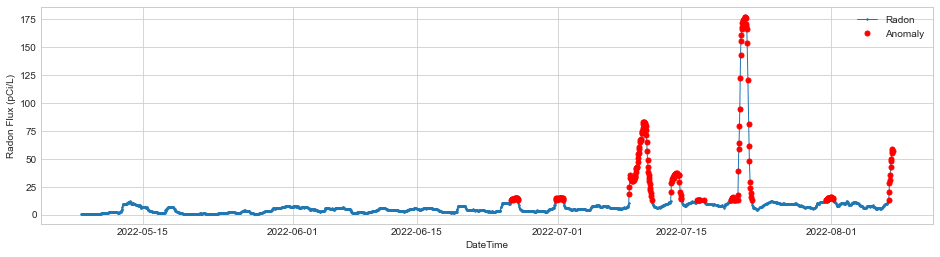

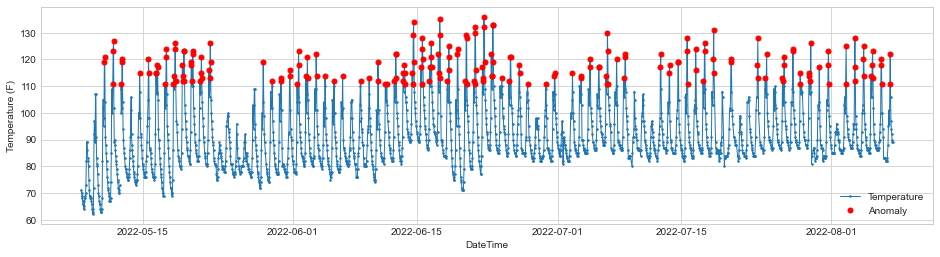

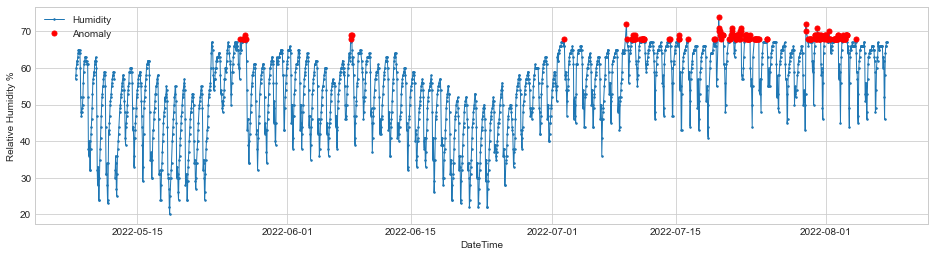

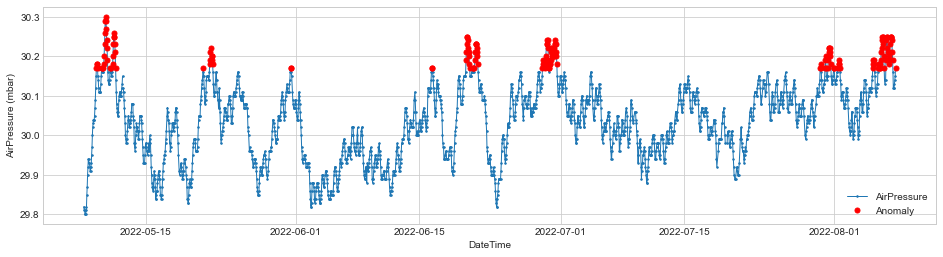

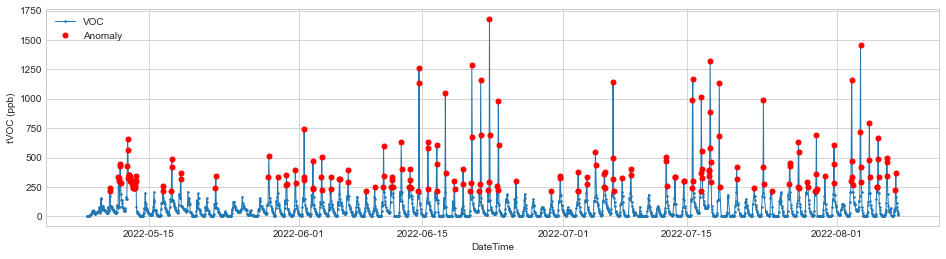

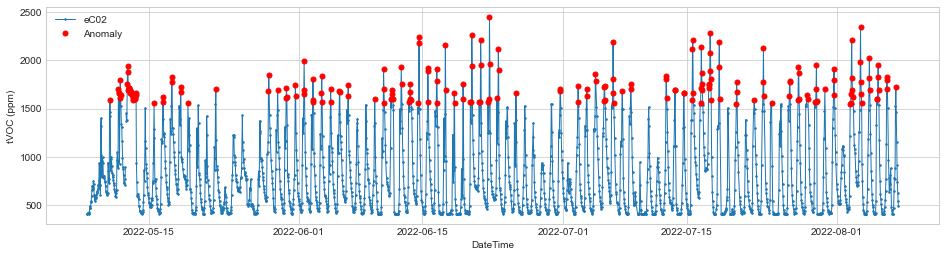

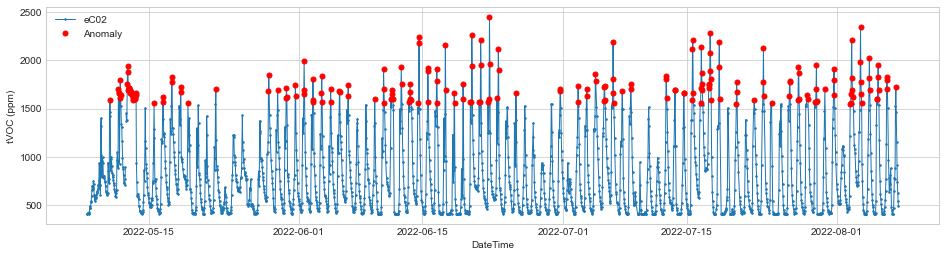

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.005616311995569434
Temp_lag_1 0.004614773801759224
Temp_lead_1 0.006858347681844291

Temp_lag_2 0.004474391929400453
Temp_lead_2 0.007656485704897024

Temp_lag_3 0.004623636499829732
Temp_lead_3 0.00781644054959755

Temp_lag_4 0.004524088382509308
Temp_lead_4 0.007344709964449341

Temp_lag_5 0.003989412918335307
Temp_lead_5 0.006688990532441226

Temp_lag_6 0.00359412613835253
Temp_lead_6 0.005644858920889525

Temp_lag_7 0.002267162988311825
Temp_lead_7 0.004499286006555234

Temp_lag_8 -0.0005594374035780299
Temp_lead_8 0.0031331843654472877

Temp_lag_9 -0.002050176471719411
Temp_lead_9 0.0016789756519792216

----------------------------------------------------------
Humidity 0.24555045924799163
Hum_lag_1 0.24593218935521138
Hum_lead_1 0.2442906637729948
Hum_lag_2 0.24576259170414375
Hum_lead_2 0.24340040870419255
Hum_lag_3 0.2451051966567776
Hum_lead_3 0.24283948417107068
Hum_lag_4 0.24446166316712817
Hum_lead_4 0.24269985793502674
Hum_lag_5 0.24411068286033027
Hum_lead_5

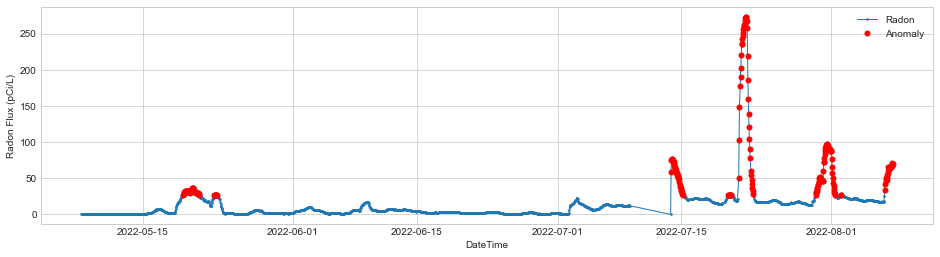

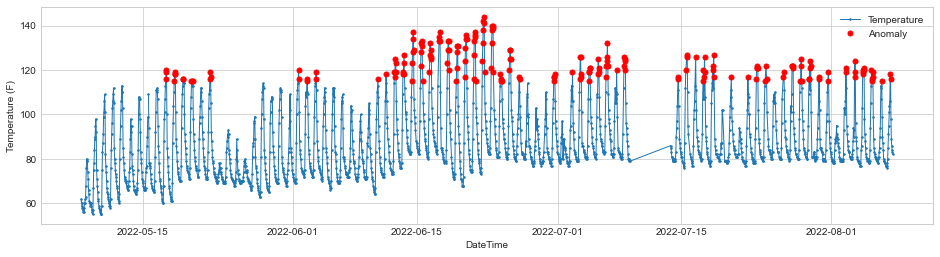

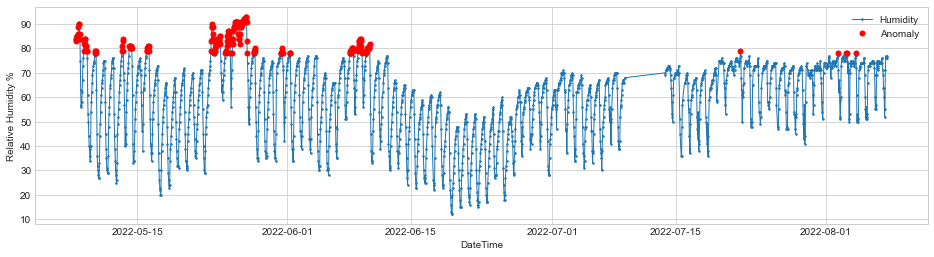

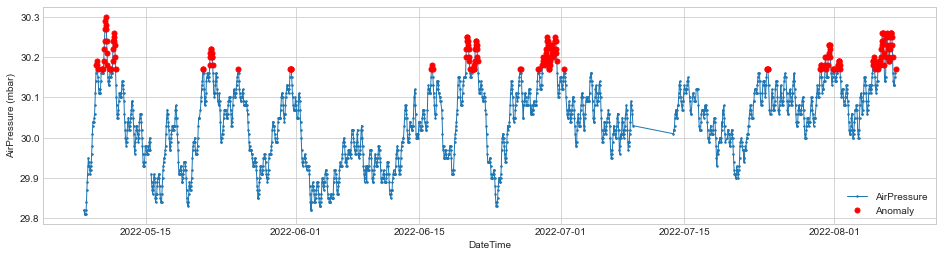

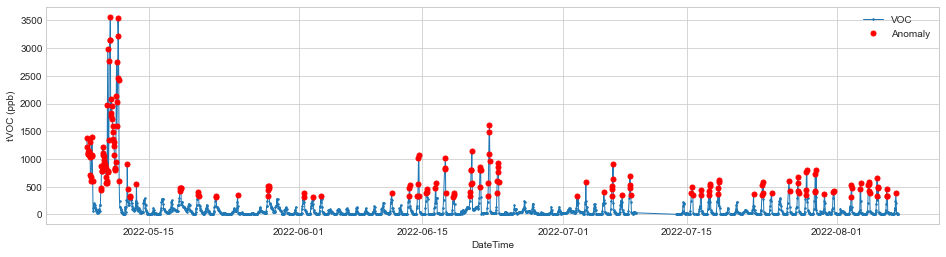

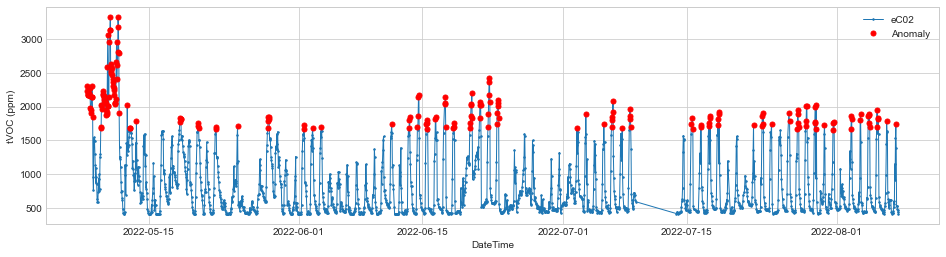

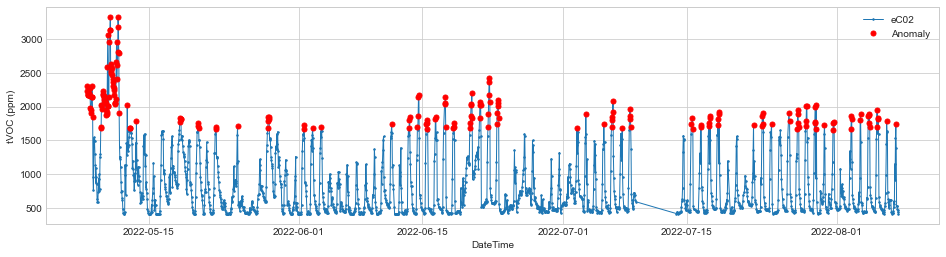

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.031490455267568905
Temp_lag_1 0.028027694096053577
Temp_lead_1 0.035231435860948186

Temp_lag_2 0.023909537025328057
Temp_lead_2 0.03818481768266109

Temp_lag_3 0.02027105904365059
Temp_lead_3 0.040526671990622966

Temp_lag_4 0.017094432089295435
Temp_lead_4 0.04262820384419762

Temp_lag_5 0.014457565914445
Temp_lead_5 0.0444168746734507

Temp_lag_6 0.011872278358339235
Temp_lead_6 0.04569029525825168

Temp_lag_7 0.008664757789427437
Temp_lead_7 0.04638040036731738

Temp_lag_8 0.006126715373789956
Temp_lead_8 0.046749476891394894

Temp_lag_9 0.004714664564443597
Temp_lead_9 0.04687047689130605

----------------------------------------------------------
Humidity 0.18139762639043674
Hum_lag_1 0.18273450214137318
Hum_lead_1 0.17926224120902
Hum_lag_2 0.18390897190233896
Hum_lead_2 0.17734167869699258
Hum_lag_3 0.18427445413504995
Hum_lead_3 0.17598072608209595
Hum_lag_4 0.184223081569229
Hum_lead_4 0.17459617626571752
Hum_lag_5 0.18404639321065222
Hum_lead_5 0.17335557412289

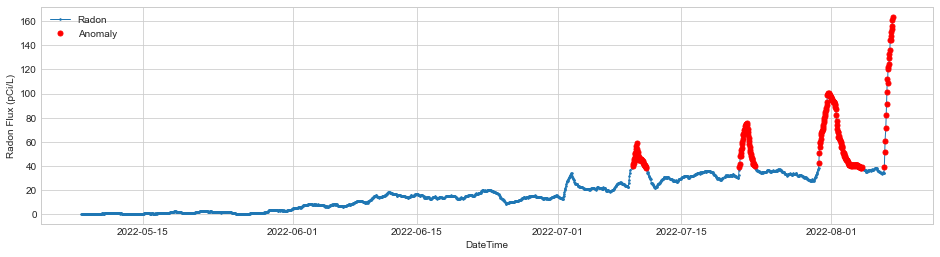

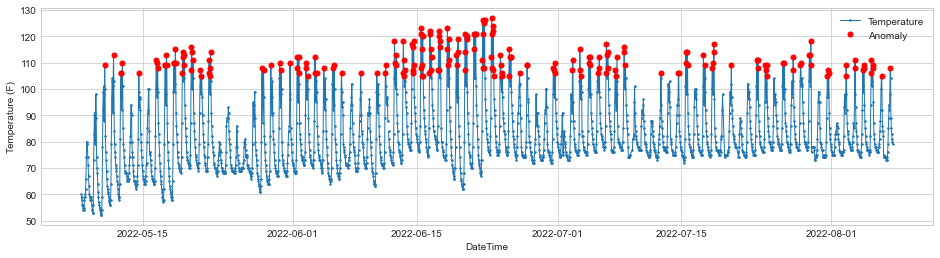

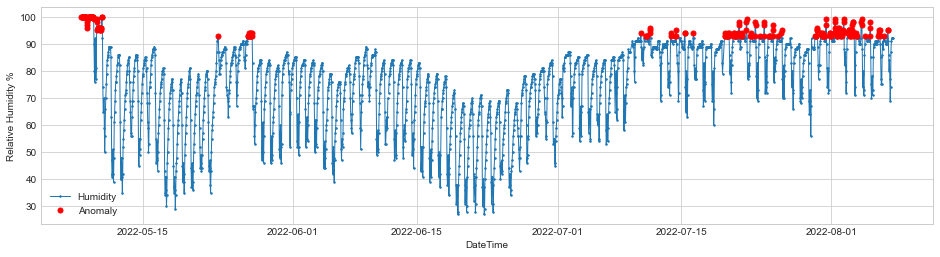

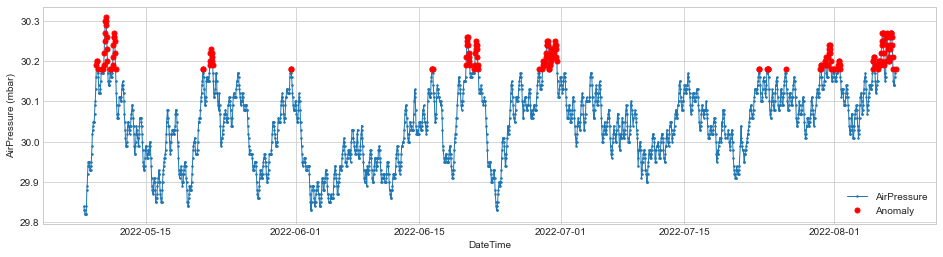

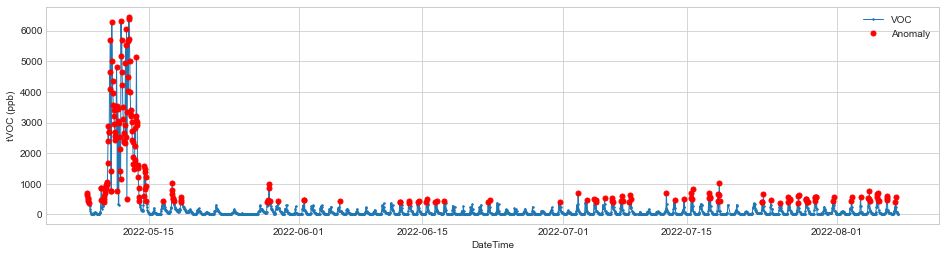

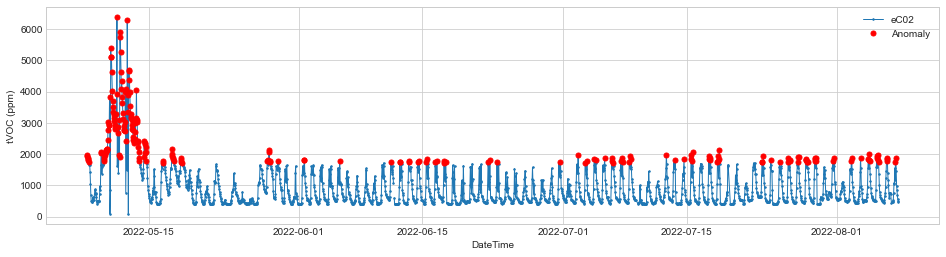

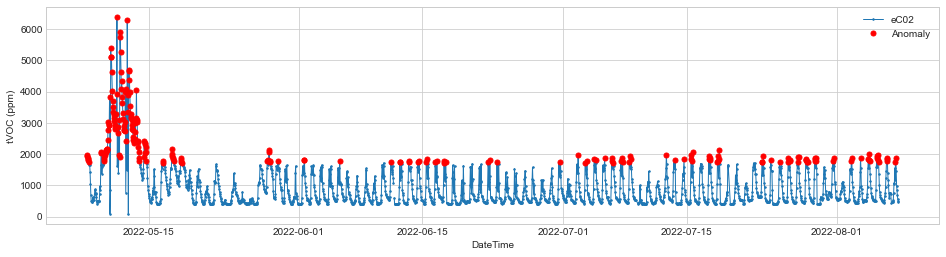

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.13080521924236976
Temp_lag_1 0.12986222017402546
Temp_lead_1 0.13307151851231336

Temp_lag_2 0.12872111359310318
Temp_lead_2 0.13504495800444766

Temp_lag_3 0.12732533835206208
Temp_lead_3 0.13691289577712779

Temp_lag_4 0.12544644700539404
Temp_lead_4 0.13826436767710443

Temp_lag_5 0.12325411382973929
Temp_lead_5 0.13925745651621713

Temp_lag_6 0.12053858585064112
Temp_lead_6 0.1399219999934271

Temp_lag_7 0.11472688488400083
Temp_lead_7 0.14014150160649014

Temp_lag_8 0.10820845467755133
Temp_lead_8 0.13989249849426394

Temp_lag_9 0.10433363932095291
Temp_lead_9 0.1389760883768508

----------------------------------------------------------
Humidity 0.375659581933035
Hum_lag_1 0.37563276096105574
Hum_lead_1 0.3778559518790473
Hum_lag_2 0.37557184116226167
Hum_lead_2 0.38002259827161994
Hum_lag_3 0.3754681197430926
Hum_lead_3 0.38210068585521684
Hum_lag_4 0.3753032859181149
Hum_lead_4 0.3844190731695596
Hum_lag_5 0.37533729437331453
Hum_lead_5 0.38664170262306785
Hum_lag

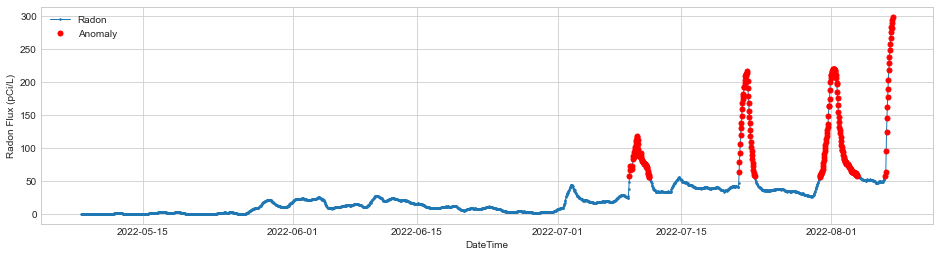

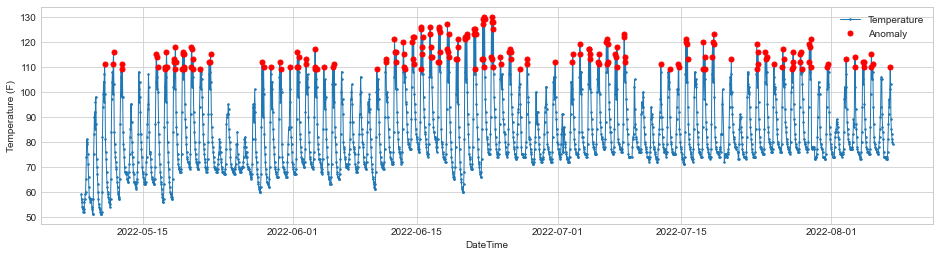

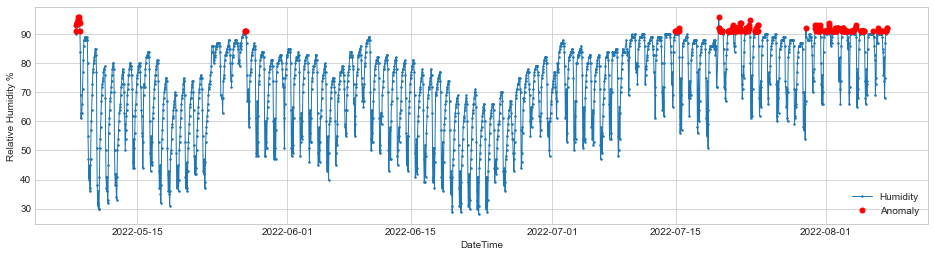

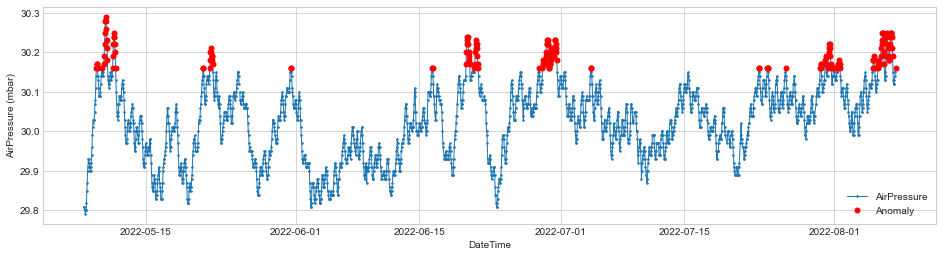

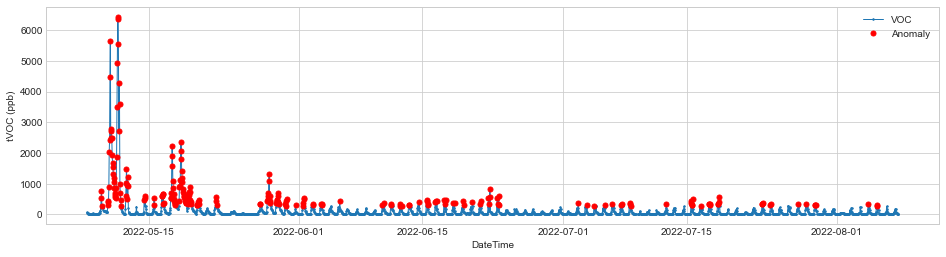

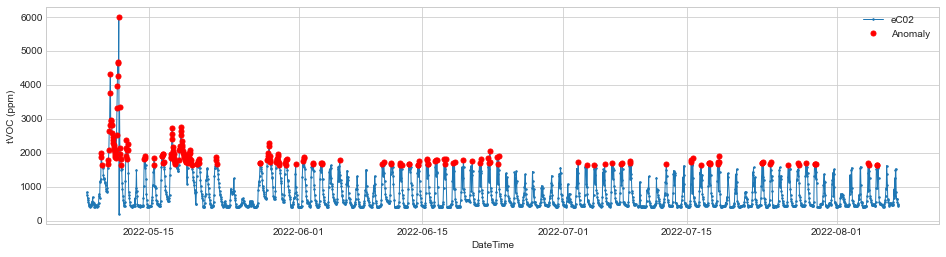

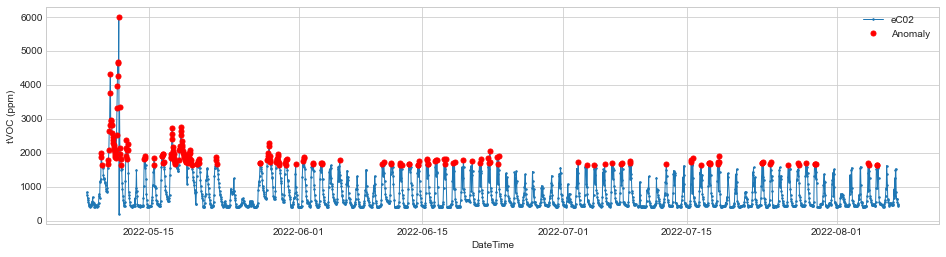

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.06252811084088036
Temp_lag_1 0.06148750756375063
Temp_lead_1 0.06421646896027731

Temp_lag_2 0.06007098493531582
Temp_lead_2 0.06539875076746406

Temp_lag_3 0.05859442328770406
Temp_lead_3 0.06618837269404944

Temp_lag_4 0.056871189978696966
Temp_lead_4 0.06652978879681154

Temp_lag_5 0.054844299694909206
Temp_lead_5 0.06625675957323722

Temp_lag_6 0.05208546639359913
Temp_lead_6 0.06541058248032888

Temp_lag_7 0.04653641759806319
Temp_lead_7 0.06436366599797276

Temp_lag_8 0.03986212232653501
Temp_lead_8 0.06317130749435446

Temp_lag_9 0.03537032854261055
Temp_lead_9 0.06182734719483384

----------------------------------------------------------
Humidity 0.3967633393384957
Hum_lag_1 0.39706702774435887
Hum_lead_1 0.3977952096792271
Hum_lag_2 0.3974217285070263
Hum_lead_2 0.39900801531931646
Hum_lag_3 0.3976868643750459
Hum_lead_3 0.4003923108722097
Hum_lag_4 0.39770221609910134
Hum_lead_4 0.4018376292713337
Hum_lag_5 0.3978178788718304
Hum_lead_5 0.4037626106152513
Hum_l

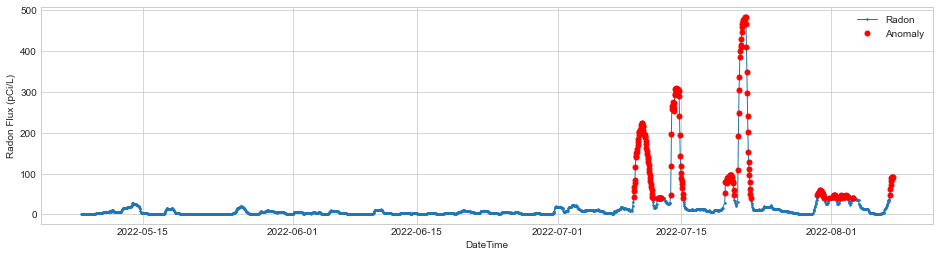

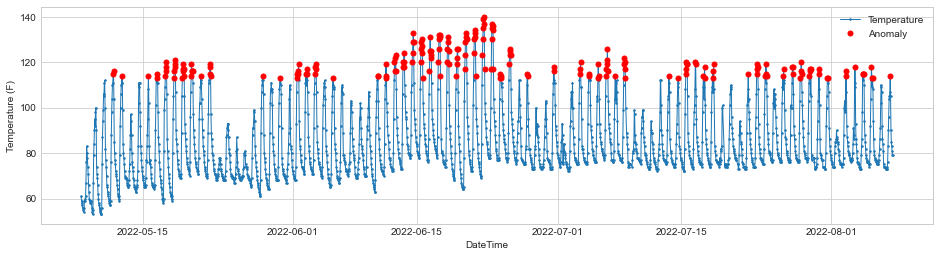

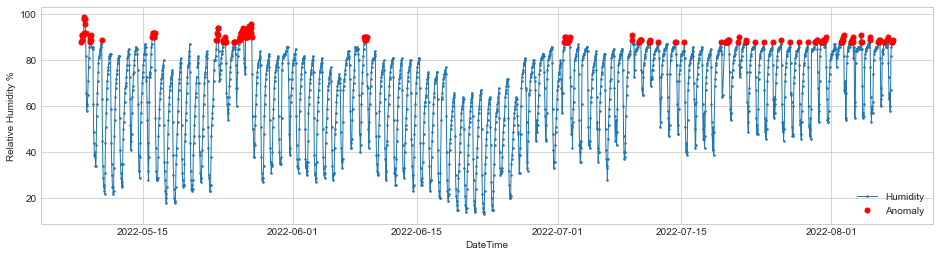

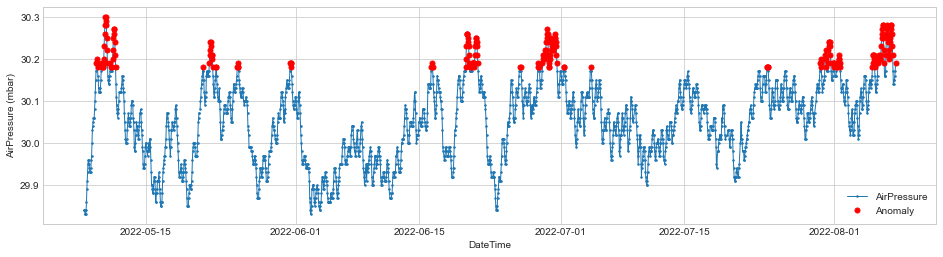

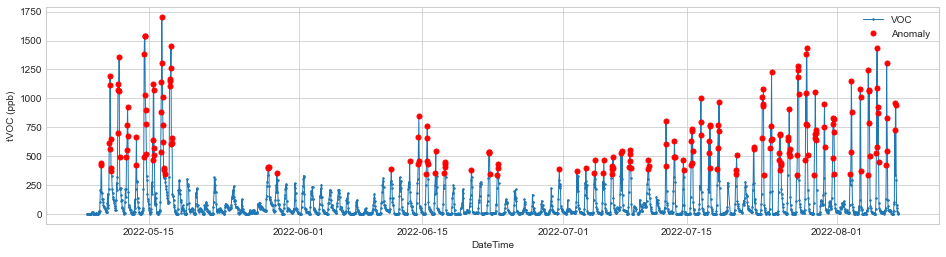

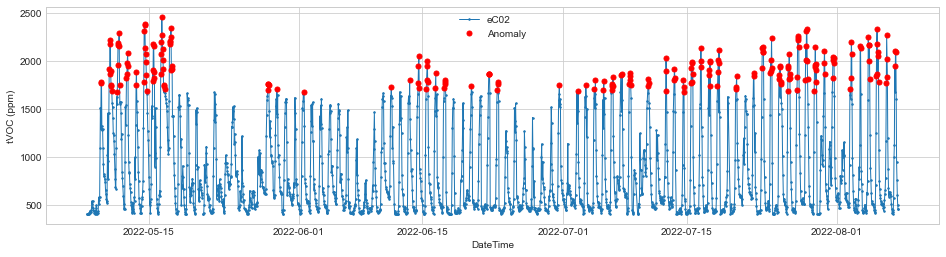

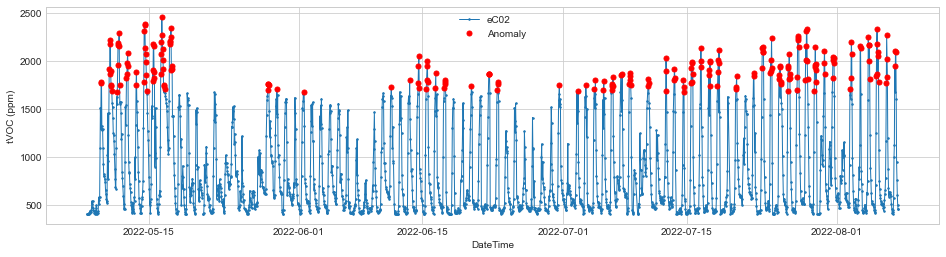

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature -0.035633558712875005
Temp_lag_1 -0.038309589327640226
Temp_lead_1 -0.03283740605747405

Temp_lag_2 -0.04009646252099977
Temp_lead_2 -0.02962510846666263

Temp_lag_3 -0.04098062021935344
Temp_lead_3 -0.026430684144012402

Temp_lag_4 -0.04148943013090586
Temp_lead_4 -0.023811782542890313

Temp_lag_5 -0.04193472040100165
Temp_lead_5 -0.02176886181625996

Temp_lag_6 -0.04282820193054508
Temp_lead_6 -0.020104640899133795

Temp_lag_7 -0.04404196419067655
Temp_lead_7 -0.018922986826792682

Temp_lag_8 -0.045905922782593214
Temp_lead_8 -0.018059798843997724

Temp_lag_9 -0.04758390554846694
Temp_lead_9 -0.017366462561545337

----------------------------------------------------------
Humidity 0.19154735732686462
Hum_lag_1 0.19450607928461744
Hum_lead_1 0.1881462754572124
Hum_lag_2 0.19674797349239878
Hum_lead_2 0.18425933139592948
Hum_lag_3 0.19813296586500717
Hum_lead_3 0.1803319277048886
Hum_lag_4 0.199111763839005
Hum_lead_4 0.17676671458663873
Hum_lag_5 0.19997877083941806
Hum_le

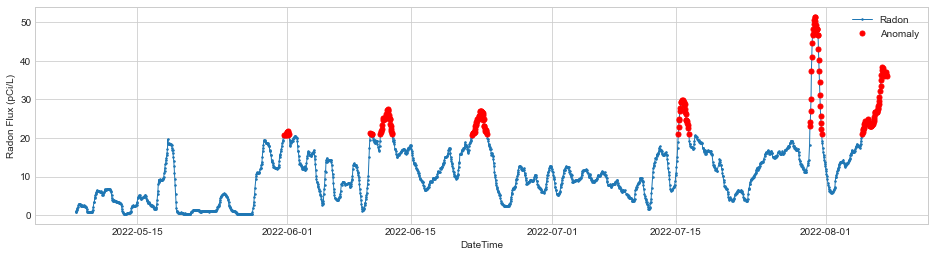

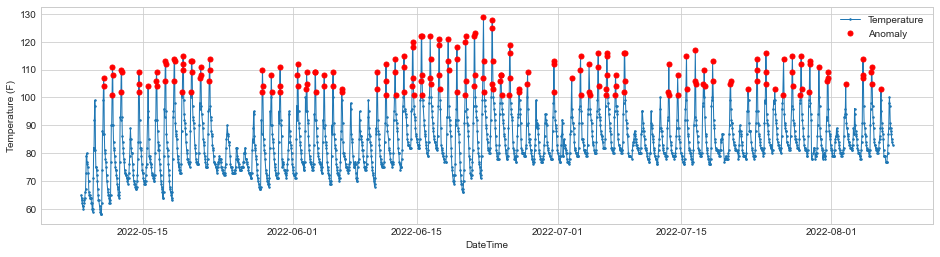

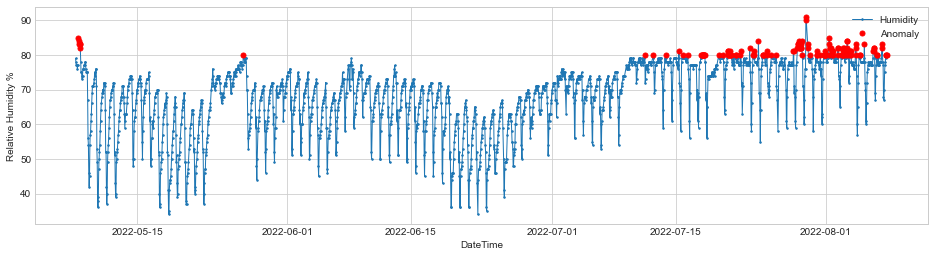

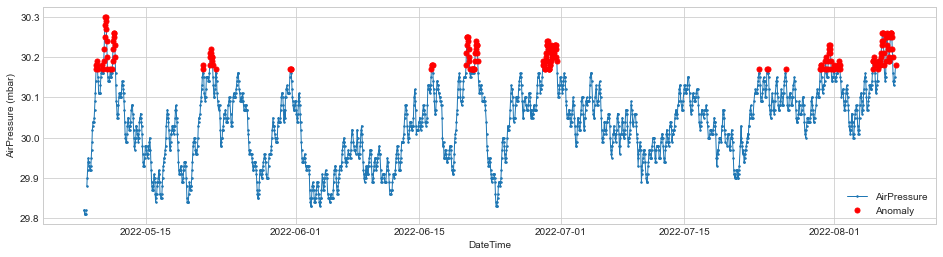

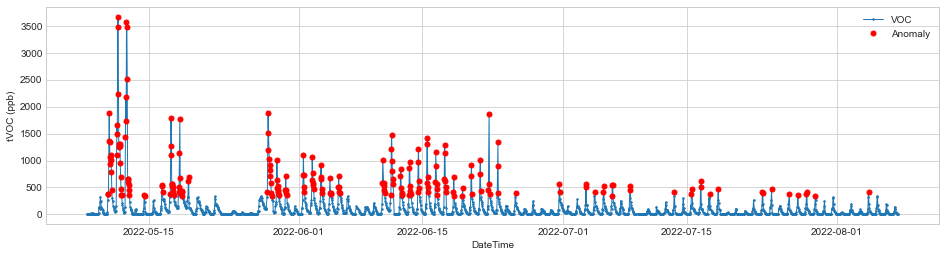

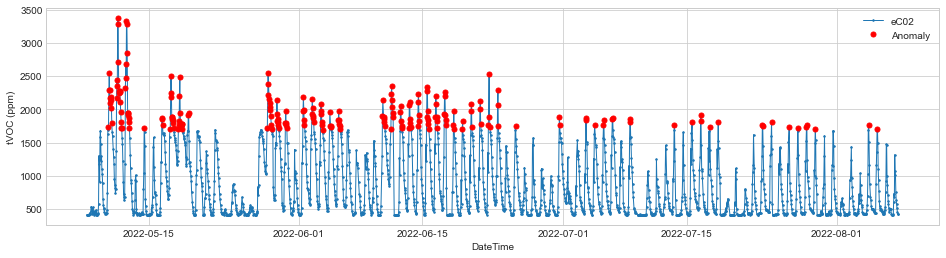

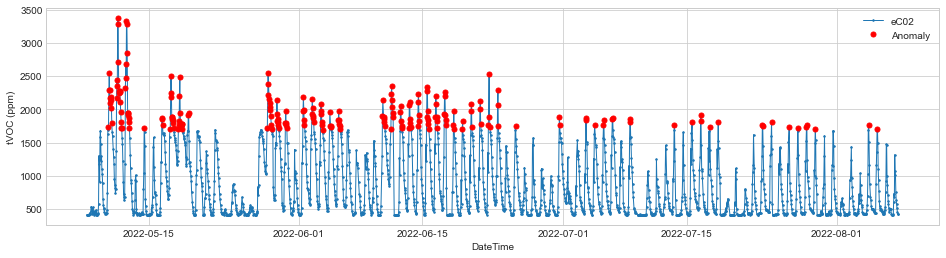

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.184482007565278
Temp_lag_1 0.17920797590815143
Temp_lead_1 0.18713323831320605

Temp_lag_2 0.1743973218163363
Temp_lead_2 0.18972831220992278

Temp_lag_3 0.1696766776146538
Temp_lead_3 0.19126972613741647

Temp_lag_4 0.16480064408402645
Temp_lead_4 0.19088627298023253

Temp_lag_5 0.1601363047692278
Temp_lead_5 0.18969810032394283

Temp_lag_6 0.15556065593667903
Temp_lead_6 0.18817656208409414

Temp_lag_7 0.15110625931466076
Temp_lead_7 0.18659859030895448

Temp_lag_8 0.14700792527647913
Temp_lead_8 0.18686604811159319

Temp_lag_9 0.14204978395445605
Temp_lead_9 0.18587937850193423

----------------------------------------------------------
Humidity 0.11701601707334533
Hum_lag_1 0.11961568470814844
Hum_lead_1 0.11535416955293208
Hum_lag_2 0.12190511788406218
Hum_lead_2 0.11316819394875975
Hum_lag_3 0.12408557546607277
Hum_lead_3 0.1116986828965225
Hum_lag_4 0.12647061676220145
Hum_lead_4 0.11171163165413683
Hum_lag_5 0.12925042819919966
Hum_lead_5 0.11247916043581979
Hum_l

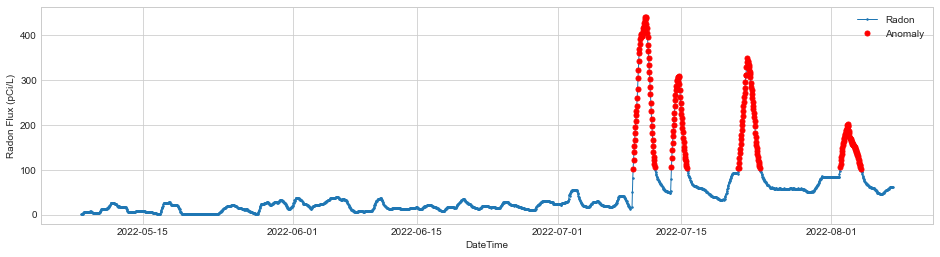

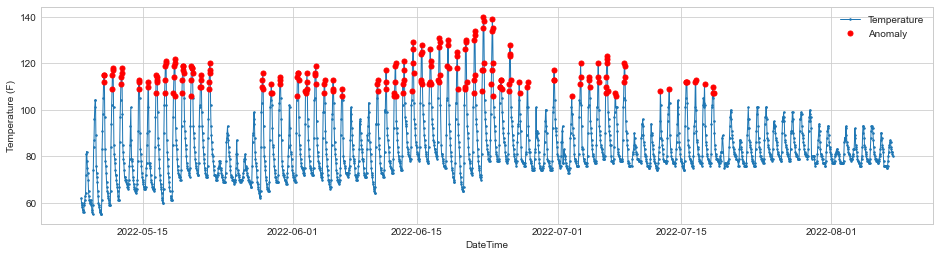

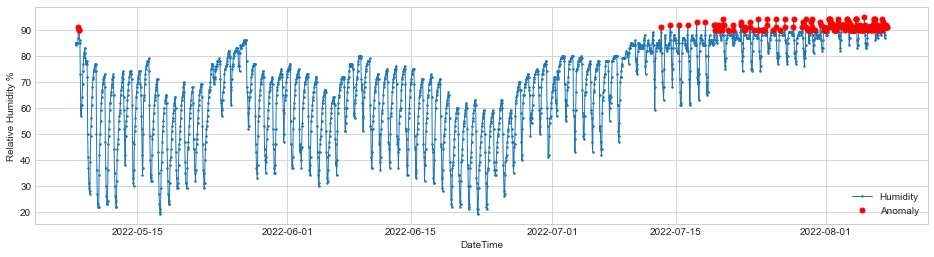

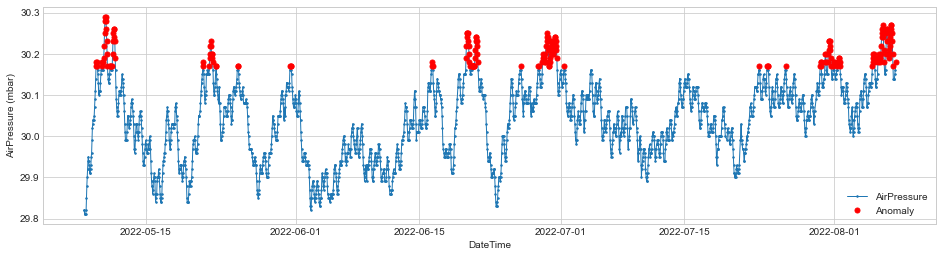

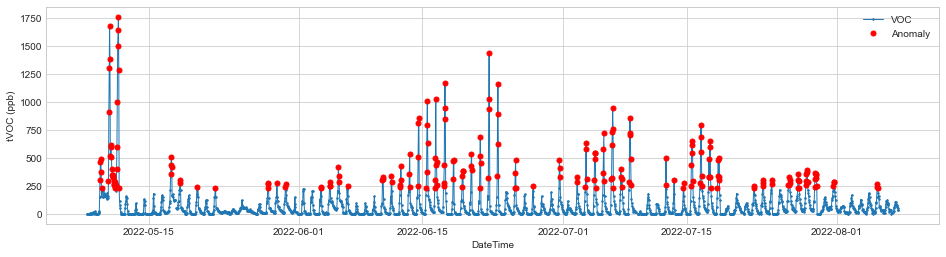

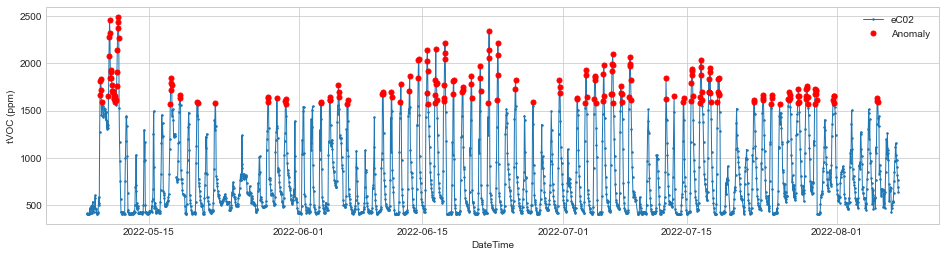

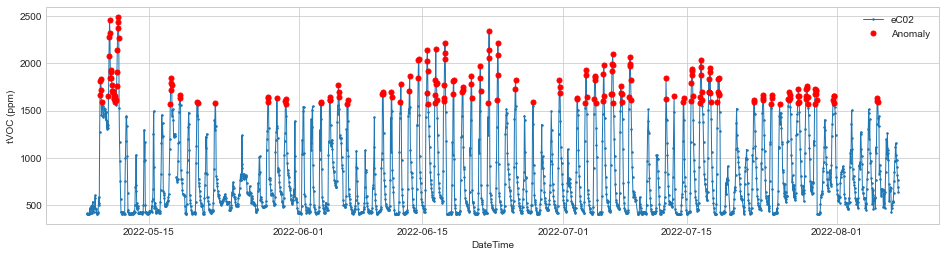

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature -0.02324481863819133
Temp_lag_1 -0.025002960191062885


In [ ]:
import matplotlib.pyplot as plt
for key in df_radon:
    print(key)
    df = df_radon[key]
    df['SyncDate'] = pd.to_datetime(df['SyncDate'])
    df.sort_values(by='SyncDate', ascending=True, inplace=True)
    df['SyncDate'] = df['SyncDate'].dt.floor('H')
    df = df.resample('H', on = 'SyncDate').mean()
    df.drop_duplicates(inplace=True)
    df['temp_outdoor'] = weather_station['Outdoor Temperature (°F)']
    df['humidity_outdoor'] = weather_station['Outdoor Humidity (%)']
    df['temp_feels_like'] = weather_station['Feels Like (°F)']
    df['rain'] = weather_station['Hourly Rain (in/hr)']
    s_rad = pd.Series(df['Radon'], index=df.index)
    s_rad = validate_series(s_rad)
    q_ad = QuantileAD(high=0.9)
    anomalies_radon = q_ad.fit_detect(s_rad)
    plot(s_rad, anomaly=anomalies_radon, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker", )
    plt.xlabel('DateTime')
    plt.ylabel('Radon Flux (pCi/L)')
    plt.show()
    df['anomalies_radon'] = anomalies_radon
    s_temp = pd.Series(df['Temperature'], index=df.index)
    s_temp = validate_series(s_temp)
    q_ad = QuantileAD(high=0.9)
    anomalies_temp = q_ad.fit_detect(s_temp)
    plot(s_temp, anomaly=anomalies_temp, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker")
    plt.xlabel('DateTime')
    plt.ylabel('Temperature (F)')
    plt.show()
    df['anomalies_temp'] = anomalies_temp
    s_hum = pd.Series(df['Humidity'], index=df.index)
    s_hum = validate_series(s_hum)
    q_ad = QuantileAD(high=0.9)
    anomalies_hum = q_ad.fit_detect(s_hum)
    plot(s_hum, anomaly=anomalies_hum, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker");
    plt.xlabel('DateTime')
    plt.ylabel('Relative Humidity %')
    plt.show()
    df['anomalies_hum'] = anomalies_hum
    s_pres = pd.Series(df['AirPressure'], index=df.index)
    s_pres = validate_series(s_pres)
    q_ad = QuantileAD(high=0.9)
    anomalies_pres = q_ad.fit_detect(s_pres)
    plot(s_pres, anomaly=anomalies_pres, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker");
    plt.xlabel('DateTime')
    plt.ylabel('AirPressure (mbar)')
    plt.show()
    df['anomalies_pres'] = anomalies_pres
    s_VOC = pd.Series(df['VOC'], index=df.index)
    s_VOC = validate_series(s_VOC)
    q_ad = QuantileAD(high=0.9)
    anomalies_VOC = q_ad.fit_detect(s_VOC)
    plot(s_VOC, anomaly=anomalies_VOC, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker");
    plt.xlabel('DateTime')
    plt.ylabel('tVOC (ppb)')
    plt.show()
    df['anomalies_VOC'] = anomalies_VOC
    s_eC02 = pd.Series(df['eC02'], index=df.index)
    s_eC02 = validate_series(s_eC02)
    q_ad = QuantileAD(high=0.9)
    anomalies_eC02 = q_ad.fit_detect(s_eC02)
    plot(s_eC02, anomaly=anomalies_eC02, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker");
    plt.xlabel('DateTime')
    plt.ylabel('tVOC (ppm)')
    plt.show()
    df['anomalies_eC02'] = anomalies_eC02
    s_rain = pd.Series(df['rain'], index=df.index)
    s_rain = validate_series(s_eC02)
    q_ad = QuantileAD(high=0.9)
    anomalies_rain = q_ad.fit_detect(s_rain)
    plot(s_rain, anomaly=anomalies_rain, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker");
    plt.xlabel('DateTime')
    plt.ylabel('tVOC (ppm)')
    plt.show()
    df['anomalies_rain'] = anomalies_rain
    for i in range(1,10):
        df['Temp_lag_'+str(i)] = df['Temperature'].shift(i)
        df['Temp_anomaly_lag_'+str(i)] = df['anomalies_temp'].shift(i)
        df['Temp_lead_'+str(i)] = df['Temperature'].shift(-i)
        df['Temp_anomaly_lead_'+str(i)] = df['anomalies_temp'].shift(-i)
        df['Hum_lag_'+str(i)] = df['Humidity'].shift(i)
        df['Hum_anomaly_lag_'+str(i)] = df['anomalies_hum'].shift(i)
        df['Hum_lead_'+str(i)] = df['Humidity'].shift(-i)
        df['Hum_anomaly_lead_'+str(i)] = df['anomalies_hum'].shift(-i)
        df['Pres_lag_'+str(i)] = df['AirPressure'].shift(i)
        df['Pres_anomaly_lag_'+str(i)] = df['anomalies_pres'].shift(i)
        df['Pres_lead_'+str(i)] = df['AirPressure'].shift(-i)
        df['Pres_anomaly_lead_'+str(i)] = df['anomalies_pres'].shift(-i)
        df['VOC_lag_'+str(i)] = df['VOC'].shift(i)
        df['VOC_anomaly_lag_'+str(i)] = df['anomalies_VOC'].shift(i)
        df['VOC_lead_'+str(i)] = df['VOC'].shift(-i)
        df['VOC_anomaly_lead_'+str(i)] = df['anomalies_VOC'].shift(-i)
        df['eC02_lag_'+str(i)] = df['eC02'].shift(i)
        df['eC02_anomaly_lag_'+str(i)] = df['anomalies_eC02'].shift(i)
        df['eC02_lead_'+str(i)] = df['eC02'].shift(-i)
        df['eC02_anomaly_lead_'+str(i)] = df['anomalies_eC02'].shift(-i)
        df['temp_outdoor_lag_'+str(i)] = df['temp_outdoor'].shift(i)
        df['temp_outdoor_lead_'+str(i)] = df['temp_outdoor'].shift(-i)
        df['humidity_outdoor_lag_'+str(i)] = df['humidity_outdoor'].shift(i)
        df['humidity_outdoor_lead_'+str(i)] = df['humidity_outdoor'].shift(-i)
        df['temp_feels_like_lag_'+str(i)] = df['temp_feels_like'].shift(i)
        df['temp_feels_like_lead_'+str(i)] = df['temp_feels_like'].shift(-i)
        df['rain_lag_'+str(i)] = df['rain'].shift(i)
        df['rain_lead_'+str(i)] = df['rain'].shift(-i)
    print("Temperature" ,df.corr()['Radon']['Temperature'])
    for i in range(1,10): 
        print(f"Temp_lag_{i}", df.corr()['Radon'][f'Temp_lag_{i}'])
        print(f"Temp_lead_{i}", df.corr()['Radon'][f'Temp_lead_{i}'])
        print()
    print("----------------------------------------------------------")
    print("Humidity",df.corr()['Radon']['Humidity'])
    for i in range(1,10):
        print(f"Hum_lag_{i}", df.corr()['Radon'][f'Hum_lag_{i}'])
        print(f"Hum_lead_{i}", df.corr()['Radon'][f'Hum_lead_{i}'])
    print("----------------------------------------------------------")
    print("Pressure",df.corr()['Radon']['AirPressure'])
    for i in range(1,10):
        print(f"Pres_lag_{i}", df.corr()['Radon'][f'Pres_lag_{i}'])
        print(f"Pres_lead_{i}", df.corr()['Radon'][f'Pres_lead_{i}'])
    print("----------------------------------------------------------")
    print("VOC",df.corr()['Radon']['VOC'])
    for i in range(1,10):
        print(f"VOC_lag_{i}", df.corr()['Radon'][f'VOC_lag_{i}'])
        print(f"VOC_lead_{i}", df.corr()['Radon'][f'VOC_lead_{i}'])
    print("----------------------------------------------------------")
    print("eC02",df.corr()['Radon']['eC02'])
    for i in range(1,10):
        print(f"eC02_lag_{i}", df.corr()['Radon'][f'eC02_lag_{i}'])
        print(f"eC02_lead_{i}", df.corr()['Radon'][f'eC02_lead_{i}'])
    print("----------------------------------------------------------")
    print("outdoor temperature",df.corr()['Radon']['temp_outdoor'])
    for i in range(1,10):
        print(f"outdoor temperature_lag_{i}", df.corr()['Radon'][f'temp_outdoor_lag_{i}'])
        print(f"outdoor temperature_lead_{i}", df.corr()['Radon'][f'temp_outdoor_lead_{i}'])
    print("----------------------------------------------------------")
    print("humidity outdoor",df.corr()['Radon']['humidity_outdoor'])
    for i in range(1,10):
        print(f"humidity_outdoor_lag_{i}", df.corr()['Radon'][f'humidity_outdoor_lag_{i}'])
        print(f"humidity_outdoor_lead_{i}", df.corr()['Radon'][f'humidity_outdoor_lead_{i}'])
    print("----------------------------------------------------------")
    print("Feels like",df.corr()['Radon']['temp_feels_like'])
    for i in range(1,10):
        print(f"temp_feels_like_lag_{i}", df.corr()['Radon'][f'temp_feels_like_lag_{i}'])
        print(f"temp_feels_like_lead_{i}", df.corr()['Radon'][f'temp_feels_like_lead_{i}'])
    print("----------------------------------------------------------")
    print("rain",df.corr()['Radon']['rain'])
    for i in range(1,10):
        print(f"rain_lag_{i}", df.corr()['Radon'][f'rain_lag_{i}'])
        print(f"rain_lead_{i}", df.corr()['Radon'][f'rain_lead_{i}'])
    print("----------------------------------------------------------")
    print()
    print()

1


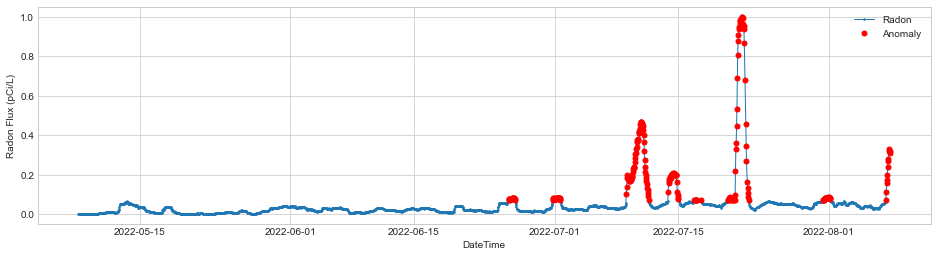

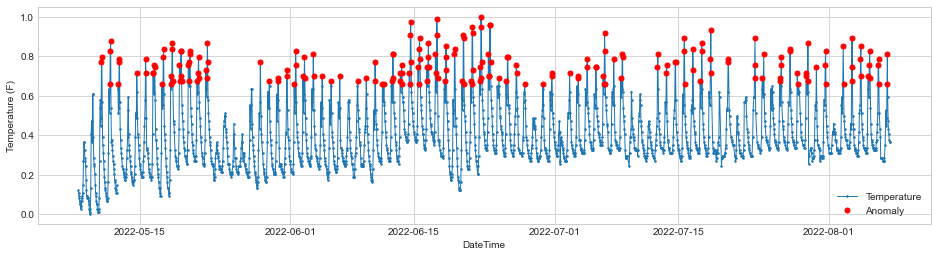

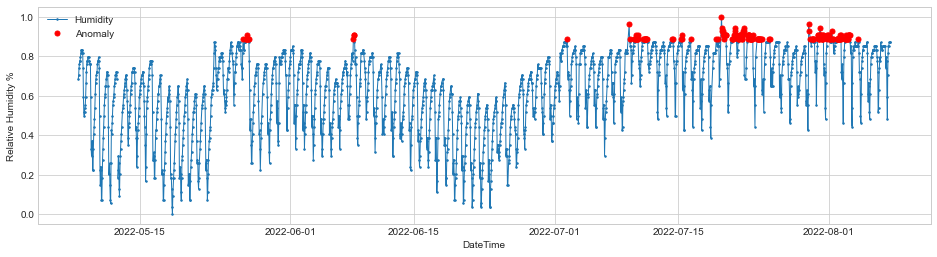

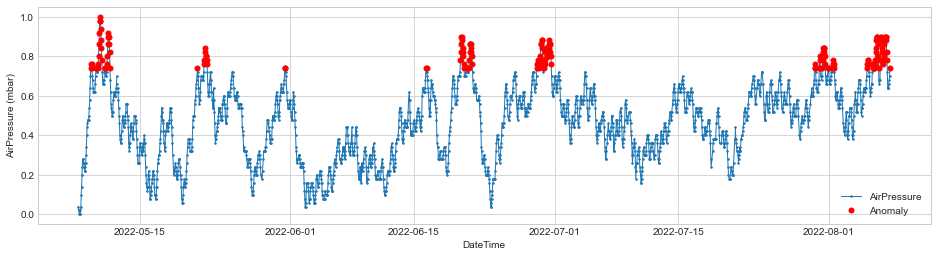

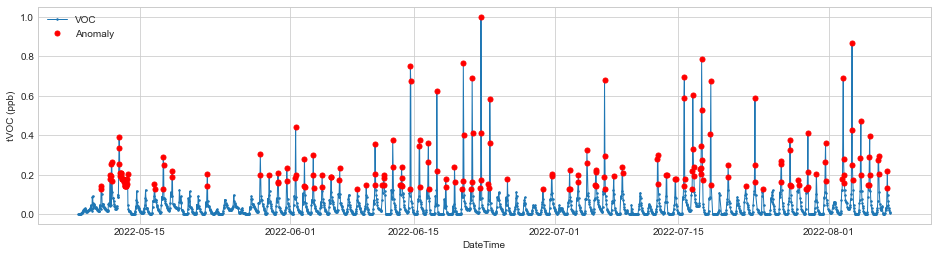

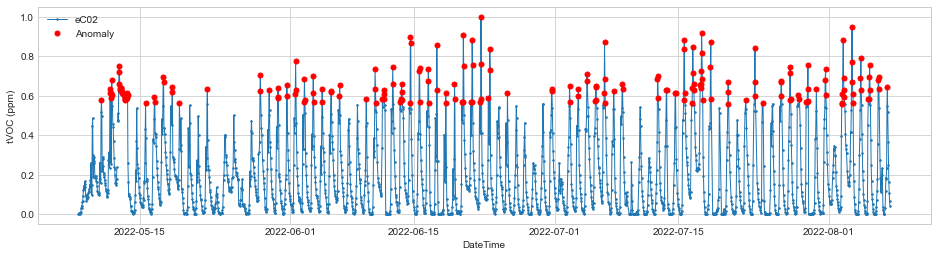

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.005616311995568729
Temp_lag_1 0.004614773801762024
Temp_lead_1 0.006858347681845923

Temp_lag_2 0.004474391929400016
Temp_lead_2 0.007656485704896451

Temp_lag_3 0.004623636499829355
Temp_lead_3 0.007816440549596383

Temp_lag_4 0.004524088382508768
Temp_lead_4 0.007344709964450301

Temp_lag_5 0.003989412918334466
Temp_lead_5 0.006688990532439212

Temp_lag_6 0.0035941261383538605
Temp_lead_6 0.005644858920888265

Temp_lag_7 0.0022671629883127056
Temp_lead_7 0.00449928600655592

Temp_lag_8 -0.000559437403576756
Temp_lead_8 0.0031331843654466957

Temp_lag_9 -0.00205017647172219
Temp_lead_9 0.001678975651979026

----------------------------------------------------------
Humidity 0.24555045924799432
Hum_lag_1 0.24593218935521
Hum_lead_1 0.24429066377299363
Hum_lag_2 0.2457625917041433
Hum_lead_2 0.2434004087041944
Hum_lag_3 0.2451051966567781
Hum_lead_3 0.24283948417107107
Hum_lag_4 0.24446166316712614
Hum_lead_4 0.2426998579350264
Hum_lag_5 0.2441106828603288
Hum_lead_5 0.242

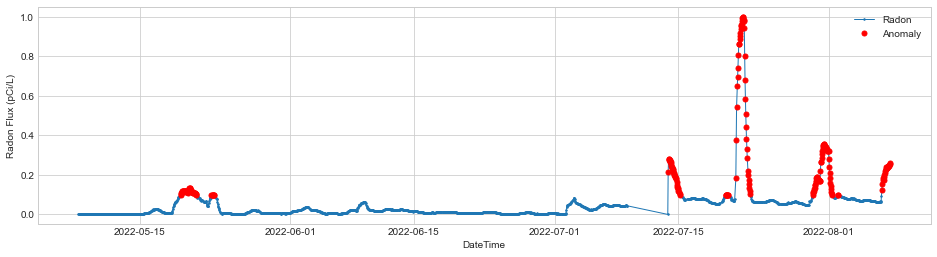

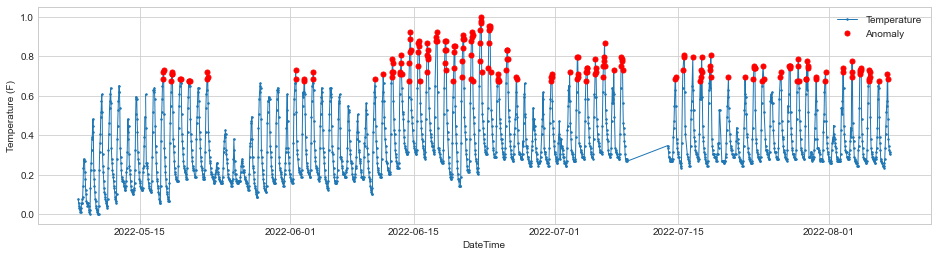

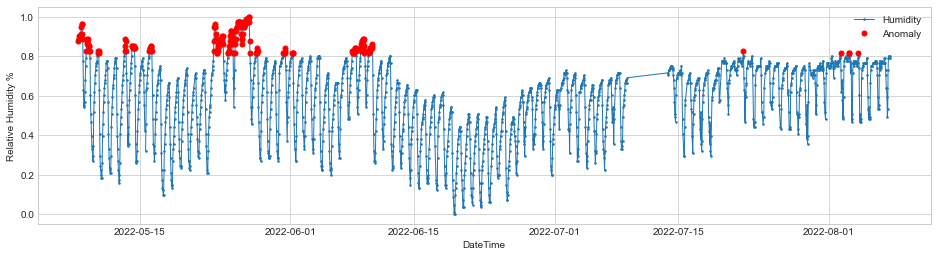

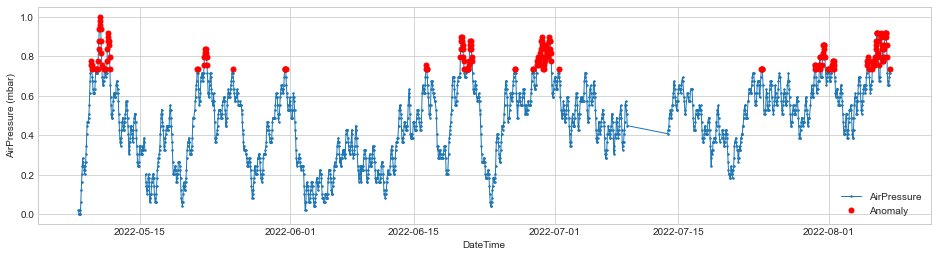

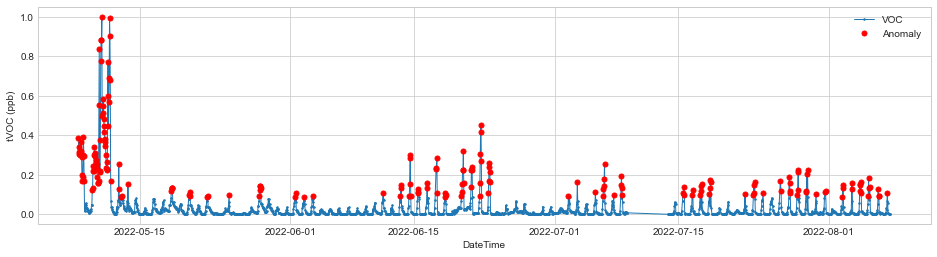

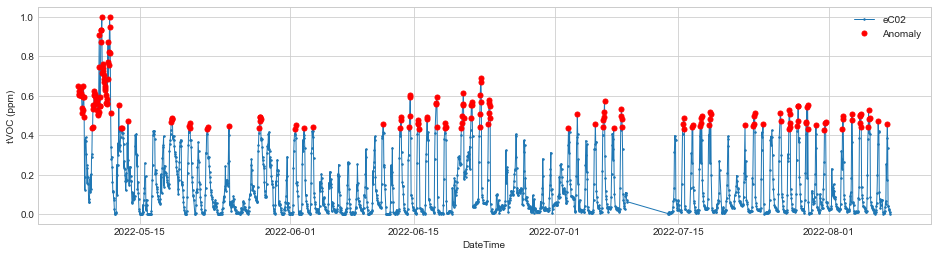

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.0314904552675684
Temp_lag_1 0.02802769409605449
Temp_lead_1 0.03523143586094769

Temp_lag_2 0.023909537025324997
Temp_lead_2 0.03818481768266183

Temp_lag_3 0.020271059043651174
Temp_lead_3 0.04052667199062474

Temp_lag_4 0.017094432089294134
Temp_lead_4 0.042628203844199616

Temp_lag_5 0.014457565914442168
Temp_lead_5 0.044416874673450533

Temp_lag_6 0.01187227835834082
Temp_lead_6 0.045690295258251565

Temp_lag_7 0.008664757789427505
Temp_lead_7 0.04638040036731456

Temp_lag_8 0.006126715373787192
Temp_lead_8 0.04674947689139265

Temp_lag_9 0.004714664564440872
Temp_lead_9 0.04687047689130436

----------------------------------------------------------
Humidity 0.18139762639043444
Hum_lag_1 0.18273450214137377
Hum_lead_1 0.17926224120901935
Hum_lag_2 0.18390897190233987
Hum_lead_2 0.17734167869699416
Hum_lag_3 0.18427445413505
Hum_lead_3 0.17598072608209636
Hum_lag_4 0.1842230815692254
Hum_lead_4 0.17459617626571616
Hum_lag_5 0.18404639321065383
Hum_lead_5 0.173355574122

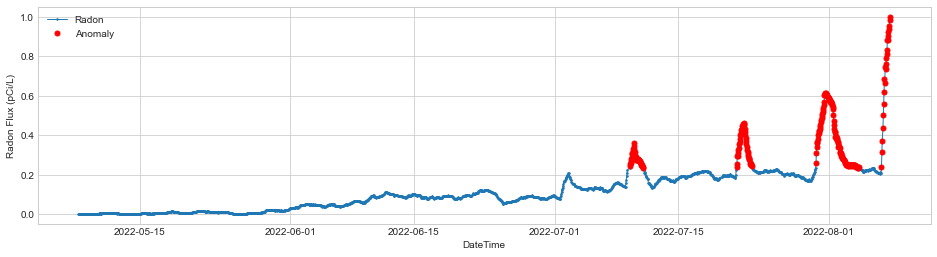

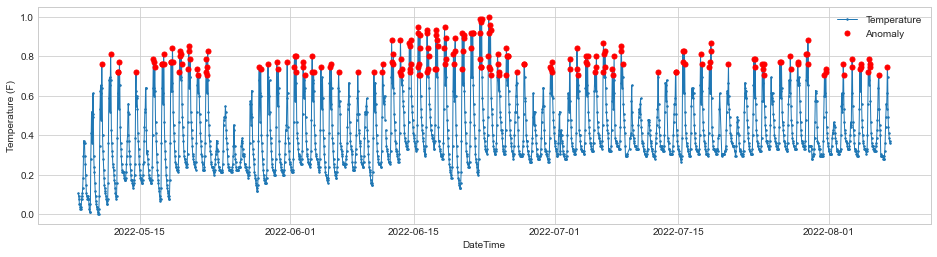

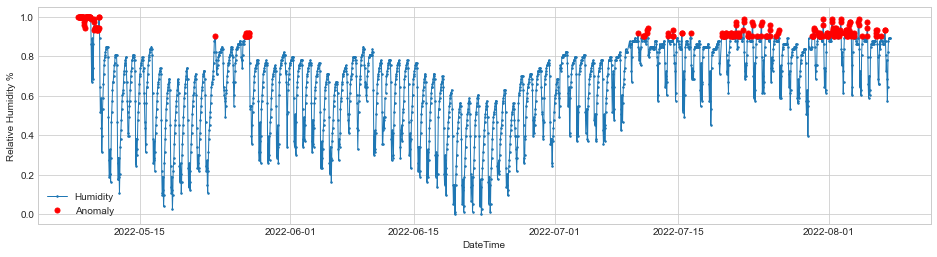

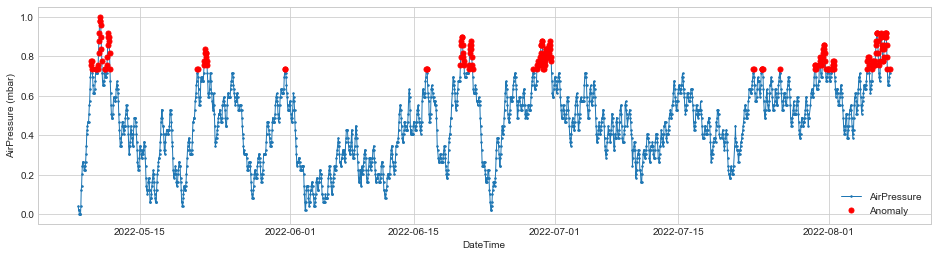

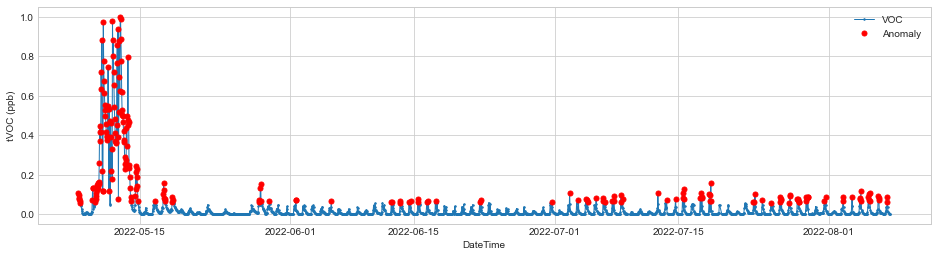

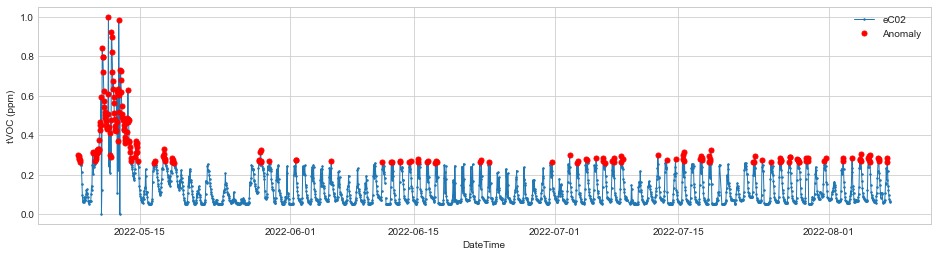

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.13080521924237257
Temp_lag_1 0.12986222017402618
Temp_lead_1 0.13307151851231522

Temp_lag_2 0.1287211135931086
Temp_lead_2 0.13504495800444385

Temp_lag_3 0.12732533835206158
Temp_lead_3 0.136912895777122

Temp_lag_4 0.125446447005399
Temp_lead_4 0.13826436767710568

Temp_lag_5 0.12325411382974309
Temp_lead_5 0.1392574565162212

Temp_lag_6 0.1205385858506433
Temp_lead_6 0.13992199999342708

Temp_lag_7 0.11472688488399739
Temp_lead_7 0.14014150160648928

Temp_lag_8 0.10820845467755853
Temp_lead_8 0.13989249849426363

Temp_lag_9 0.10433363932095185
Temp_lead_9 0.13897608837684733

----------------------------------------------------------
Humidity 0.375659581933033
Hum_lag_1 0.3756327609610559
Hum_lead_1 0.37785595187904675
Hum_lag_2 0.3755718411622643
Hum_lead_2 0.38002259827161894
Hum_lag_3 0.3754681197430908
Hum_lead_3 0.38210068585521706
Hum_lag_4 0.3753032859181174
Hum_lead_4 0.38441907316955687
Hum_lag_5 0.3753372943733133
Hum_lead_5 0.38664170262306363
Hum_lag_6 0.3

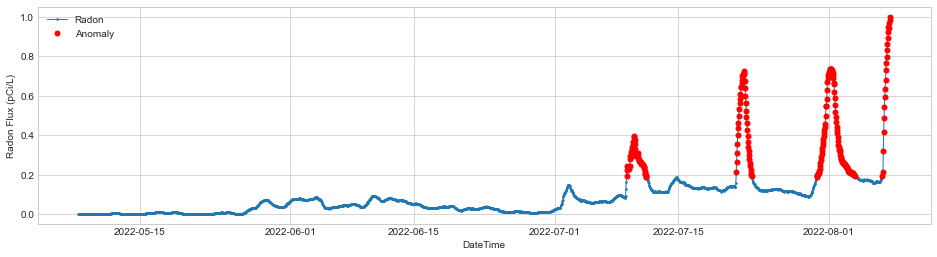

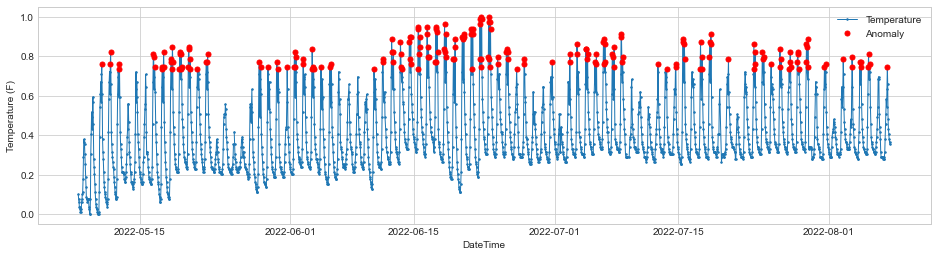

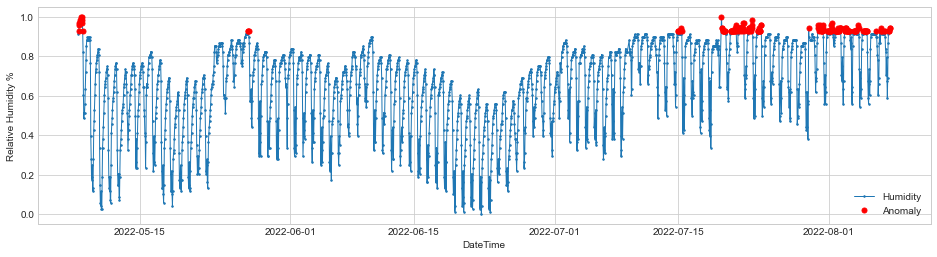

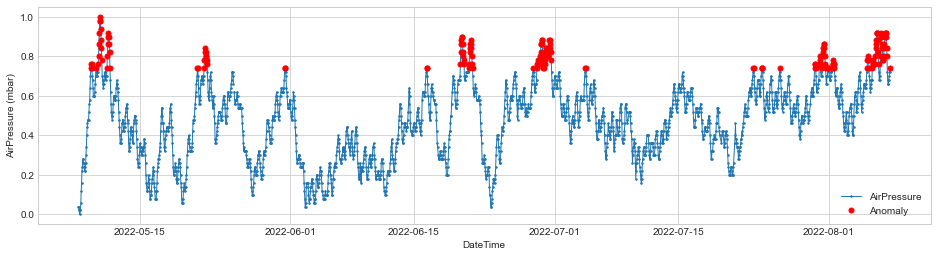

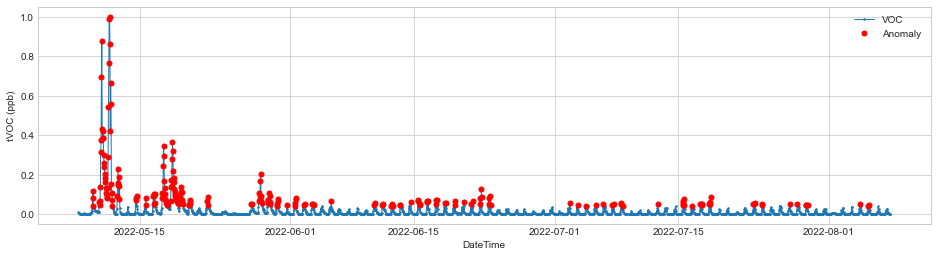

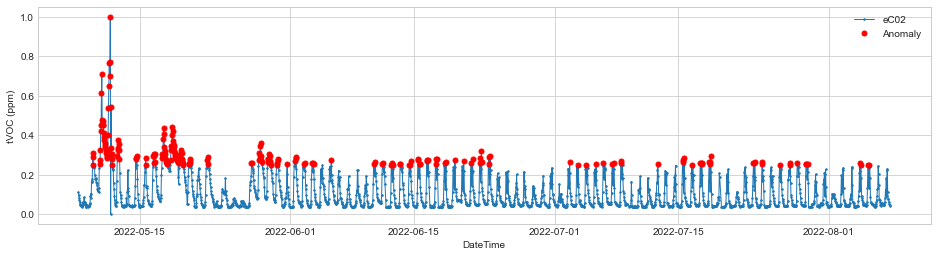

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.06252811084087997
Temp_lag_1 0.06148750756375259
Temp_lead_1 0.06421646896027597

Temp_lag_2 0.060070984935311884
Temp_lead_2 0.06539875076746168

Temp_lag_3 0.058594423287702715
Temp_lead_3 0.06618837269404859

Temp_lag_4 0.0568711899786965
Temp_lead_4 0.06652978879681161

Temp_lag_5 0.05484429969491028
Temp_lead_5 0.06625675957324063

Temp_lag_6 0.05208546639359772
Temp_lead_6 0.06541058248032605

Temp_lag_7 0.046536417598062096
Temp_lead_7 0.06436366599797473

Temp_lag_8 0.039862122326536055
Temp_lead_8 0.06317130749435773

Temp_lag_9 0.03537032854261163
Temp_lead_9 0.06182734719483408

----------------------------------------------------------
Humidity 0.3967633393384948
Hum_lag_1 0.3970670277443575
Hum_lead_1 0.3977952096792261
Hum_lag_2 0.3974217285070264
Hum_lead_2 0.399008015319311
Hum_lag_3 0.3976868643750492
Hum_lead_3 0.4003923108722114
Hum_lag_4 0.39770221609910256
Hum_lead_4 0.40183762927133465
Hum_lag_5 0.39781787887182674
Hum_lead_5 0.4037626106152547
Hum_l

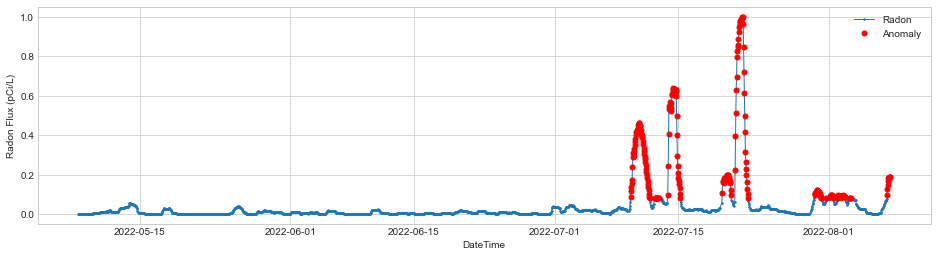

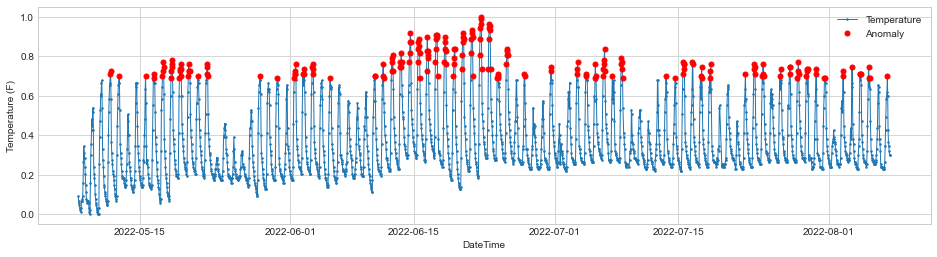

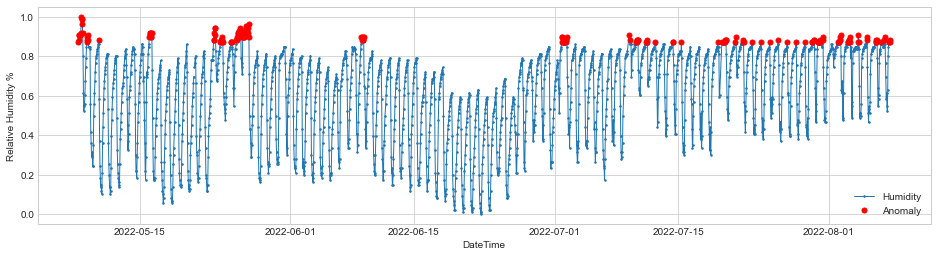

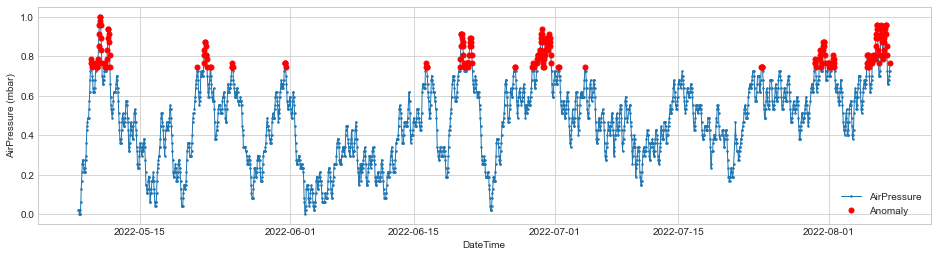

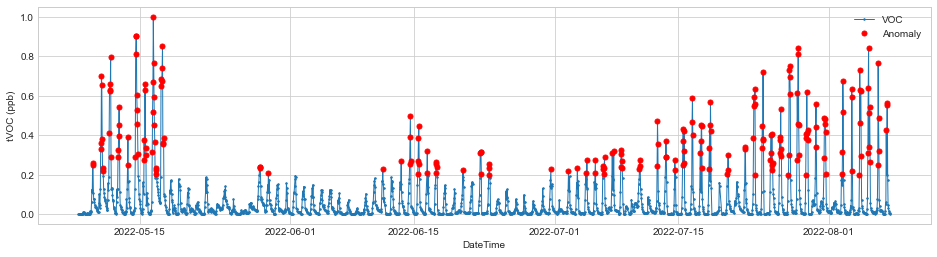

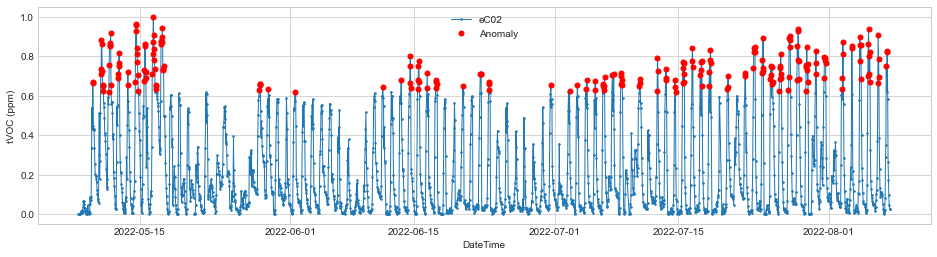

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature -0.03563355871287577
Temp_lag_1 -0.03830958932763992
Temp_lead_1 -0.032837406057472915

Temp_lag_2 -0.040096462521001
Temp_lead_2 -0.02962510846666301

Temp_lag_3 -0.04098062021935249
Temp_lead_3 -0.02643068414401142

Temp_lag_4 -0.04148943013090572
Temp_lead_4 -0.023811782542889234

Temp_lag_5 -0.041934720400999104
Temp_lead_5 -0.02176886181626133

Temp_lag_6 -0.04282820193054476
Temp_lead_6 -0.020104640899136335

Temp_lag_7 -0.044041964190677255
Temp_lead_7 -0.01892298682679269

Temp_lag_8 -0.04590592278259196
Temp_lead_8 -0.01805979884400025

Temp_lag_9 -0.04758390554846579
Temp_lead_9 -0.01736646256154537

----------------------------------------------------------
Humidity 0.19154735732686565
Hum_lag_1 0.19450607928461772
Hum_lead_1 0.1881462754572133
Hum_lag_2 0.1967479734923988
Hum_lead_2 0.18425933139592915
Hum_lag_3 0.19813296586500834
Hum_lead_3 0.18033192770488957
Hum_lag_4 0.19911176383900525
Hum_lead_4 0.17676671458663887
Hum_lag_5 0.19997877083941862
Hum_lead_5

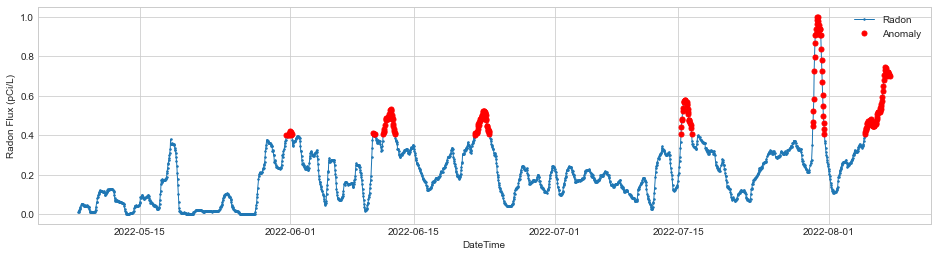

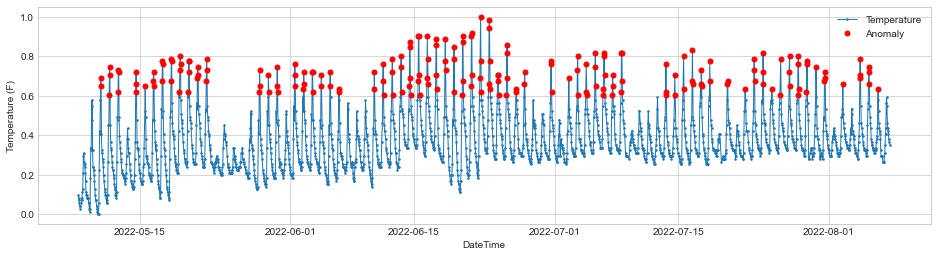

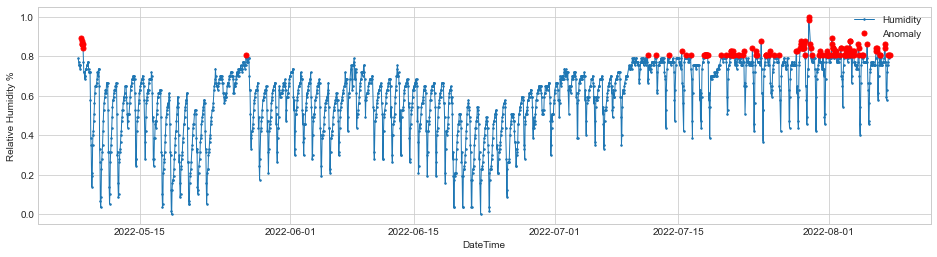

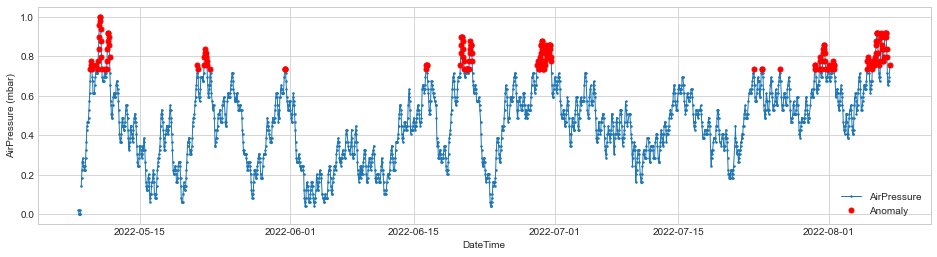

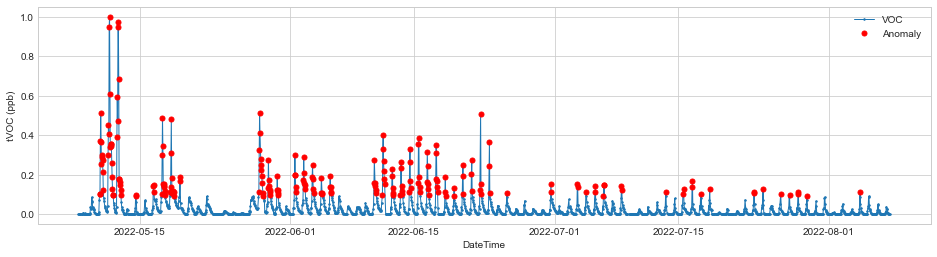

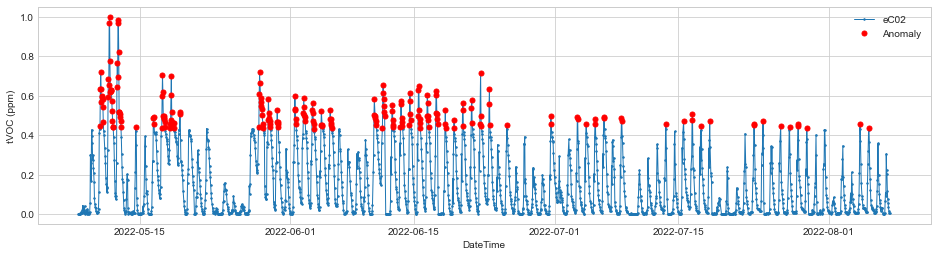

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.18448200756527622
Temp_lag_1 0.17920797590814805
Temp_lead_1 0.18713323831320613

Temp_lag_2 0.1743973218163402
Temp_lead_2 0.1897283122099221

Temp_lag_3 0.16967667761465804
Temp_lead_3 0.1912697261374187

Temp_lag_4 0.16480064408402584
Temp_lead_4 0.19088627298023134

Temp_lag_5 0.16013630476922622
Temp_lead_5 0.18969810032393727

Temp_lag_6 0.15556065593667623
Temp_lead_6 0.1881765620840938

Temp_lag_7 0.15110625931466476
Temp_lead_7 0.18659859030895237

Temp_lag_8 0.14700792527647735
Temp_lead_8 0.18686604811159246

Temp_lag_9 0.1420497839544542
Temp_lead_9 0.18587937850193464

----------------------------------------------------------
Humidity 0.11701601707334415
Hum_lag_1 0.11961568470814984
Hum_lead_1 0.11535416955293375
Hum_lag_2 0.12190511788406014
Hum_lead_2 0.11316819394876215
Hum_lag_3 0.12408557546607439
Hum_lead_3 0.1116986828965244
Hum_lag_4 0.12647061676220256
Hum_lead_4 0.11171163165413207
Hum_lag_5 0.129250428199201
Hum_lead_5 0.11247916043582074
Hum_lag

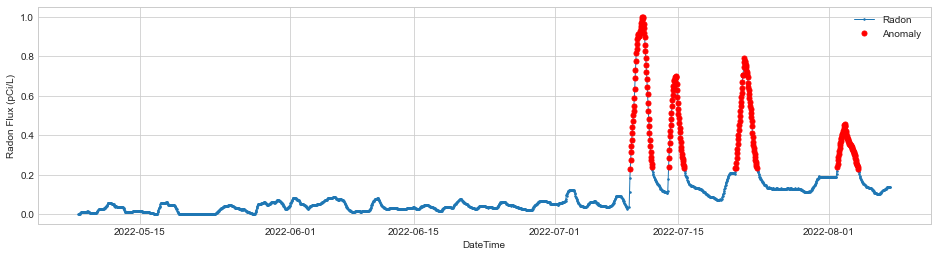

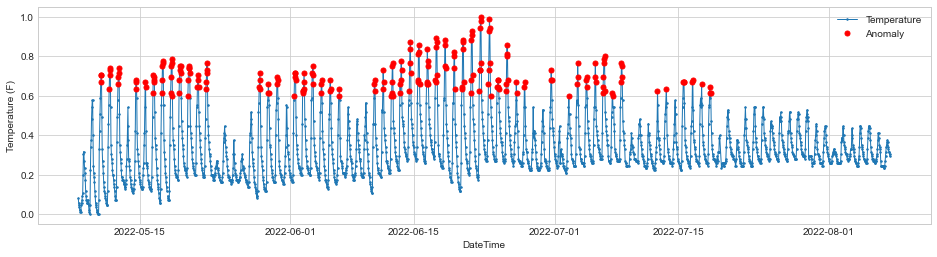

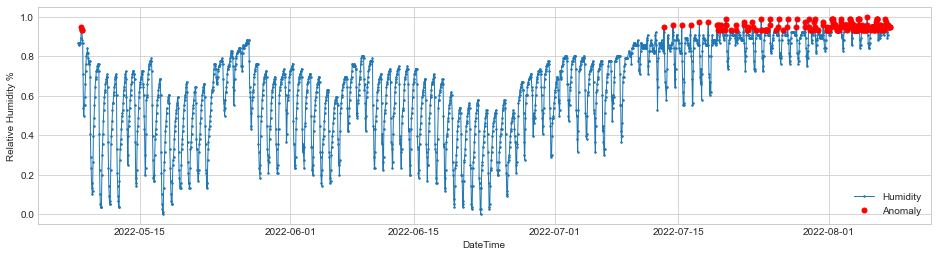

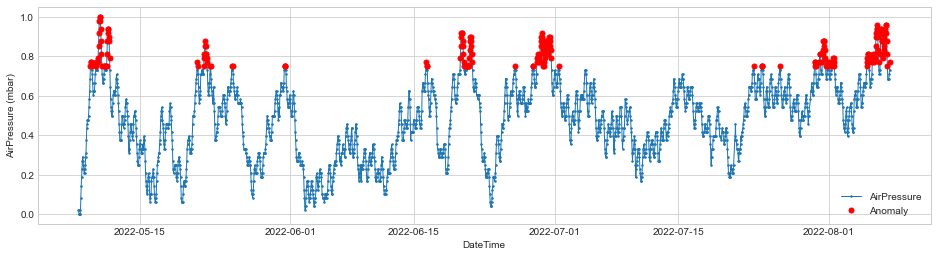

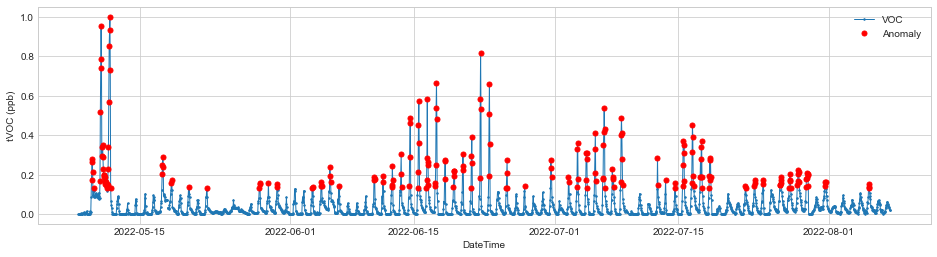

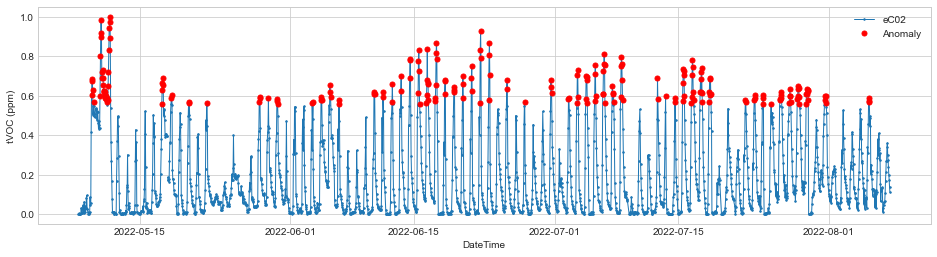

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature -0.02324481863819323
Temp_lag_1 -0.02500296019106478
Temp_lead_1 -0.022550747282411524

Temp_lag_2 -0.02647590078821763
Temp_lead_2 -0.021824469664964243

Temp_lag_3 -0.027720776852866013
Temp_lead_3 -0.021318333668895042

Temp_lag_4 -0.028766026577782208
Temp_lead_4 -0.02097975494741225

Temp_lag_5 -0.029790297817480046
Temp_lead_5 -0.020948542493615604

Temp_lag_6 -0.030804668909051796
Temp_lead_6 -0.021065187826926828

Temp_lag_7 -0.031783482692655324
Temp_lead_7 -0.021190733638855062

Temp_lag_8 -0.03280153169573242
Temp_lead_8 -0.02158148871408138

Temp_lag_9 -0.03381820022667233
Temp_lead_9 -0.022011063543552468

----------------------------------------------------------
Humidity 0.4196139465338301
Hum_lag_1 0.4203723139419221
Hum_lead_1 0.4192762953610861
Hum_lag_2 0.420991640678366
Hum_lead_2 0.41902690940372883
Hum_lag_3 0.42143783995854356
Hum_lead_3 0.4188237494167422
Hum_lag_4 0.4217711768821029
Hum_lead_4 0.41865650324058645
Hum_lag_5 0.42206486450261954
Hum_le

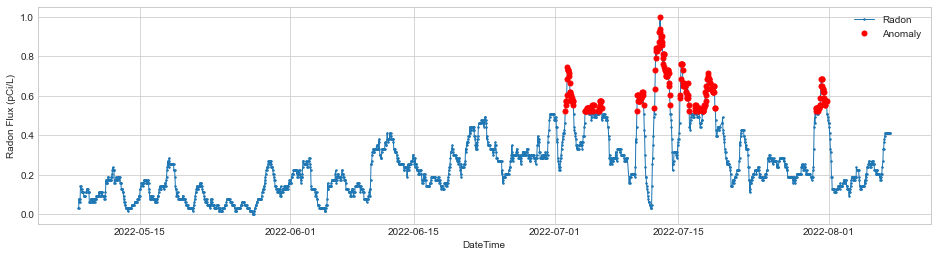

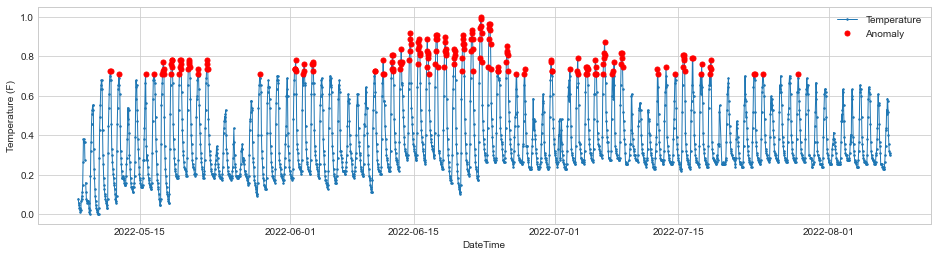

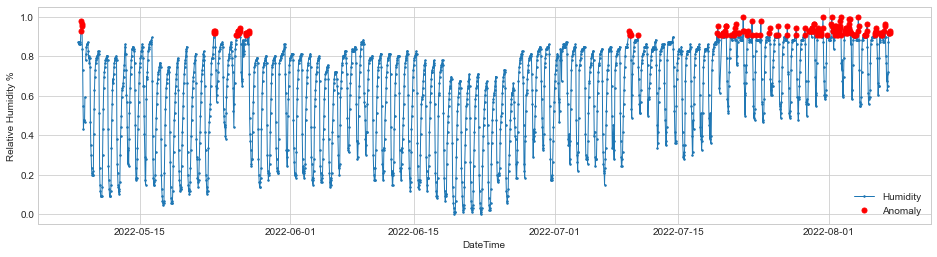

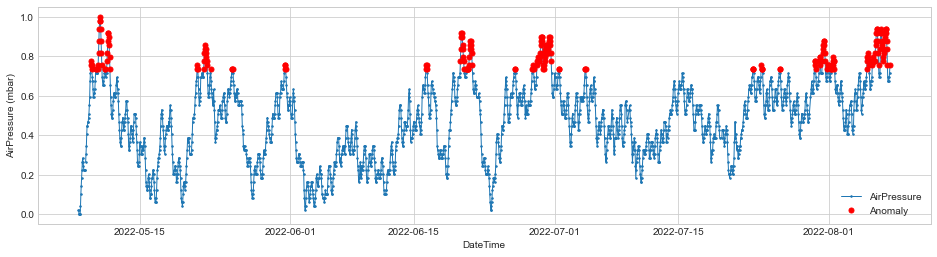

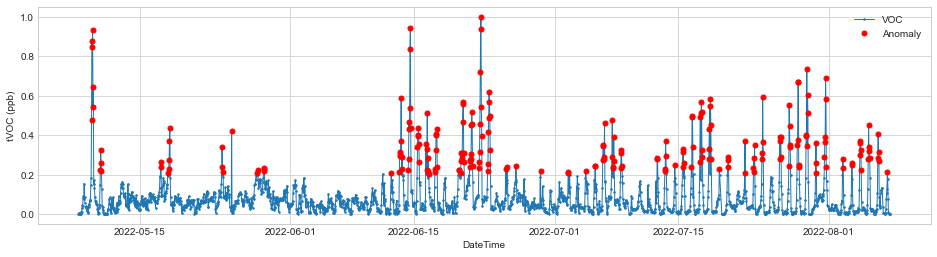

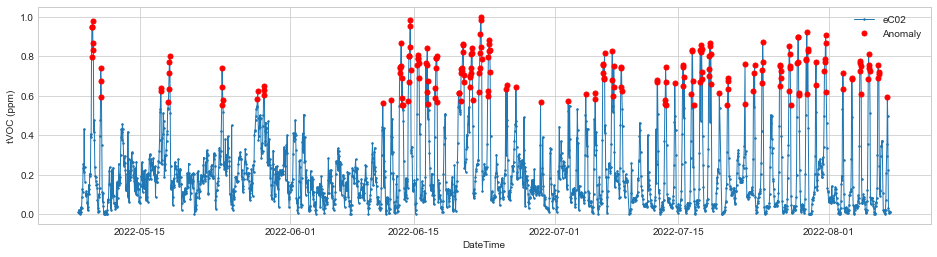

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.15193912905222315
Temp_lag_1 0.1479599329293897
Temp_lead_1 0.15514972015395428

Temp_lag_2 0.145019978471842
Temp_lead_2 0.15819287221456388

Temp_lag_3 0.14239001262053647
Temp_lead_3 0.16080724504884522

Temp_lag_4 0.1399248018089218
Temp_lead_4 0.16184132814931151

Temp_lag_5 0.1379280231718358
Temp_lead_5 0.16122427040083523

Temp_lag_6 0.13568540705841275
Temp_lead_6 0.15906727035568494

Temp_lag_7 0.13349039025804005
Temp_lead_7 0.15606727401624965

Temp_lag_8 0.13087983175699766
Temp_lead_8 0.15179400692948228

Temp_lag_9 0.12772929710772563
Temp_lead_9 0.14737523855038423

----------------------------------------------------------
Humidity 0.049955485511819636
Hum_lag_1 0.05153572135796971
Hum_lead_1 0.04829318567225636
Hum_lag_2 0.05238466812385301
Hum_lead_2 0.04656797709748482
Hum_lag_3 0.053385712344518915
Hum_lead_3 0.04535002338603118
Hum_lag_4 0.054190218457061484
Hum_lead_4 0.045905266666938734
Hum_lag_5 0.05459471740086399
Hum_lead_5 0.04823070421984836


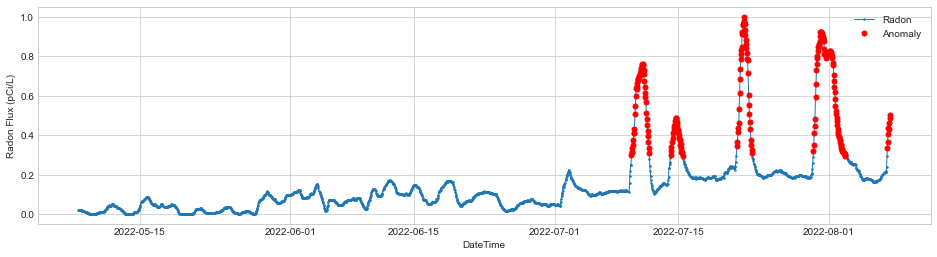

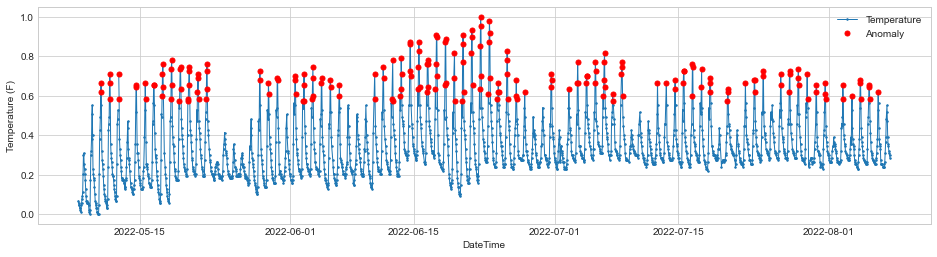

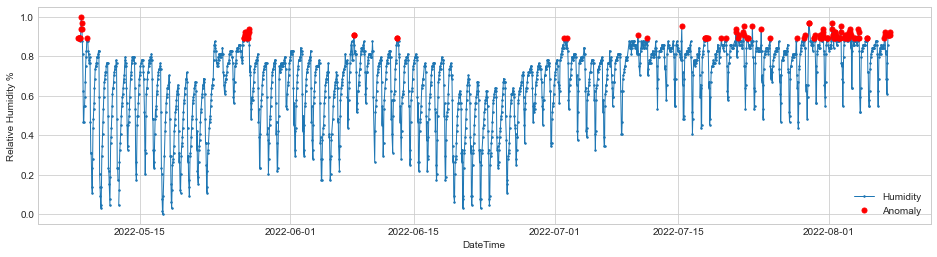

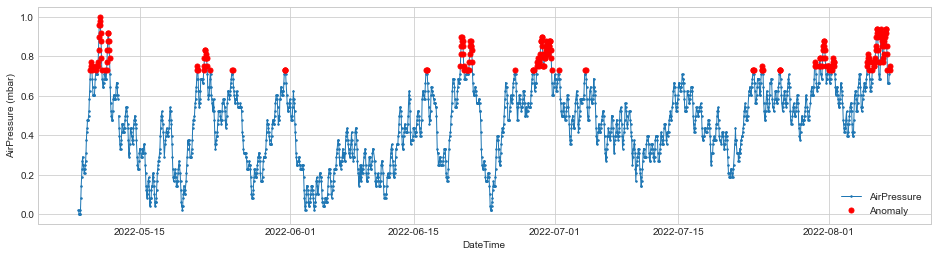

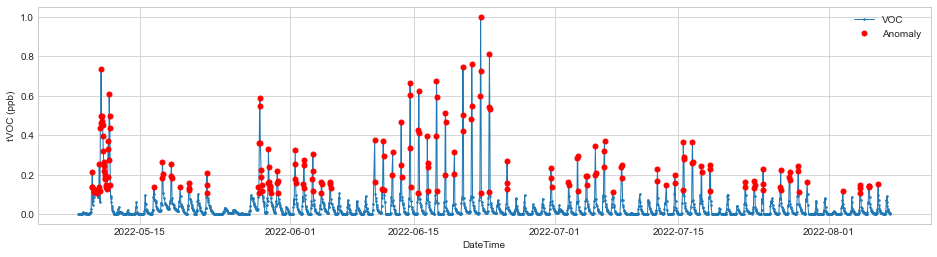

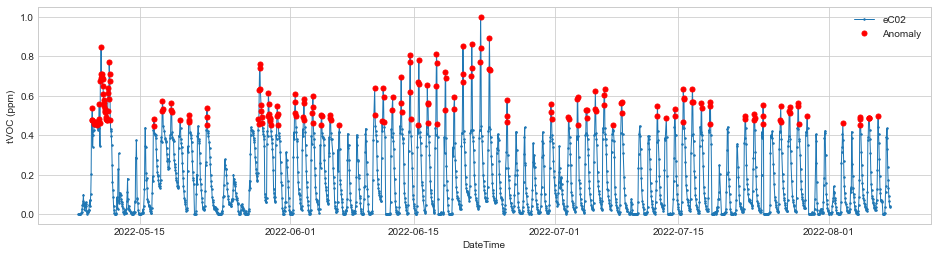

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.085682008507692
Temp_lag_1 0.08576353937741464
Temp_lead_1 0.08628228496318377

Temp_lag_2 0.08503220942144178
Temp_lead_2 0.08549750378456833

Temp_lag_3 0.08421395904262367
Temp_lead_3 0.08461467923872436

Temp_lag_4 0.0832977788667358
Temp_lead_4 0.08420308269616344

Temp_lag_5 0.08243102193471923
Temp_lead_5 0.08345639854609468

Temp_lag_6 0.08135325562950141
Temp_lead_6 0.08252113262677245

Temp_lag_7 0.07942701946855457
Temp_lead_7 0.08171097583373213

Temp_lag_8 0.07687728272018657
Temp_lead_8 0.08097042318324468

Temp_lag_9 0.07419442711525057
Temp_lead_9 0.08036464146669094

----------------------------------------------------------
Humidity 0.36722440759770886
Hum_lag_1 0.3683595153339905
Hum_lead_1 0.3657388535259237
Hum_lag_2 0.3697198036975406
Hum_lead_2 0.36424003867324706
Hum_lag_3 0.37099955171222493
Hum_lead_3 0.36258624736303685
Hum_lag_4 0.37189876534913613
Hum_lead_4 0.3609688783820541
Hum_lag_5 0.37300158778260656
Hum_lead_5 0.3597800273061849
Hum_lag

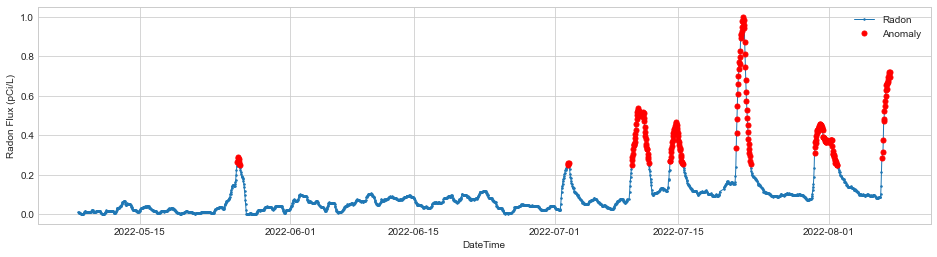

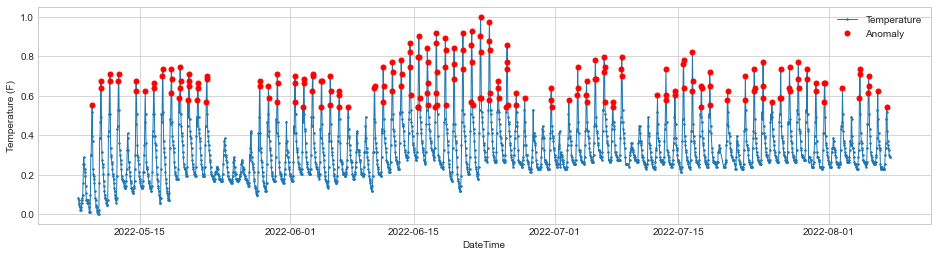

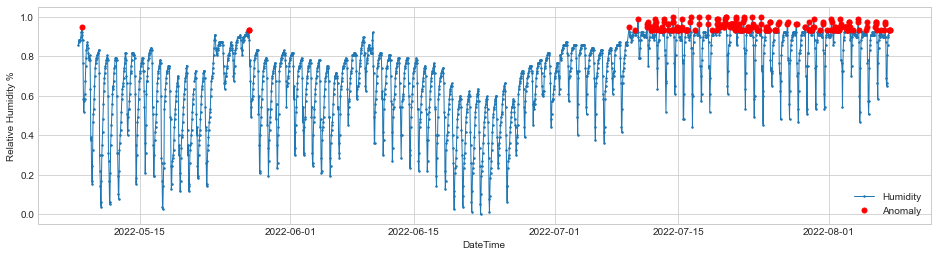

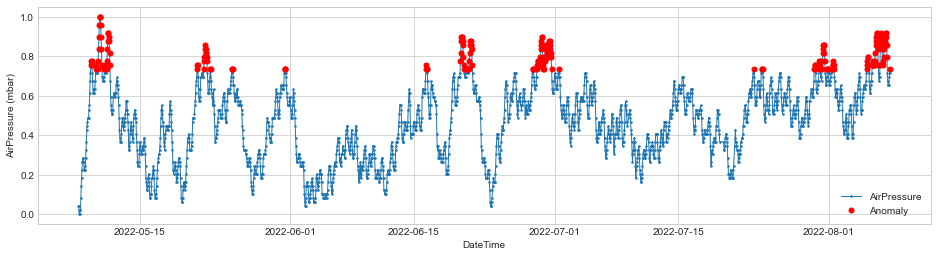

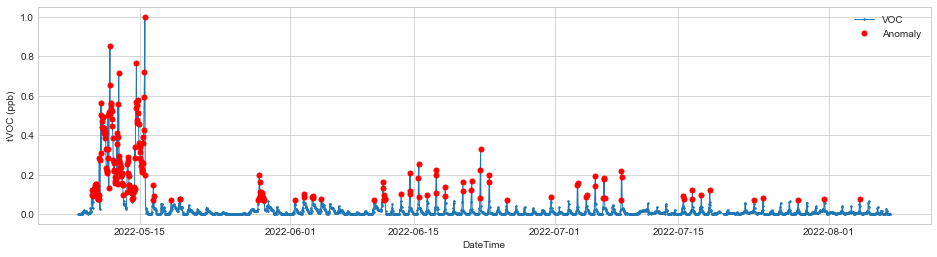

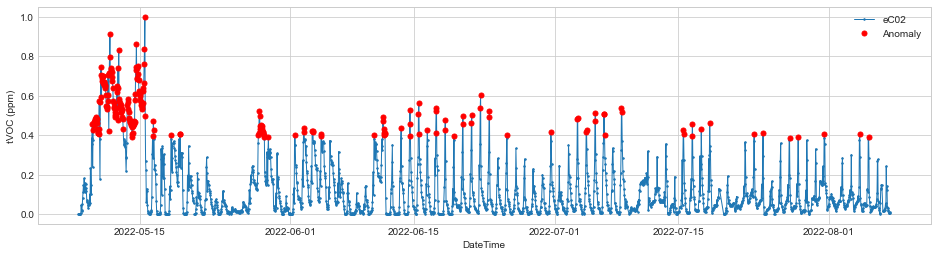

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.034309050838152555
Temp_lag_1 0.029744429058701803
Temp_lead_1 0.0379335022810239

Temp_lag_2 0.025442440641562848
Temp_lead_2 0.041141164807982605

Temp_lag_3 0.021057788147842923
Temp_lead_3 0.04305180650688837

Temp_lag_4 0.01692176011269412
Temp_lead_4 0.0440074143055836

Temp_lag_5 0.013376022018777344
Temp_lead_5 0.04405995388034132

Temp_lag_6 0.01031433304374363
Temp_lead_6 0.04397085784306186

Temp_lag_7 0.0074416615904447595
Temp_lead_7 0.043763909392442235

Temp_lag_8 0.004763956485246442
Temp_lead_8 0.04295914518871623

Temp_lag_9 0.0014727834389331367
Temp_lead_9 0.042478808095117594

----------------------------------------------------------
Humidity 0.3753109280082703
Hum_lag_1 0.3777833431236778
Hum_lead_1 0.3729976160126455
Hum_lag_2 0.3799022014934027
Hum_lead_2 0.37113326650843176
Hum_lag_3 0.3819580525352388
Hum_lead_3 0.3702634375708845
Hum_lag_4 0.3836906938046638
Hum_lead_4 0.36985721922192427
Hum_lag_5 0.385163489747515
Hum_lead_5 0.369963459910322

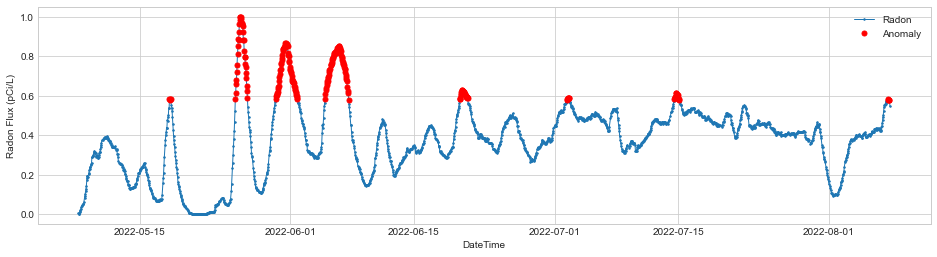

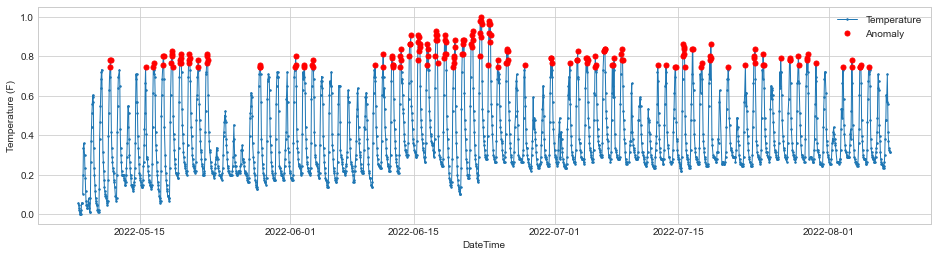

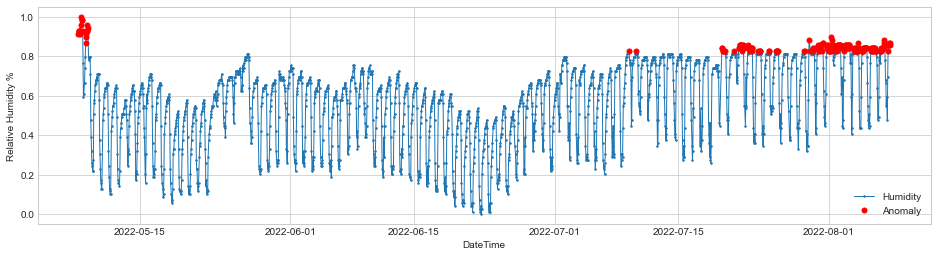

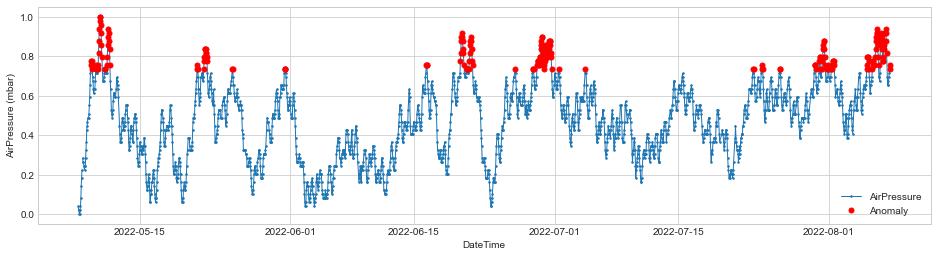

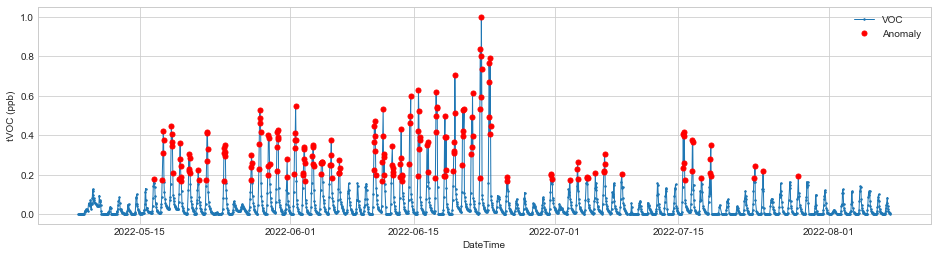

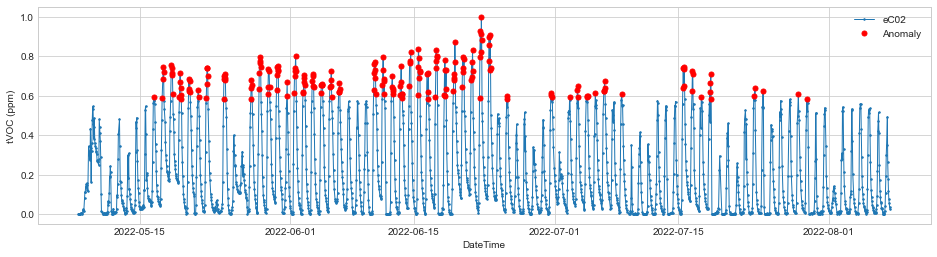

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.04023291381095211
Temp_lag_1 0.03621439713004679
Temp_lead_1 0.04062069428896125

Temp_lag_2 0.03393708747878451
Temp_lead_2 0.04269352105029698

Temp_lag_3 0.03184067840721596
Temp_lead_3 0.04453797271120943

Temp_lag_4 0.030000419809093237
Temp_lead_4 0.04553325048675854

Temp_lag_5 0.027892456601193792
Temp_lead_5 0.045749518427327954

Temp_lag_6 0.025439443344893748
Temp_lead_6 0.045951984550889384

Temp_lag_7 0.022967681760108802
Temp_lead_7 0.04642376133918196

Temp_lag_8 0.02052695611004653
Temp_lead_8 0.04688959752612485

Temp_lag_9 0.018195102194998487
Temp_lead_9 0.04749237537250247

----------------------------------------------------------
Humidity 0.09959941295889108
Hum_lag_1 0.10261437537758297
Hum_lead_1 0.10133956933608393
Hum_lag_2 0.1034104529254918
Hum_lead_2 0.10054223798888566
Hum_lag_3 0.10391132938477758
Hum_lead_3 0.10004291595833047
Hum_lag_4 0.10398465376732763
Hum_lead_4 0.10067629330158735
Hum_lag_5 0.10441104014713017
Hum_lead_5 0.10177859920

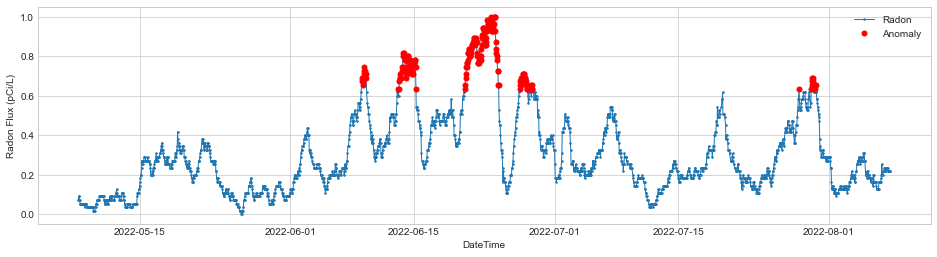

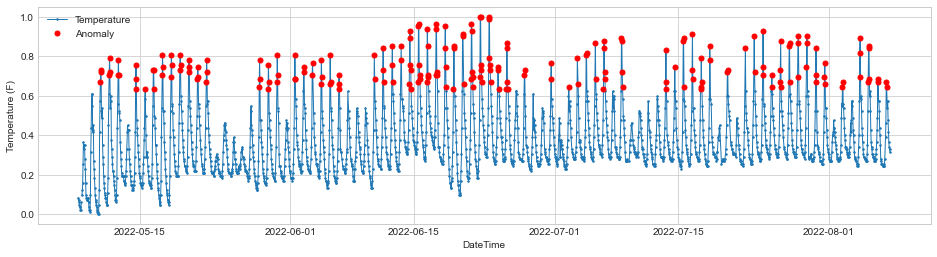

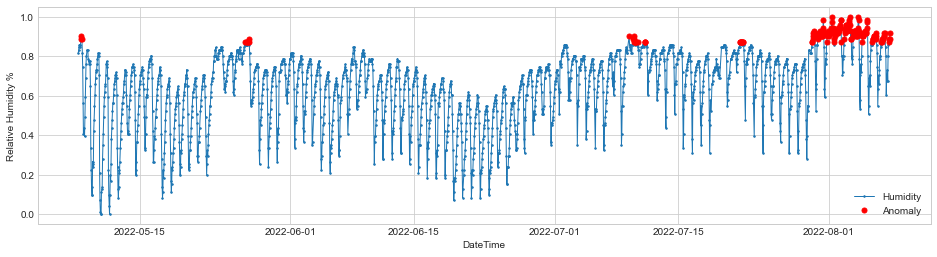

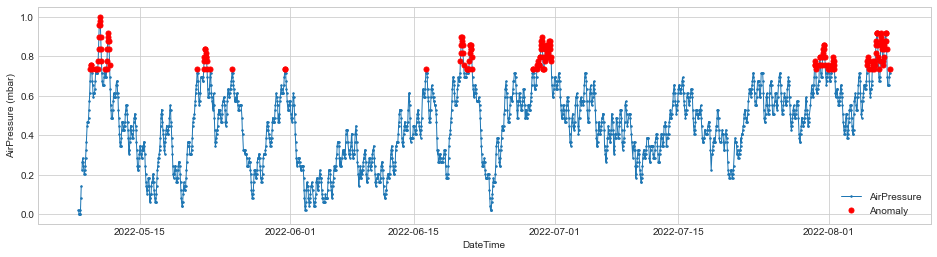

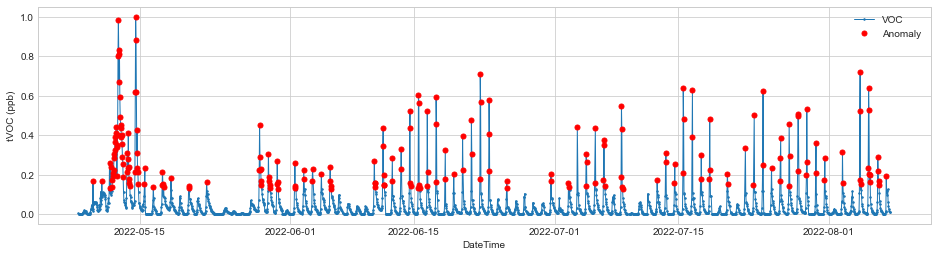

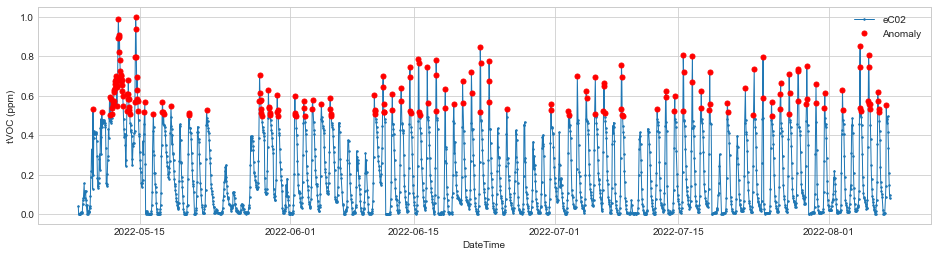

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.1991648824970486
Temp_lag_1 0.197008510818776
Temp_lead_1 0.1988387461968236

Temp_lag_2 0.1959389831944349
Temp_lead_2 0.19879515443628087

Temp_lag_3 0.19557987269815072
Temp_lead_3 0.198698427991915

Temp_lag_4 0.19502171780696478
Temp_lead_4 0.19838245732209095

Temp_lag_5 0.19501704015644816
Temp_lead_5 0.1982124554694581

Temp_lag_6 0.19558886281622537
Temp_lead_6 0.19711880673153281

Temp_lag_7 0.19724423878475256
Temp_lead_7 0.19648622570296917

Temp_lag_8 0.19865681525225443
Temp_lead_8 0.1948812029410334

Temp_lag_9 0.1999464887618508
Temp_lead_9 0.19357584600346528

----------------------------------------------------------
Humidity -0.23515462466007017
Hum_lag_1 -0.23625713900471554
Hum_lead_1 -0.23249873938729532
Hum_lag_2 -0.2380938961167529
Hum_lead_2 -0.23041376785161483
Hum_lag_3 -0.24080025526072096
Hum_lead_3 -0.22841630085994893
Hum_lag_4 -0.2434280821822533
Hum_lead_4 -0.22670067513621145
Hum_lag_5 -0.24652923351827155
Hum_lead_5 -0.22518419369039588


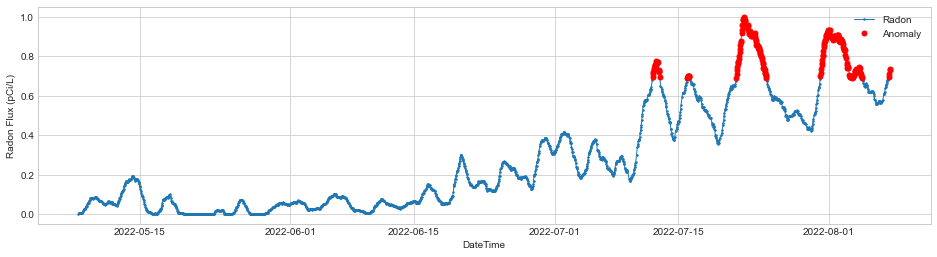

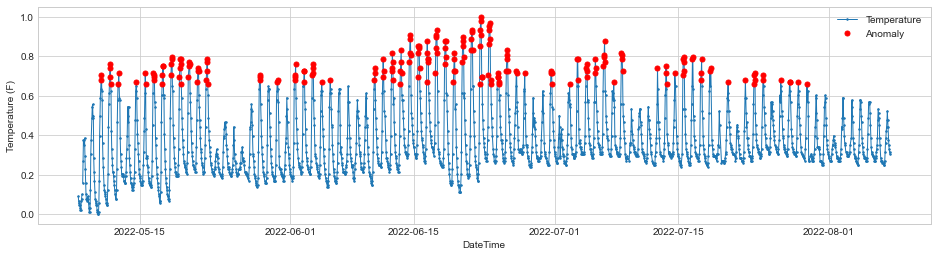

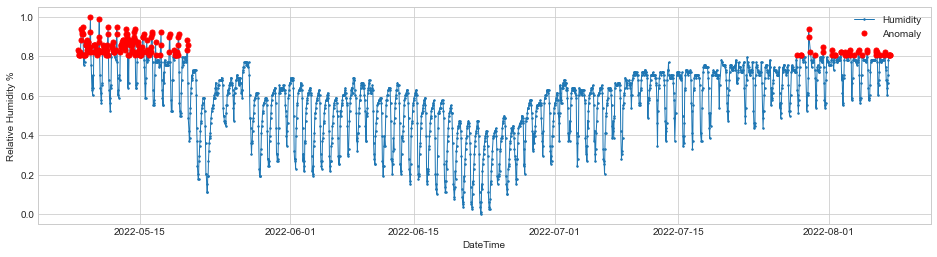

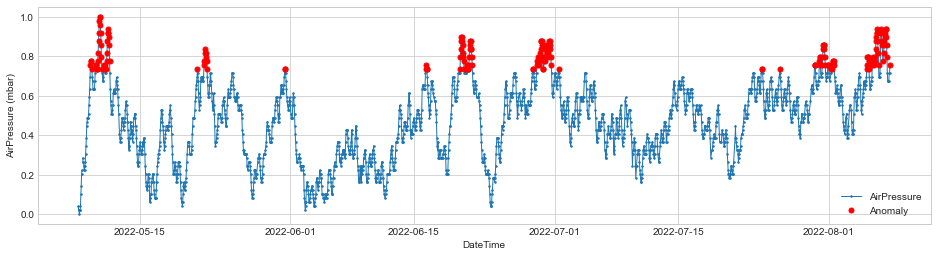

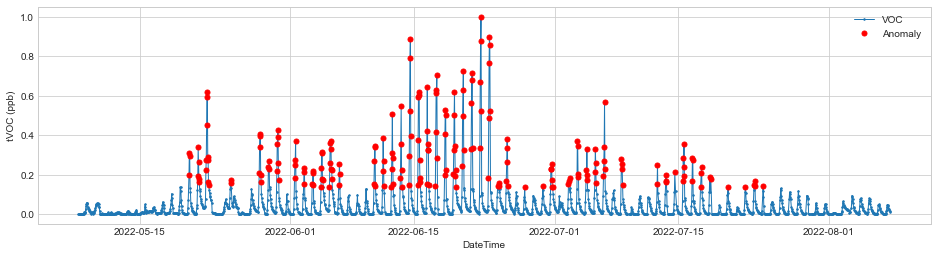

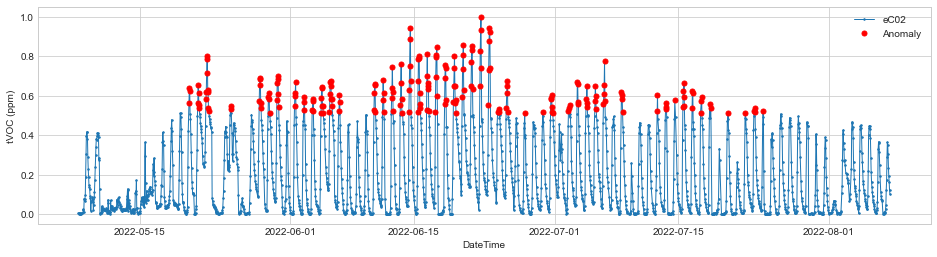

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.05514170047069738
Temp_lag_1 0.05324874375163928
Temp_lead_1 0.055377662190171206

Temp_lag_2 0.0518142464302181
Temp_lead_2 0.05606958574858664

Temp_lag_3 0.050544082306550275
Temp_lead_3 0.056418182311369476

Temp_lag_4 0.0492100068240204
Temp_lead_4 0.056089489410975364

Temp_lag_5 0.04802065077046775
Temp_lead_5 0.05549230823231052

Temp_lag_6 0.046544869971204404
Temp_lead_6 0.05493773525591781

Temp_lag_7 0.04505540234199267
Temp_lead_7 0.05403250718981208

Temp_lag_8 0.0433317083158885
Temp_lead_8 0.05303928957474982

Temp_lag_9 0.04196453168701817
Temp_lead_9 0.0521689573904331

----------------------------------------------------------
Humidity 0.30133961512219026
Hum_lag_1 0.30240846252056064
Hum_lead_1 0.3028505797677721
Hum_lag_2 0.30234704425889153
Hum_lead_2 0.3032083144924825
Hum_lag_3 0.30239666841558893
Hum_lead_3 0.3034831897899822
Hum_lag_4 0.30209574999598554
Hum_lead_4 0.3042884894091301
Hum_lag_5 0.3017356165854401
Hum_lead_5 0.3055446105187339
Hum_

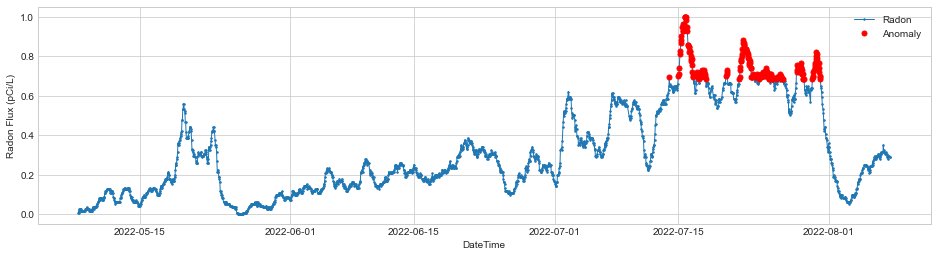

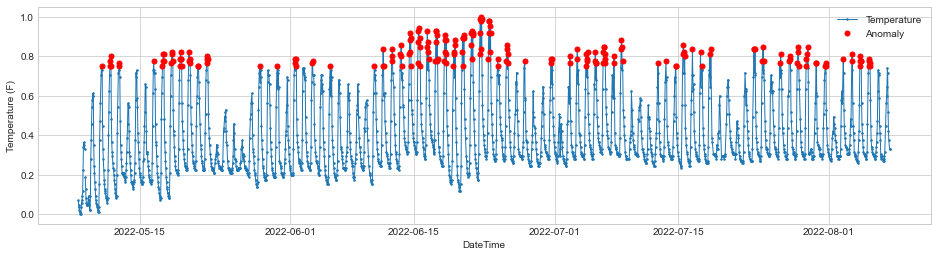

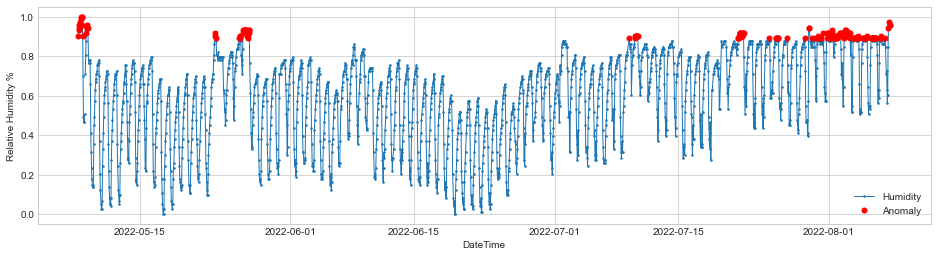

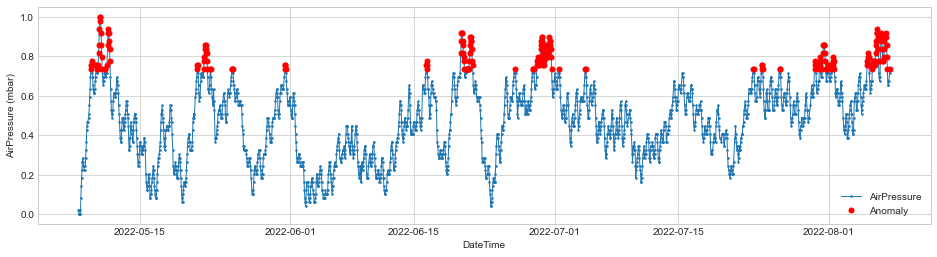

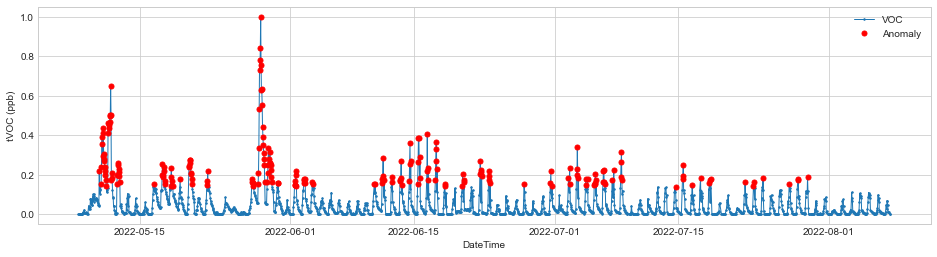

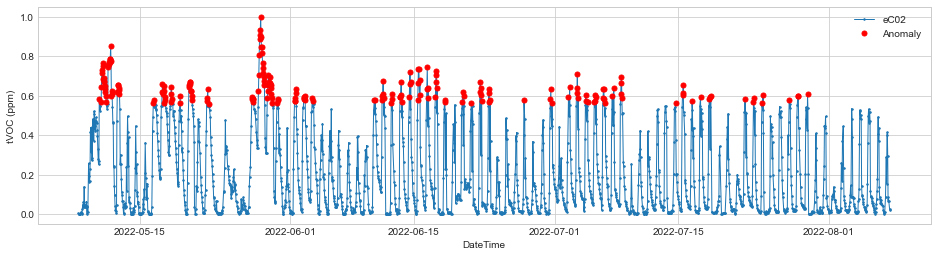

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.14491885425045373
Temp_lag_1 0.1442872335411461
Temp_lead_1 0.14398277778455573

Temp_lag_2 0.144365739211053
Temp_lead_2 0.14309402638476865

Temp_lag_3 0.14414143074210134
Temp_lead_3 0.1423424800842704

Temp_lag_4 0.14385313636853153
Temp_lead_4 0.1413124338726653

Temp_lag_5 0.14350375131698806
Temp_lead_5 0.1402995733554882

Temp_lag_6 0.1430776335760041
Temp_lead_6 0.1389703707183126

Temp_lag_7 0.14290244299662738
Temp_lead_7 0.13754225893237446

Temp_lag_8 0.14249276401516664
Temp_lead_8 0.1361236865970775

Temp_lag_9 0.14244062968951657
Temp_lead_9 0.134950757524253

----------------------------------------------------------
Humidity 0.22834905531008665
Hum_lag_1 0.22739265849822704
Hum_lead_1 0.230634682079226
Hum_lag_2 0.22624769829280586
Hum_lead_2 0.23305517677269463
Hum_lag_3 0.22524673388441382
Hum_lead_3 0.23534173801118954
Hum_lag_4 0.22413507579263003
Hum_lead_4 0.23765948735016926
Hum_lag_5 0.2231494517134843
Hum_lead_5 0.23981762586710745
Hum_lag_6 0.2

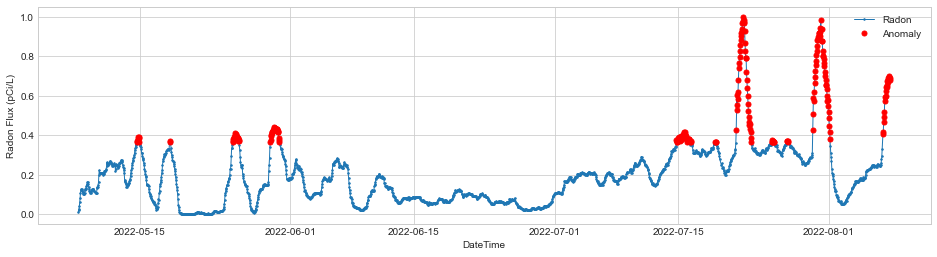

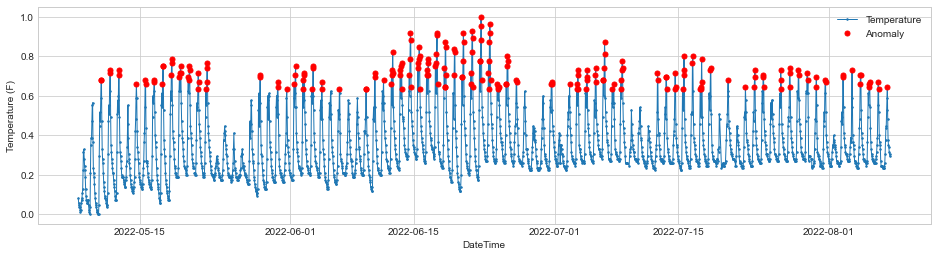

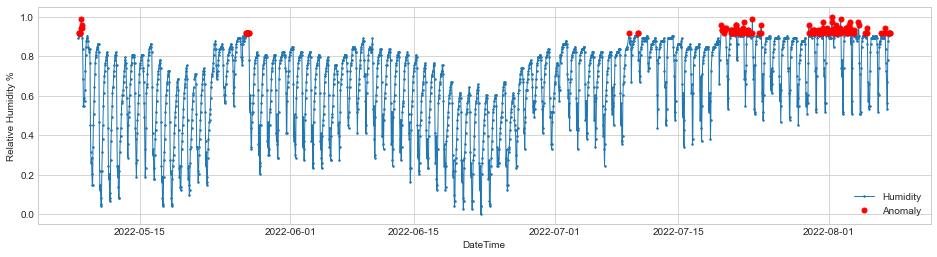

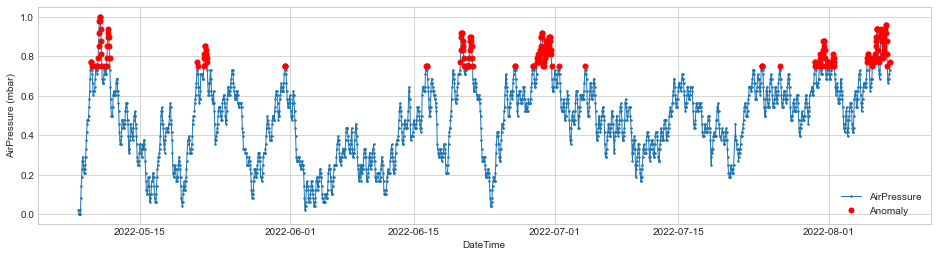

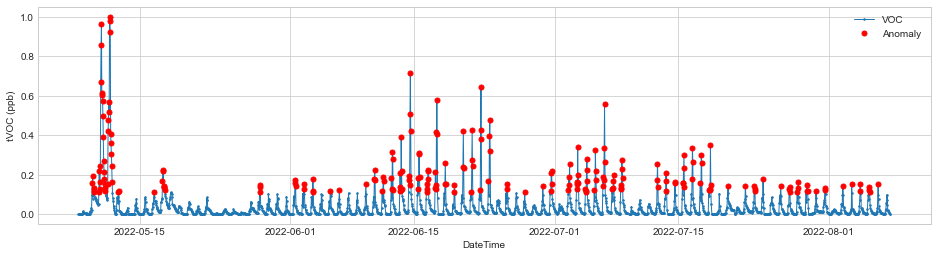

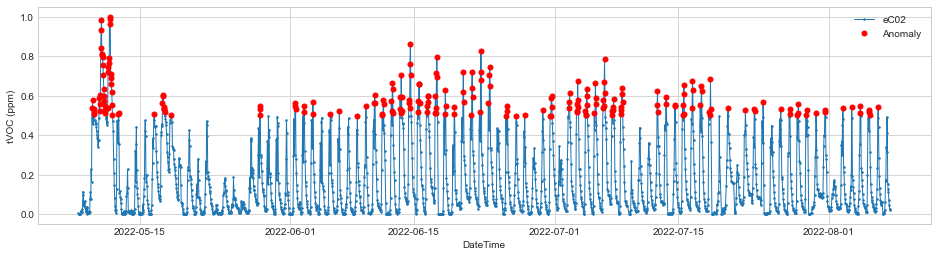

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature -0.02675422985635935
Temp_lag_1 -0.028749113419467707
Temp_lead_1 -0.02631242768350384

Temp_lag_2 -0.030026976175119124
Temp_lead_2 -0.025846238204803428

Temp_lag_3 -0.03110932688381107
Temp_lead_3 -0.025623740181075997

Temp_lag_4 -0.03231113866631358
Temp_lead_4 -0.025432822162199213

Temp_lag_5 -0.03356624903390502
Temp_lead_5 -0.025384342405527272

Temp_lag_6 -0.035272761146776625
Temp_lead_6 -0.025831322004818236

Temp_lag_7 -0.03786445386019747
Temp_lead_7 -0.026188147497824603

Temp_lag_8 -0.042176028124620055
Temp_lead_8 -0.027280642358323906

Temp_lag_9 -0.04570894955753906
Temp_lead_9 -0.02830896602853791

----------------------------------------------------------
Humidity 0.3095318520816904
Hum_lag_1 0.3096666363913779
Hum_lead_1 0.30973023860654564
Hum_lag_2 0.30939305393639976
Hum_lead_2 0.31046965122391385
Hum_lag_3 0.30889519476629573
Hum_lead_3 0.3114295410112362
Hum_lag_4 0.3085687049960709
Hum_lead_4 0.31251141634611385
Hum_lag_5 0.30863420587677426
Hum_

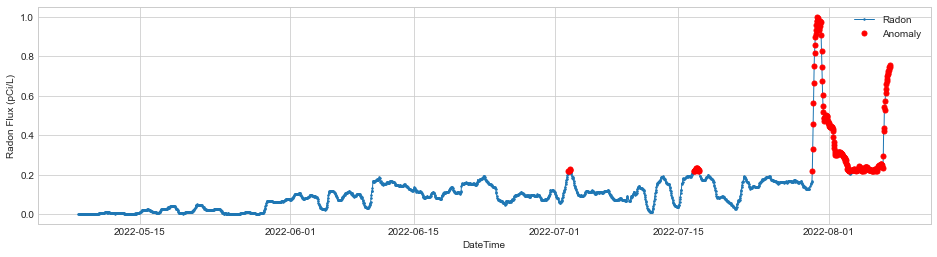

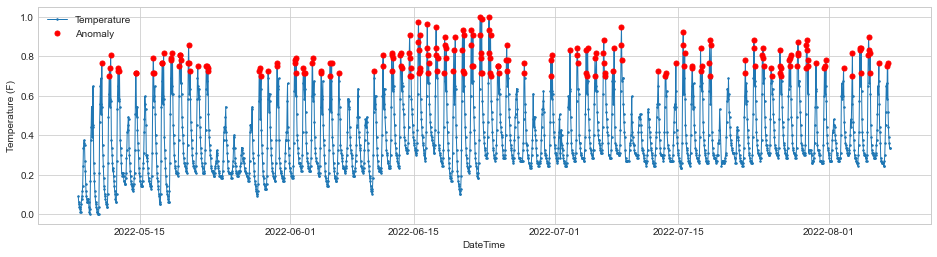

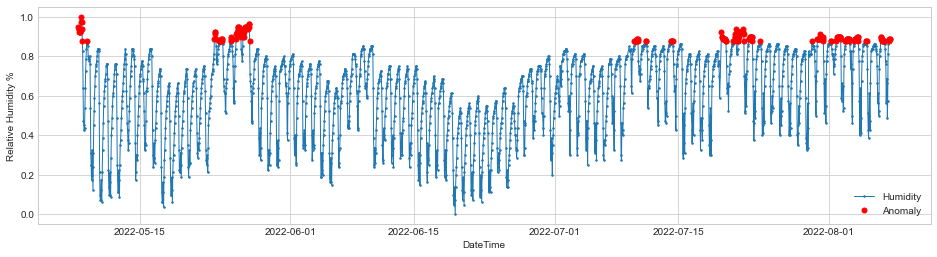

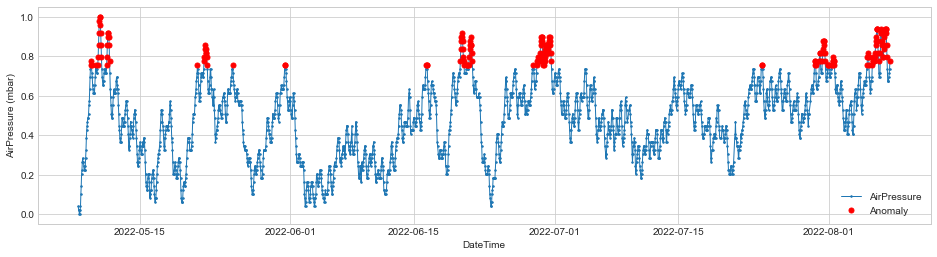

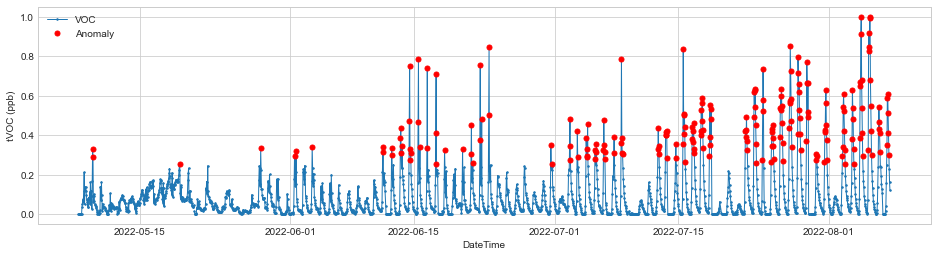

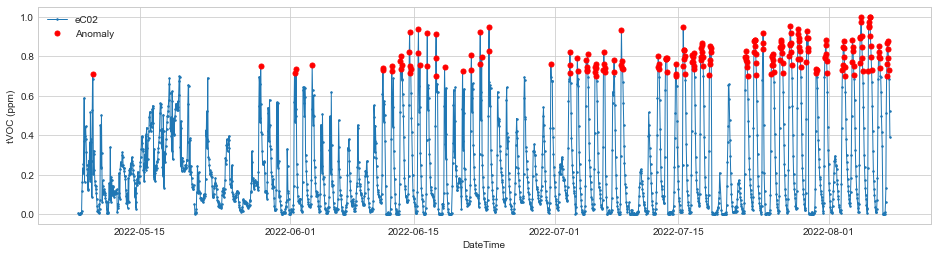

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.1426210118017583
Temp_lag_1 0.14033193188669824
Temp_lead_1 0.14478846071496473

Temp_lag_2 0.13798543277288708
Temp_lead_2 0.1463034942060973

Temp_lag_3 0.13536962318232457
Temp_lead_3 0.14680790653159384

Temp_lag_4 0.13230423726336105
Temp_lead_4 0.14622377304999112

Temp_lag_5 0.12860325222473143
Temp_lead_5 0.1450053343600095

Temp_lag_6 0.12377162056563275
Temp_lead_6 0.1428286312354738

Temp_lag_7 0.11654629633140677
Temp_lead_7 0.14039187845943074

Temp_lag_8 0.11022040300097725
Temp_lead_8 0.13777382806214383

Temp_lag_9 0.1070015006868916
Temp_lead_9 0.13468493436201656

----------------------------------------------------------
Humidity 0.17080798825365898
Hum_lag_1 0.17146514349056696
Hum_lead_1 0.16971416253108743
Hum_lag_2 0.17213317788739288
Hum_lead_2 0.16902697631827018
Hum_lag_3 0.17267627665104973
Hum_lead_3 0.16897836984983447
Hum_lag_4 0.17343325008956623
Hum_lead_4 0.16963560415940496
Hum_lag_5 0.17429074108670614
Hum_lead_5 0.17050735952514884
Hum_

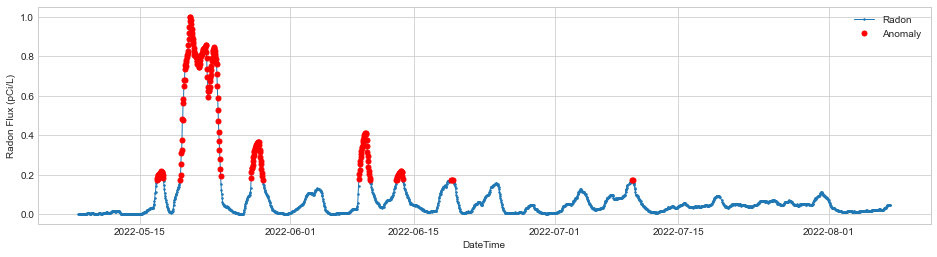

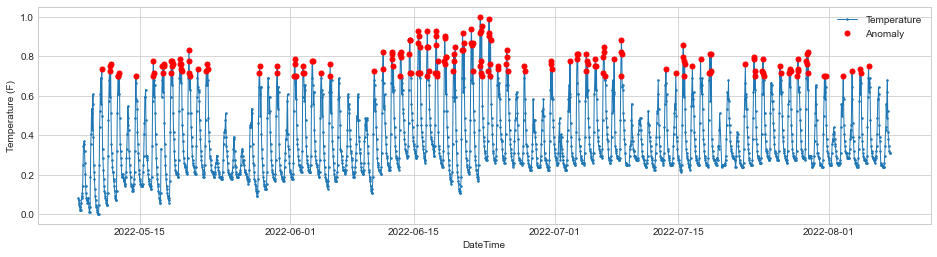

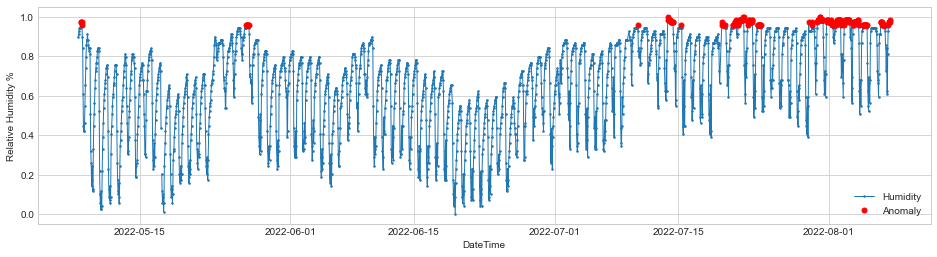

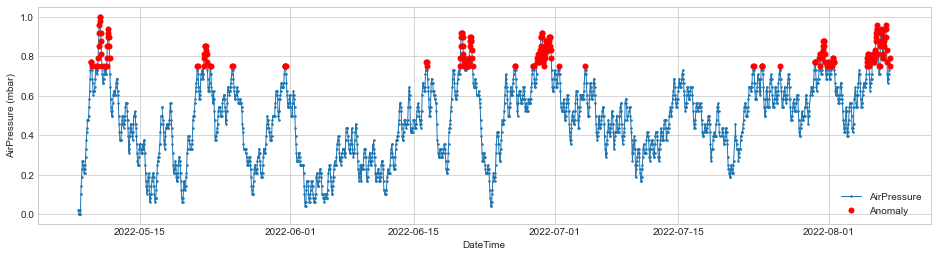

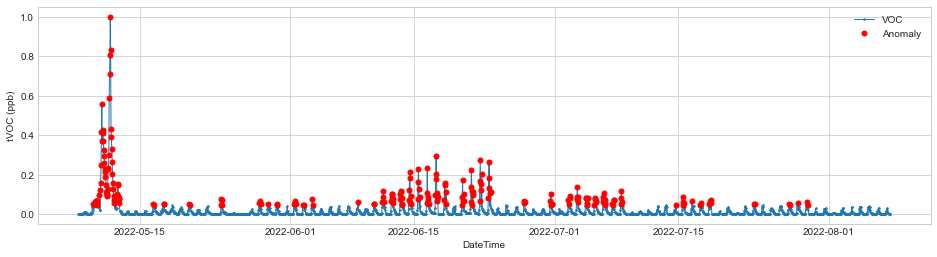

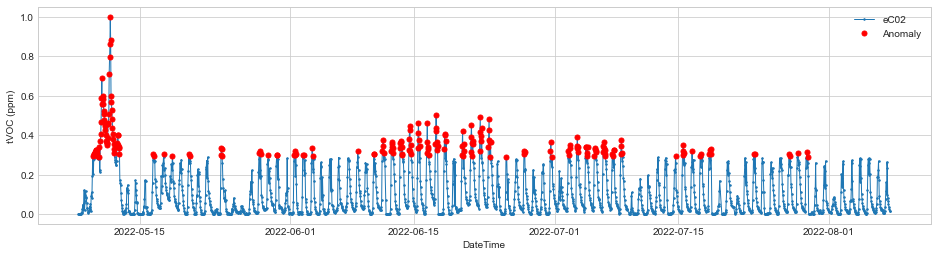

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.008113157509768126
Temp_lag_1 0.010152838218170356
Temp_lead_1 0.0057307825586259955

Temp_lag_2 0.013203061657626178
Temp_lead_2 0.0036249444987631564

Temp_lag_3 0.016147795748092594
Temp_lead_3 0.0014223784307681158

Temp_lag_4 0.019258475836009467
Temp_lead_4 -0.0004290719134425252

Temp_lag_5 0.02257953828872224
Temp_lead_5 -0.0019727152289401376

Temp_lag_6 0.026118483511967747
Temp_lead_6 -0.003978710808483563

Temp_lag_7 0.029963467557564245
Temp_lead_7 -0.005885139377154906

Temp_lag_8 0.03412510203937626
Temp_lead_8 -0.00697084835946053

Temp_lag_9 0.03830336324636884
Temp_lead_9 -0.008237915480855545

----------------------------------------------------------
Humidity -0.10816724041676393
Hum_lag_1 -0.10975778922437272
Hum_lead_1 -0.1056401587018816
Hum_lag_2 -0.1126152361636174
Hum_lead_2 -0.10364569127788033
Hum_lag_3 -0.11545341546753286
Hum_lead_3 -0.10170693772694214
Hum_lag_4 -0.11849690034284208
Hum_lead_4 -0.10005238433511641
Hum_lag_5 -0.12180058718851

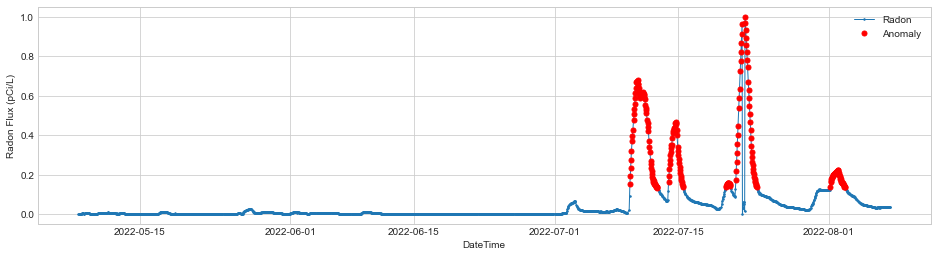

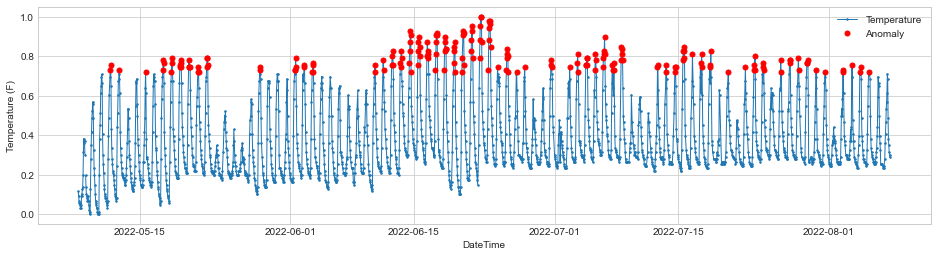

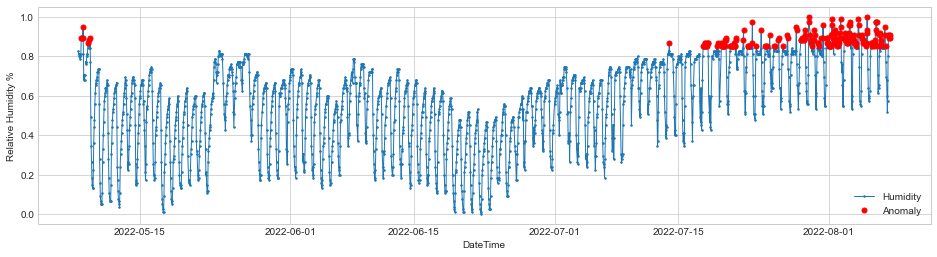

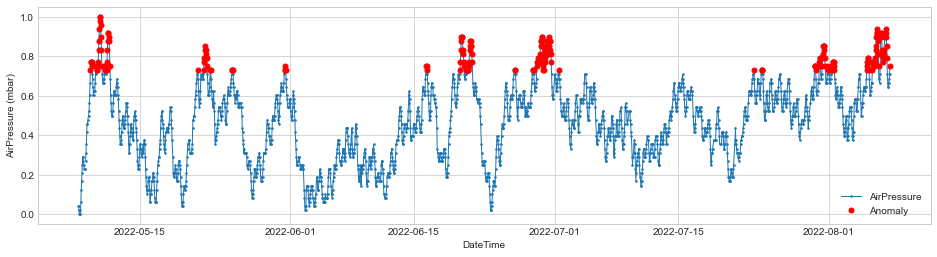

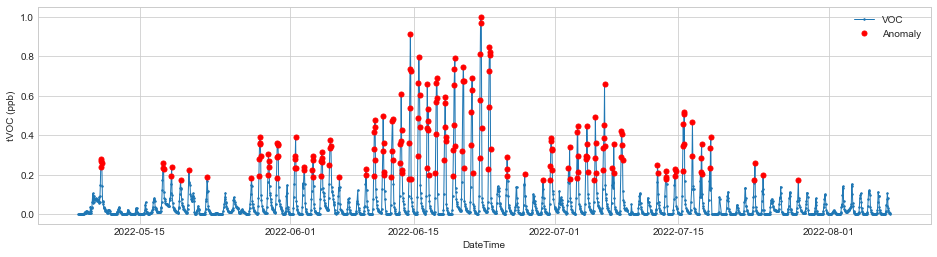

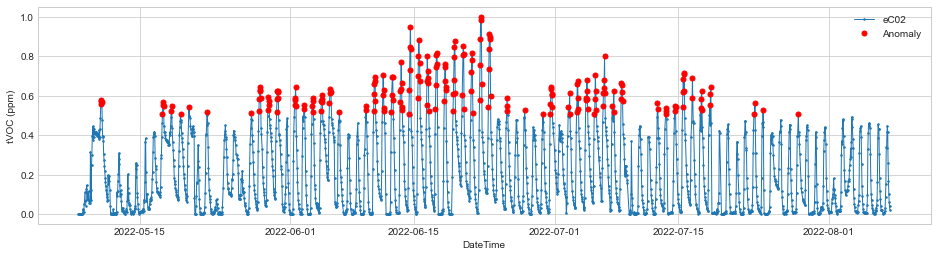

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.0018864496547585205
Temp_lag_1 0.005493231589047797
Temp_lead_1 -0.004669777920663238

Temp_lag_2 0.008755550902893755
Temp_lead_2 -0.012781212011856141

Temp_lag_3 0.009264082681167407
Temp_lead_3 -0.01851342626257666

Temp_lag_4 0.007383251304275802
Temp_lead_4 -0.022066163597700972

Temp_lag_5 0.004995182634054875
Temp_lead_5 -0.02387550688210406

Temp_lag_6 0.0021899872918032465
Temp_lead_6 -0.021366255293236883

Temp_lag_7 -0.0008262101753032532
Temp_lead_7 -0.017543920999748545

Temp_lag_8 -0.00408783142177863
Temp_lead_8 -0.011591511418738548

Temp_lag_9 -0.007976910667472864
Temp_lead_9 -0.0029335422738486563

----------------------------------------------------------
Humidity 0.3046747547992849
Hum_lag_1 0.30356688897494055
Hum_lead_1 0.30863372881074774
Hum_lag_2 0.30227326106924285
Hum_lead_2 0.3132117503306421
Hum_lag_3 0.30376292395499144
Hum_lead_3 0.3168796649907954
Hum_lag_4 0.3072306895402217
Hum_lead_4 0.3194133829919502
Hum_lag_5 0.31001588420898685
Hum

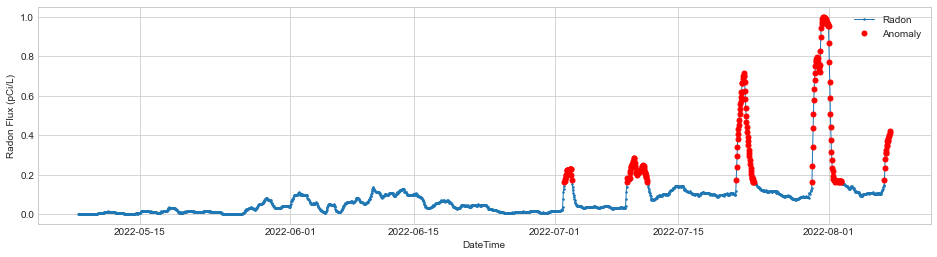

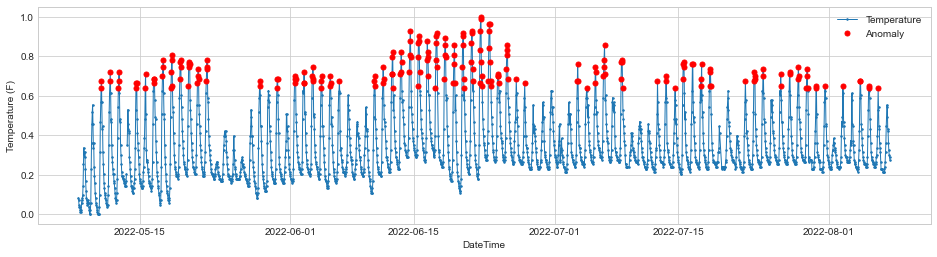

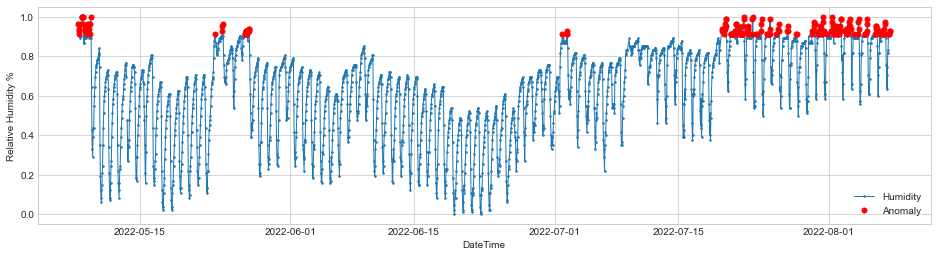

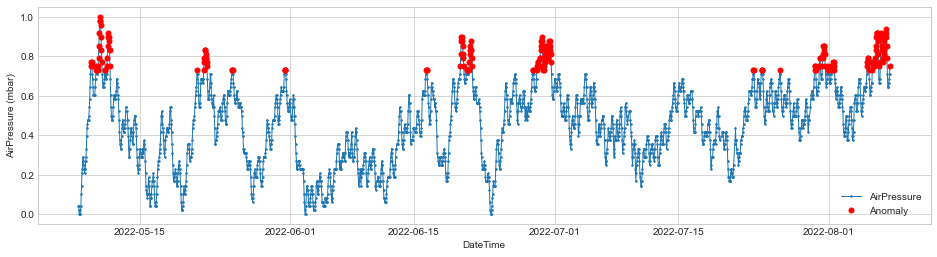

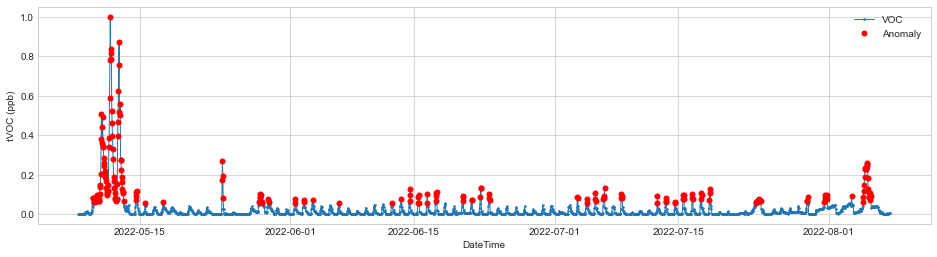

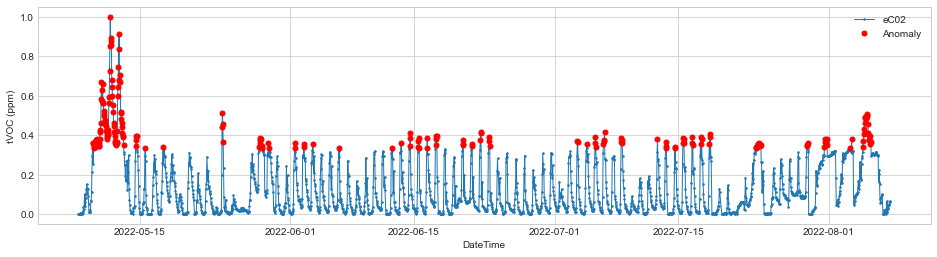

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.012258667218610398
Temp_lag_1 0.009461687191668382
Temp_lead_1 0.014620079848137582

Temp_lag_2 0.006854583602147474
Temp_lead_2 0.016613813152529078

Temp_lag_3 0.004332493564202732
Temp_lead_3 0.017770484283369865

Temp_lag_4 0.0019343471283220202
Temp_lead_4 0.01791185278436982

Temp_lag_5 -0.0005021586702819118
Temp_lead_5 0.01723976503896394

Temp_lag_6 -0.003286486583845138
Temp_lead_6 0.016202440895692182

Temp_lag_7 -0.006138803994854864
Temp_lead_7 0.014435107858878535

Temp_lag_8 -0.009219207623691142
Temp_lead_8 0.012531957246497223

Temp_lag_9 -0.011759394128870306
Temp_lead_9 0.010405517699497822

----------------------------------------------------------
Humidity 0.3245787628552028
Hum_lag_1 0.32716251517036143
Hum_lead_1 0.32170463799364524
Hum_lag_2 0.32950524364778855
Hum_lead_2 0.3192594860878156
Hum_lag_3 0.3315451817841964
Hum_lead_3 0.3173785315789552
Hum_lag_4 0.33323737421368665
Hum_lead_4 0.31610290695398957
Hum_lag_5 0.334710717770251
Hum_lead_5 0

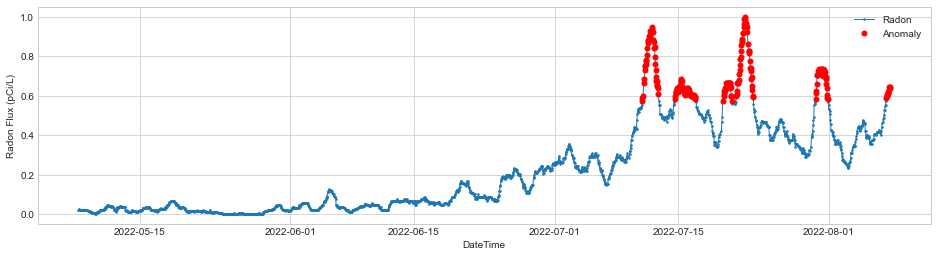

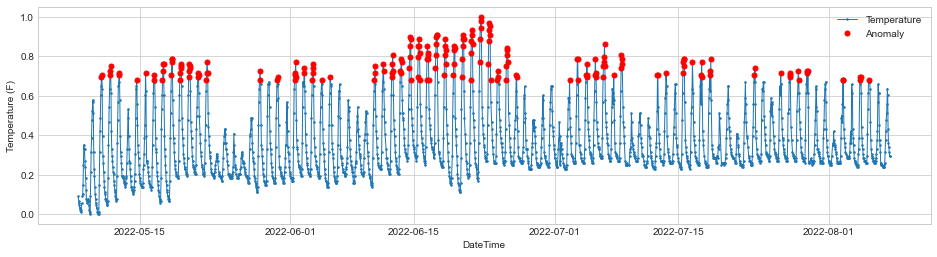

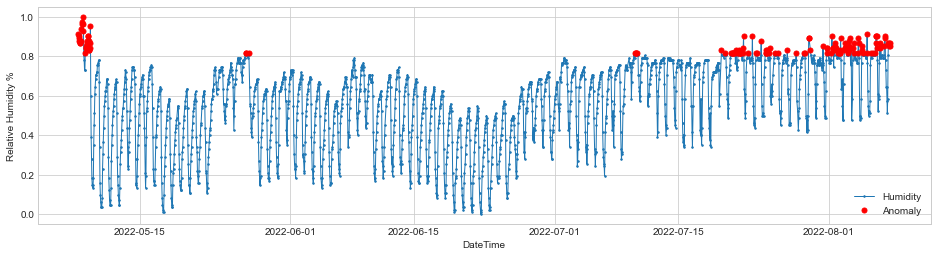

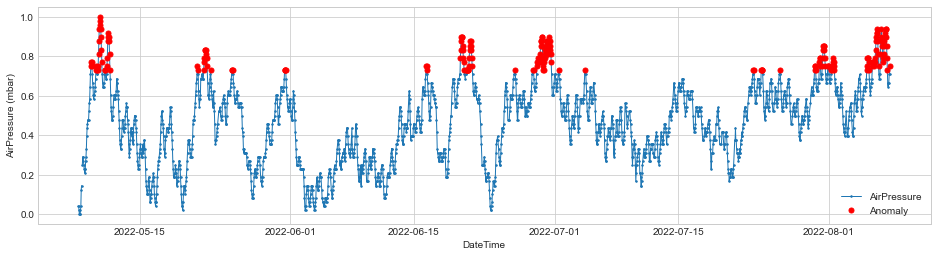

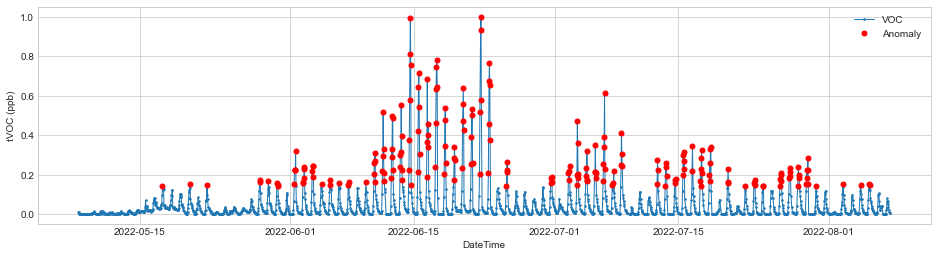

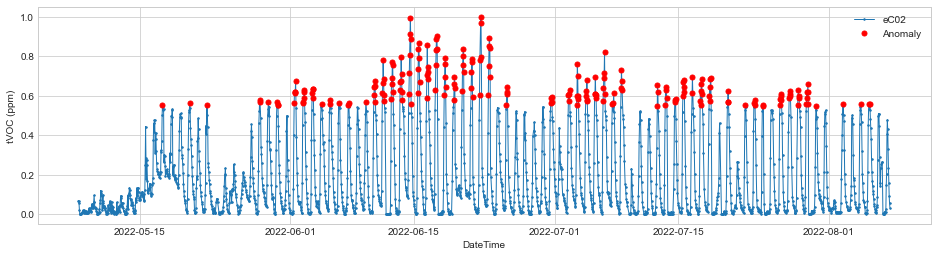

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.061223827922101466
Temp_lag_1 0.05947209156549653
Temp_lead_1 0.0616666376381701

Temp_lag_2 0.057978715536169415
Temp_lead_2 0.062476720018038556

Temp_lag_3 0.05638487236652447
Temp_lead_3 0.0630370393870985

Temp_lag_4 0.05484283378787013
Temp_lead_4 0.06357440210428551

Temp_lag_5 0.05336053523479326
Temp_lead_5 0.06393277727695025

Temp_lag_6 0.05183867400565263
Temp_lead_6 0.06389419142428449

Temp_lag_7 0.04980370846008264
Temp_lead_7 0.06402746411766432

Temp_lag_8 0.04768785493124149
Temp_lead_8 0.06384495302349182

Temp_lag_9 0.046026688777280396
Temp_lead_9 0.06336805819122467

----------------------------------------------------------
Humidity 0.4389553861859207
Hum_lag_1 0.4405940412927928
Hum_lead_1 0.4400447682039778
Hum_lag_2 0.4412023162369565
Hum_lead_2 0.44024294099155
Hum_lag_3 0.44179642859462664
Hum_lead_3 0.44064101626877245
Hum_lag_4 0.4424351267674796
Hum_lead_4 0.4407622485444806
Hum_lag_5 0.44311486363451813
Hum_lead_5 0.44085065698938214
Hum_la

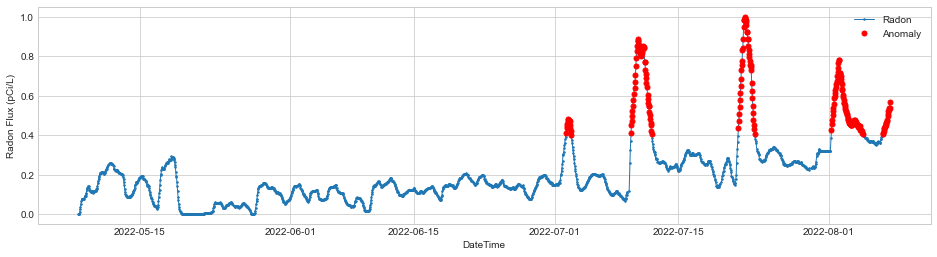

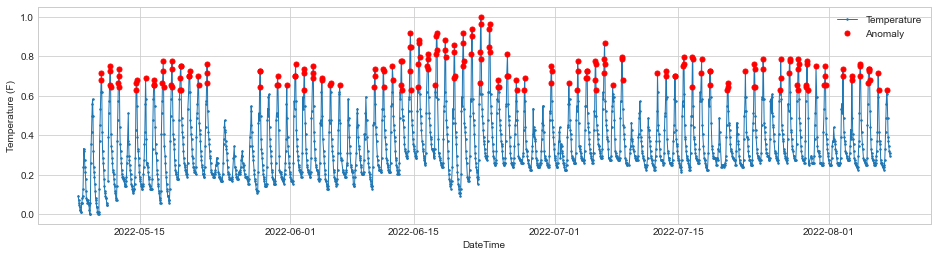

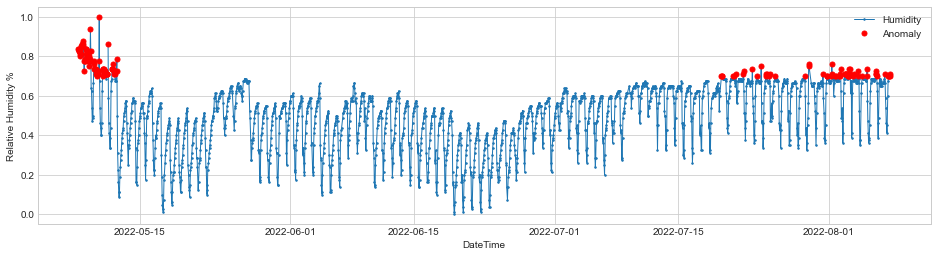

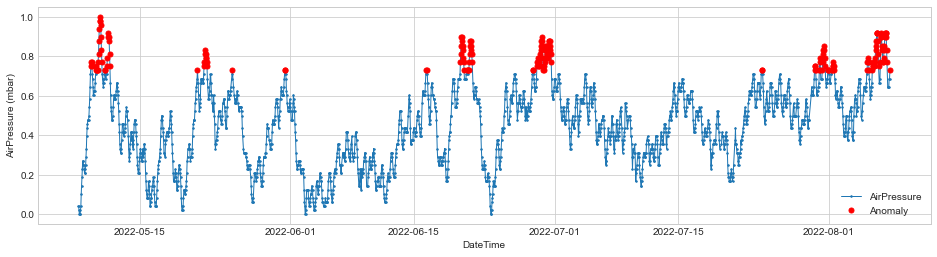

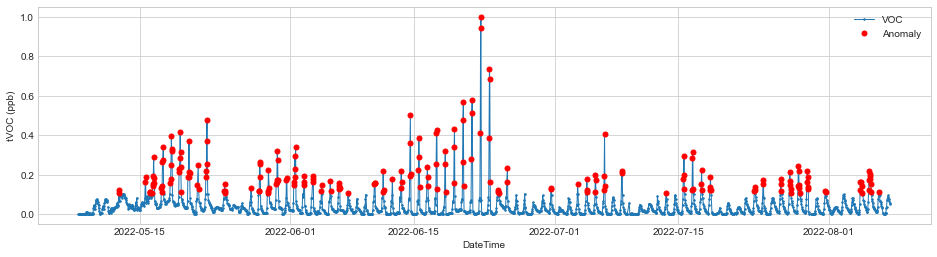

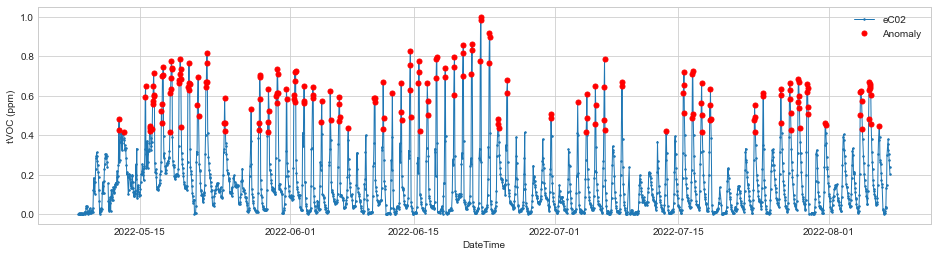

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.07342253898741986
Temp_lag_1 0.06934930032916772
Temp_lead_1 0.07719040931659989

Temp_lag_2 0.06504327730065285
Temp_lead_2 0.08005653460756032

Temp_lag_3 0.060772254170166115
Temp_lead_3 0.08228057455558373

Temp_lag_4 0.056415707870916924
Temp_lead_4 0.08404182448081775

Temp_lag_5 0.05249022207943455
Temp_lead_5 0.08514314746161729

Temp_lag_6 0.048730313049191
Temp_lead_6 0.08558342714597324

Temp_lag_7 0.04480225763803699
Temp_lead_7 0.08559465887749375

Temp_lag_8 0.04029453828489067
Temp_lead_8 0.085183522119565

Temp_lag_9 0.03611703044658073
Temp_lead_9 0.0845622581974106

----------------------------------------------------------
Humidity 0.3197934820946767
Hum_lag_1 0.3235300514419211
Hum_lead_1 0.31711704124494616
Hum_lag_2 0.3271563636429537
Hum_lead_2 0.3145379291820278
Hum_lag_3 0.3305775779790236
Hum_lead_3 0.3126614310824735
Hum_lag_4 0.3340419919532325
Hum_lead_4 0.3109922527712295
Hum_lag_5 0.337207869431223
Hum_lead_5 0.30978980083902896
Hum_lag_6 0.

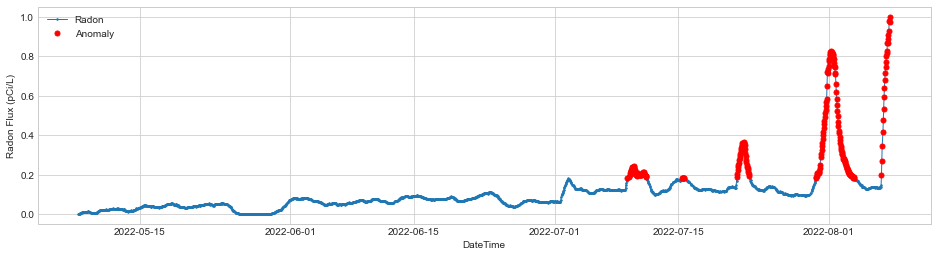

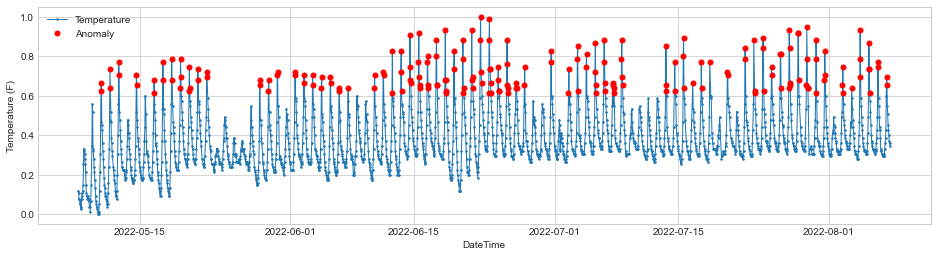

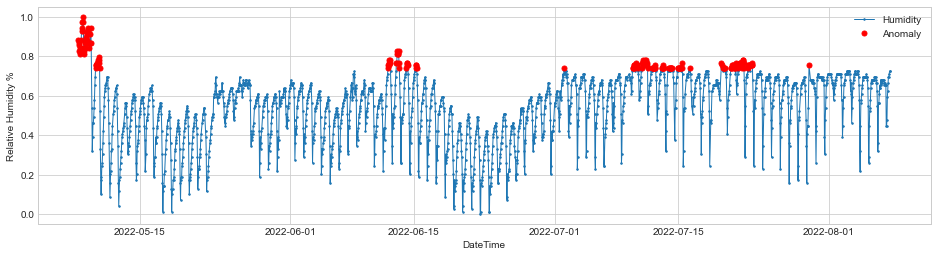

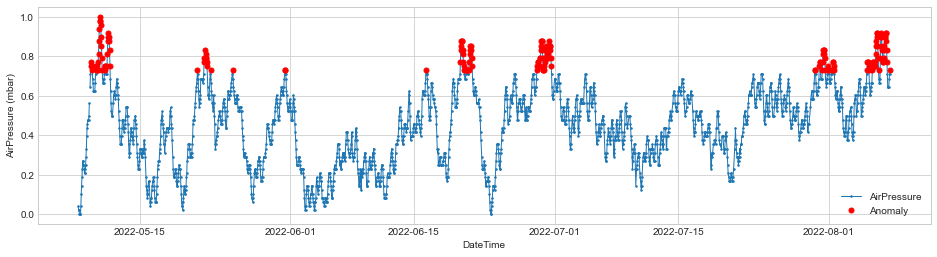

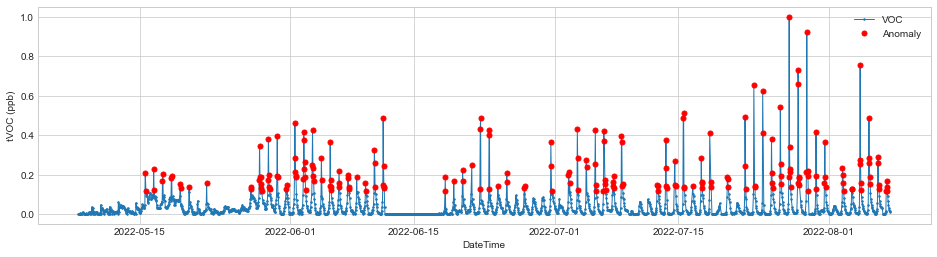

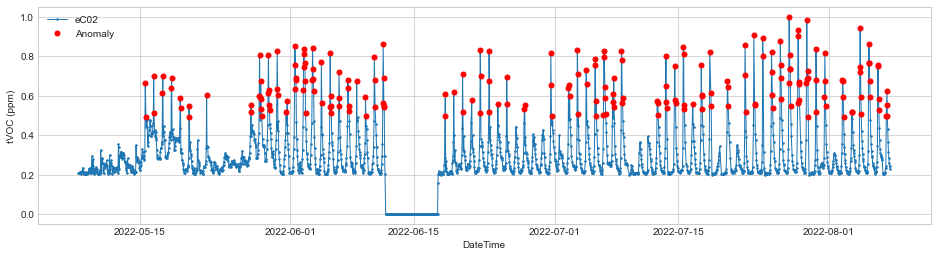

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.13237131575786995
Temp_lag_1 0.1313296635060828
Temp_lead_1 0.13378836845912817

Temp_lag_2 0.13096343937156357
Temp_lead_2 0.13562151906240147

Temp_lag_3 0.13054345004426685
Temp_lead_3 0.13718149707902363

Temp_lag_4 0.12968315454232773
Temp_lead_4 0.13826543383332274

Temp_lag_5 0.12880523780039463
Temp_lead_5 0.13912567142191423

Temp_lag_6 0.12794668380085514
Temp_lead_6 0.1397806707823107

Temp_lag_7 0.12647826769956888
Temp_lead_7 0.1392883050758476

Temp_lag_8 0.12408655779476882
Temp_lead_8 0.13801045978492088

Temp_lag_9 0.11988383296507034
Temp_lead_9 0.13661848271025065

----------------------------------------------------------
Humidity 0.255937630422988
Hum_lag_1 0.2560546601833014
Hum_lead_1 0.258561720567632
Hum_lag_2 0.2552255177009505
Hum_lead_2 0.26040804895895503
Hum_lag_3 0.25429518176273513
Hum_lead_3 0.2623821510942762
Hum_lag_4 0.2535741097344119
Hum_lead_4 0.2639008065224058
Hum_lag_5 0.25240757310812684
Hum_lead_5 0.2649617676029275
Hum_lag_6 0.

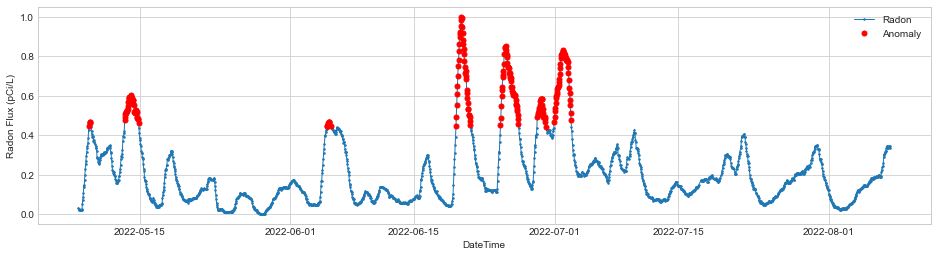

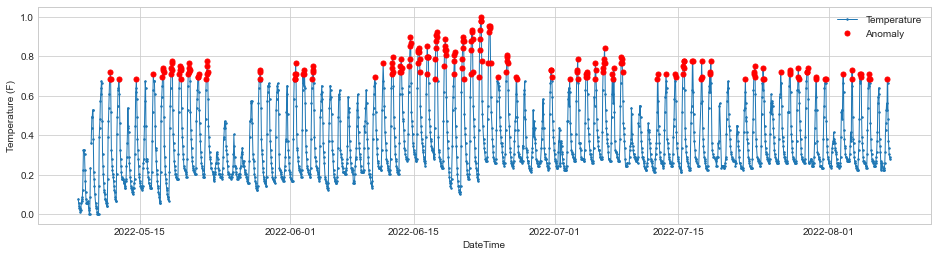

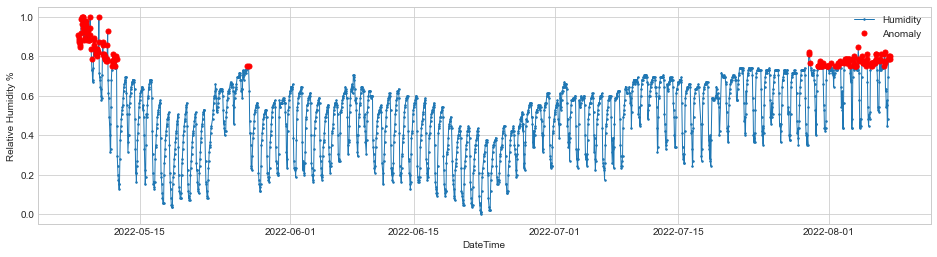

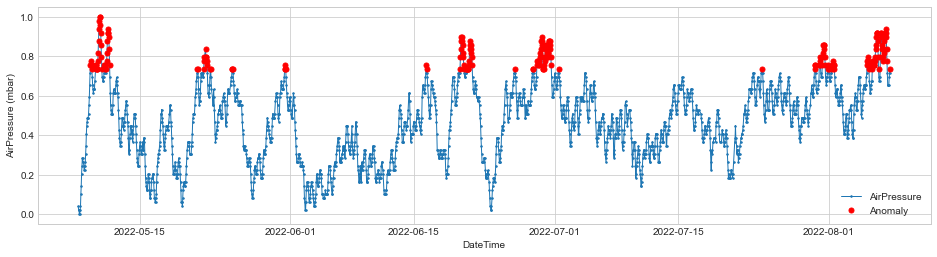

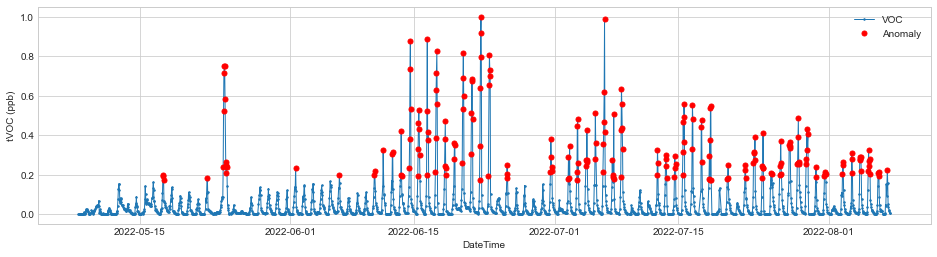

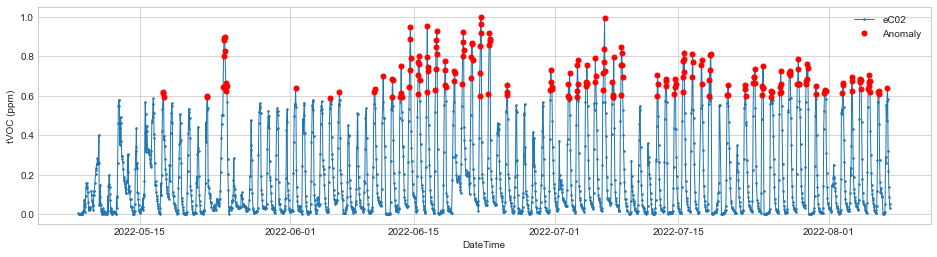

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature -0.010662399849493347
Temp_lag_1 -0.01288577473495922
Temp_lead_1 -0.008586835750774091

Temp_lag_2 -0.015119895502866593
Temp_lead_2 -0.00715991230700168

Temp_lag_3 -0.01744151321529844
Temp_lead_3 -0.005849603165051753

Temp_lag_4 -0.019900536489921586
Temp_lead_4 -0.0043668083058982345

Temp_lag_5 -0.02203765188779432
Temp_lead_5 -0.0028721167997088643

Temp_lag_6 -0.024144344790784276
Temp_lead_6 -0.0019048282054897692

Temp_lag_7 -0.026665438183646688
Temp_lead_7 -0.000779073041924221

Temp_lag_8 -0.028922271071983568
Temp_lead_8 0.00023556718109954533

Temp_lag_9 -0.030481476444280137
Temp_lead_9 0.0008236183803206266

----------------------------------------------------------
Humidity -0.08340438467959044
Hum_lag_1 -0.08524591518737795
Hum_lead_1 -0.08384480816740263
Hum_lag_2 -0.0856353179188781
Hum_lead_2 -0.08268748571868842
Hum_lag_3 -0.08544095139272724
Hum_lead_3 -0.08150998882242387
Hum_lag_4 -0.08561631329659238
Hum_lead_4 -0.08083420892765736
Hum_lag_5 -0.0

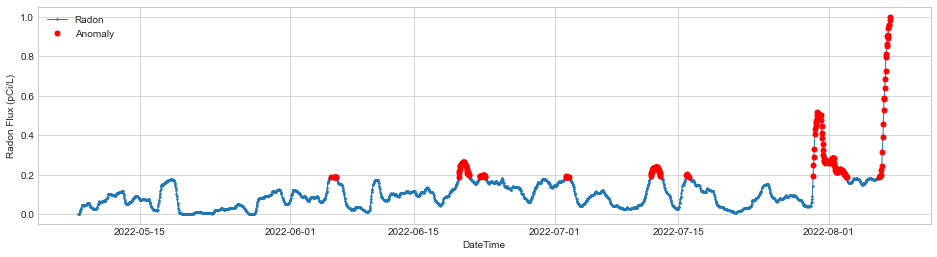

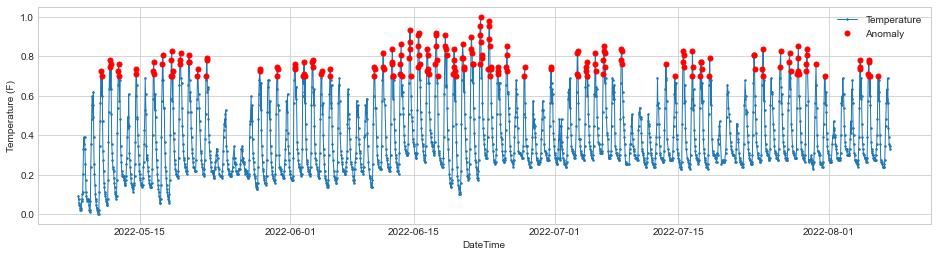

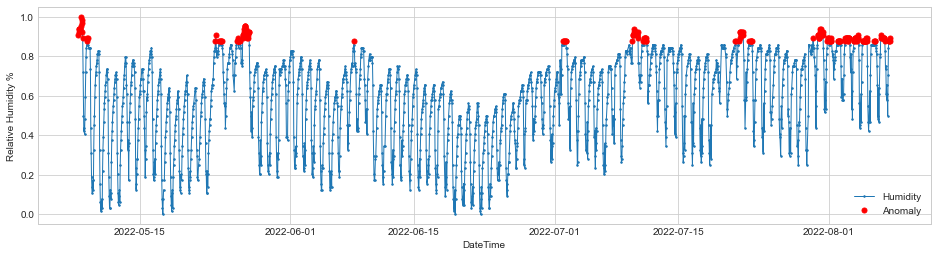

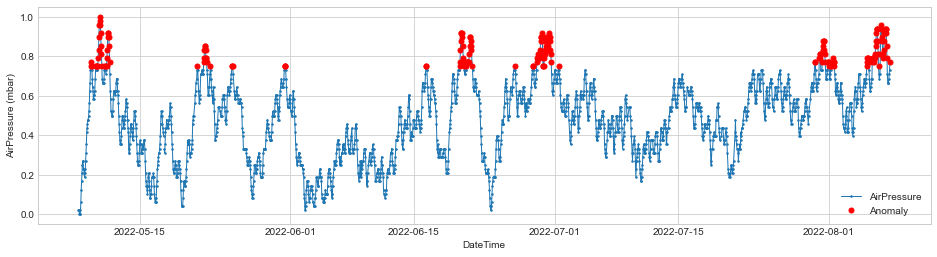

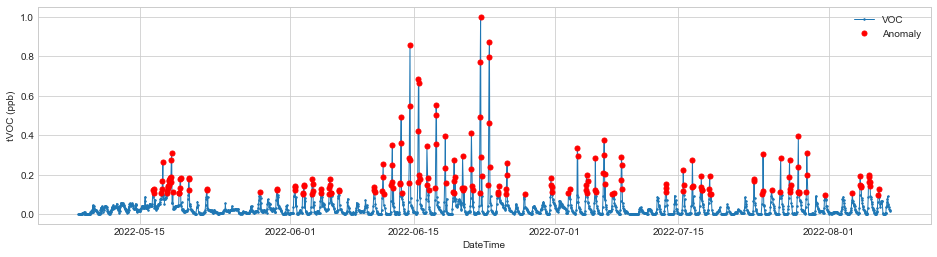

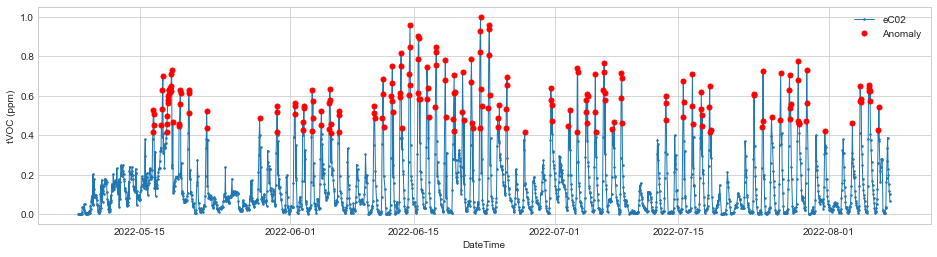

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.08933124898841142
Temp_lag_1 0.08613351908814813
Temp_lead_1 0.09392089766749048

Temp_lag_2 0.08238912877346251
Temp_lead_2 0.0977067337173208

Temp_lag_3 0.07845520044461933
Temp_lead_3 0.10051560852821967

Temp_lag_4 0.07398873997888576
Temp_lead_4 0.10199413095728961

Temp_lag_5 0.06898171910653857
Temp_lead_5 0.10264449752458206

Temp_lag_6 0.06179640932677323
Temp_lead_6 0.1018857905543106

Temp_lag_7 0.0527016451484742
Temp_lead_7 0.10045823636527458

Temp_lag_8 0.04697498310242915
Temp_lead_8 0.09852480537930568

Temp_lag_9 0.04051224481230494
Temp_lead_9 0.09617516052094123

----------------------------------------------------------
Humidity 0.03227406698716544
Hum_lag_1 0.03314712721839477
Hum_lead_1 0.02832898132068592
Hum_lag_2 0.034248345922931404
Hum_lead_2 0.024945725119815382
Hum_lag_3 0.03528093962444991
Hum_lead_3 0.022425938221505994
Hum_lag_4 0.0363226353132617
Hum_lead_4 0.020903836663223985
Hum_lag_5 0.03763150230617796
Hum_lead_5 0.01995325852335851

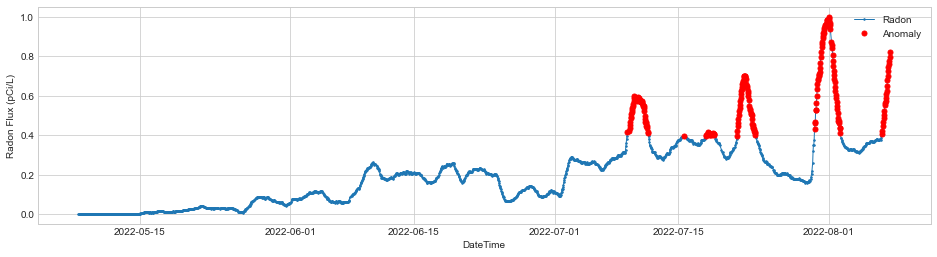

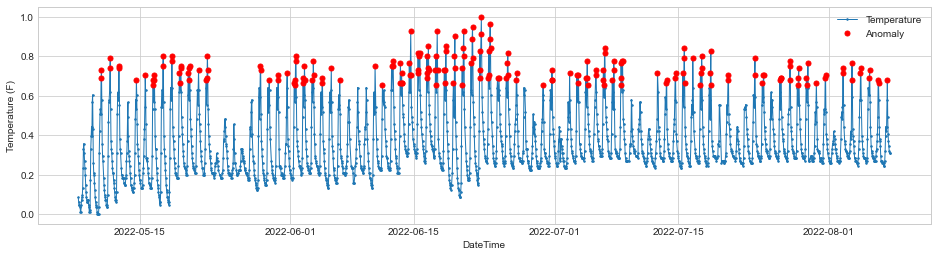

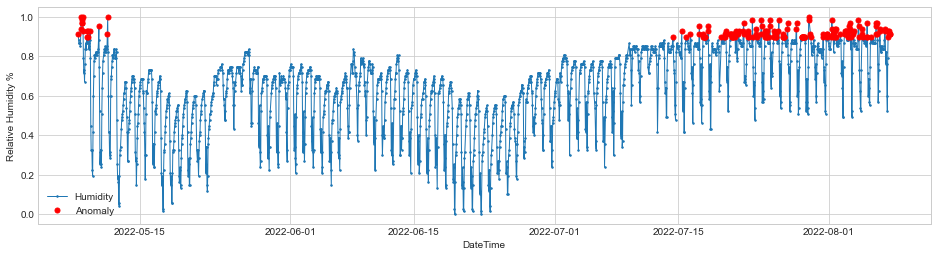

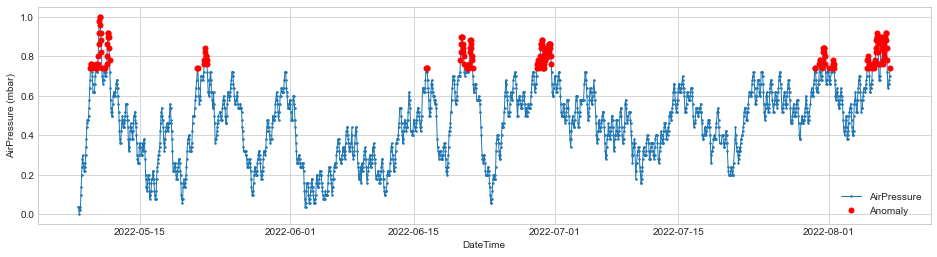

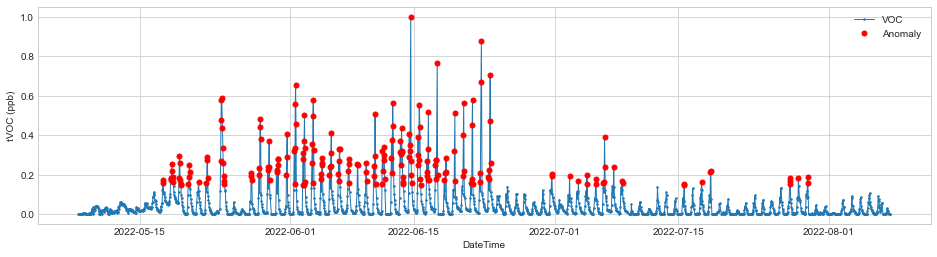

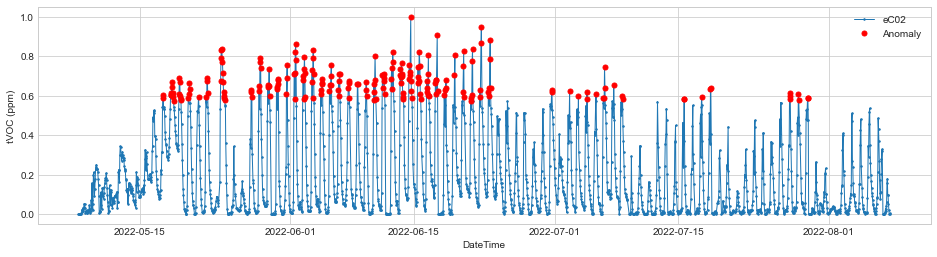

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.1243545765849028
Temp_lag_1 0.12400546703876555
Temp_lead_1 0.12312335189456924

Temp_lag_2 0.12461046214373105
Temp_lead_2 0.12269433282155127

Temp_lag_3 0.12523283750102424
Temp_lead_3 0.12213829394797125

Temp_lag_4 0.12559673726388312
Temp_lead_4 0.1216281805328985

Temp_lag_5 0.12606772657499776
Temp_lead_5 0.12196315675388783

Temp_lag_6 0.12543581441991855
Temp_lead_6 0.12114403076090258

Temp_lag_7 0.12428561507970813
Temp_lead_7 0.12031019938873715

Temp_lag_8 0.12149877445890792
Temp_lead_8 0.11950126242167032

Temp_lag_9 0.11950725913594896
Temp_lead_9 0.1187586693157443

----------------------------------------------------------
Humidity 0.40472028241191016
Hum_lag_1 0.4051068398119742
Hum_lead_1 0.40610213677569706
Hum_lag_2 0.40459250401047
Hum_lead_2 0.40663047021642024
Hum_lag_3 0.40403901722187846
Hum_lead_3 0.407315549432108
Hum_lag_4 0.4034247948287184
Hum_lead_4 0.4079034832795866
Hum_lag_5 0.4020232222561508
Hum_lead_5 0.4072903482036067
Hum_lag_6 0.

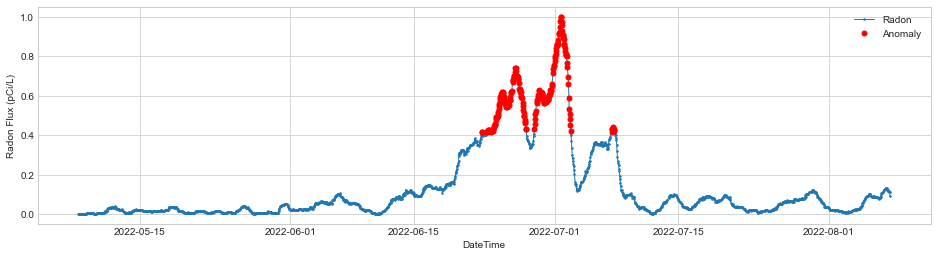

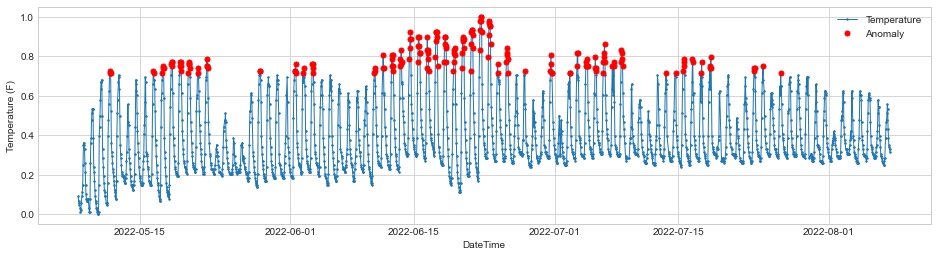

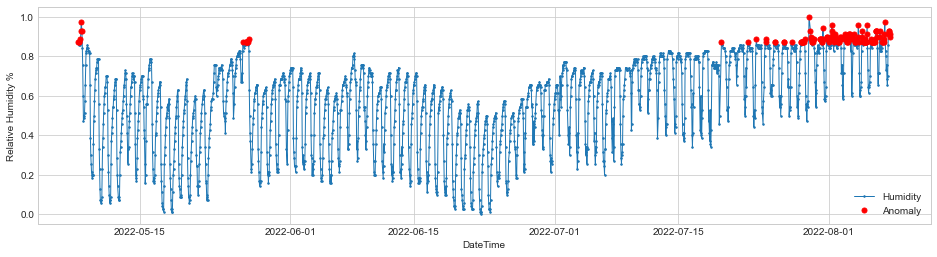

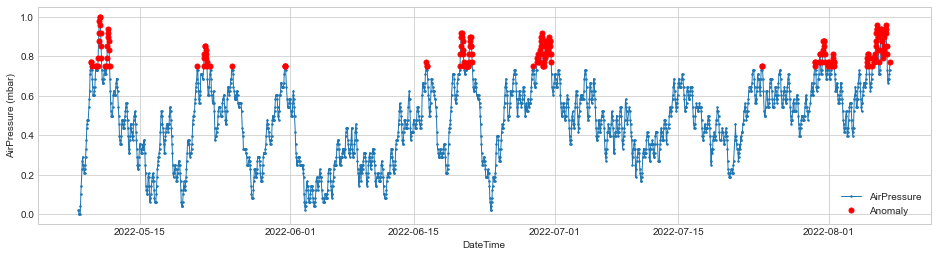

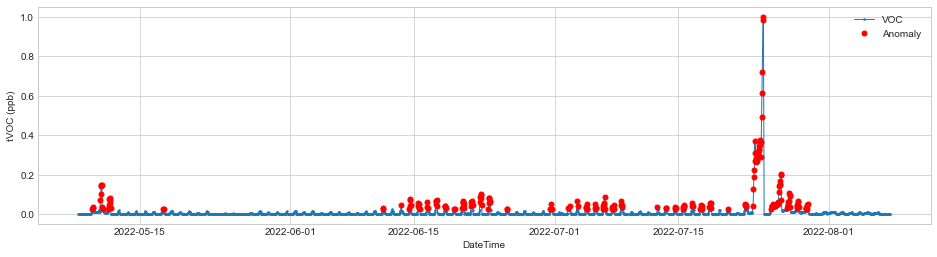

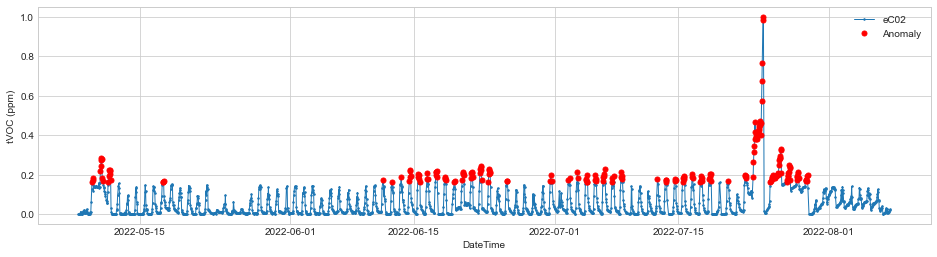

D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:81: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
D:\Anaconda\envs\ML\lib\site-packages\ipykernel_launcher.py:83: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use 

Temperature 0.12405576474544225
Temp_lag_1 0.12340687473864183
Temp_lead_1 0.12365878028829234

Temp_lag_2 0.1238931918216782
Temp_lead_2 0.1237011166857498

Temp_lag_3 0.12472583105225311
Temp_lead_3 0.12394465382331839

Temp_lag_4 0.1259208013371963
Temp_lead_4 0.12424224871964713

Temp_lag_5 0.12761352605888782
Temp_lead_5 0.12510924808612958

Temp_lag_6 0.12885267243934667
Temp_lead_6 0.12521159475037552

Temp_lag_7 0.13011662543246852
Temp_lead_7 0.12529379979851665

Temp_lag_8 0.1313671336145865


KeyboardInterrupt: 

In [23]:
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
for key in df_radon:
    print(key)
    df = df_radon[key]
    df['SyncDate'] = pd.to_datetime(df['SyncDate'])
    df.sort_values(by='SyncDate', ascending=True, inplace=True)
    df['SyncDate'] = df['SyncDate'].dt.floor('H')
    df = df.resample('H', on = 'SyncDate').mean()
    df.drop_duplicates(inplace=True)
    df['temp_outdoor'] = weather_station['Outdoor Temperature (°F)']
    df['humidity_outdoor'] = weather_station['Outdoor Humidity (%)']
    df['temp_feels_like'] = weather_station['Feels Like (°F)']
    df['rain'] = weather_station['Hourly Rain (in/hr)']
    sc = MinMaxScaler()
    df = pd.DataFrame(sc.fit_transform(df), index = df.index, columns = df.columns)
    s_rad = pd.Series(df['Radon'], index=df.index)
    s_rad = validate_series(s_rad)
    q_ad = QuantileAD(high=0.9)
    anomalies_radon = q_ad.fit_detect(s_rad)
    plot(s_rad, anomaly=anomalies_radon, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker", )
    plt.xlabel('DateTime')
    plt.ylabel('Radon Flux (pCi/L)')
    plt.show()
    df['anomalies_radon'] = anomalies_radon
    s_temp = pd.Series(df['Temperature'], index=df.index)
    s_temp = validate_series(s_temp)
    q_ad = QuantileAD(high=0.9)
    anomalies_temp = q_ad.fit_detect(s_temp)
    plot(s_temp, anomaly=anomalies_temp, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker")
    plt.xlabel('DateTime')
    plt.ylabel('Temperature (F)')
    plt.show()
    df['anomalies_temp'] = anomalies_temp
    s_hum = pd.Series(df['Humidity'], index=df.index)
    s_hum = validate_series(s_hum)
    q_ad = QuantileAD(high=0.9)
    anomalies_hum = q_ad.fit_detect(s_hum)
    plot(s_hum, anomaly=anomalies_hum, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker");
    plt.xlabel('DateTime')
    plt.ylabel('Relative Humidity %')
    plt.show()
    df['anomalies_hum'] = anomalies_hum
    s_pres = pd.Series(df['AirPressure'], index=df.index)
    s_pres = validate_series(s_pres)
    q_ad = QuantileAD(high=0.9)
    anomalies_pres = q_ad.fit_detect(s_pres)
    plot(s_pres, anomaly=anomalies_pres, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker");
    plt.xlabel('DateTime')
    plt.ylabel('AirPressure (mbar)')
    plt.show()
    df['anomalies_pres'] = anomalies_pres
    s_VOC = pd.Series(df['VOC'], index=df.index)
    s_VOC = validate_series(s_VOC)
    q_ad = QuantileAD(high=0.9)
    anomalies_VOC = q_ad.fit_detect(s_VOC)
    plot(s_VOC, anomaly=anomalies_VOC, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker");
    plt.xlabel('DateTime')
    plt.ylabel('tVOC (ppb)')
    plt.show()
    df['anomalies_VOC'] = anomalies_VOC
    s_eC02 = pd.Series(df['eC02'], index=df.index)
    s_eC02 = validate_series(s_eC02)
    q_ad = QuantileAD(high=0.9)
    anomalies_eC02 = q_ad.fit_detect(s_eC02)
    plot(s_eC02, anomaly=anomalies_eC02, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker");
    plt.xlabel('DateTime')
    plt.ylabel('tVOC (ppm)')
    plt.show()
    df['anomalies_eC02'] = anomalies_eC02
    for i in range(1,10):
        df['Temp_lag_'+str(i)] = df['Temperature'].shift(i)
        df['Temp_anomaly_lag_'+str(i)] = df['anomalies_temp'].shift(i)
        df['Temp_lead_'+str(i)] = df['Temperature'].shift(-i)
        df['Temp_anomaly_lead_'+str(i)] = df['anomalies_temp'].shift(-i)
        df['Hum_lag_'+str(i)] = df['Humidity'].shift(i)
        df['Hum_anomaly_lag_'+str(i)] = df['anomalies_hum'].shift(i)
        df['Hum_lead_'+str(i)] = df['Humidity'].shift(-i)
        df['Hum_anomaly_lead_'+str(i)] = df['anomalies_hum'].shift(-i)
        df['Pres_lag_'+str(i)] = df['AirPressure'].shift(i)
        df['Pres_anomaly_lag_'+str(i)] = df['anomalies_pres'].shift(i)
        df['Pres_lead_'+str(i)] = df['AirPressure'].shift(-i)
        df['Pres_anomaly_lead_'+str(i)] = df['anomalies_pres'].shift(-i)
        df['VOC_lag_'+str(i)] = df['VOC'].shift(i)
        df['VOC_anomaly_lag_'+str(i)] = df['anomalies_VOC'].shift(i)
        df['VOC_lead_'+str(i)] = df['VOC'].shift(-i)
        df['VOC_anomaly_lead_'+str(i)] = df['anomalies_VOC'].shift(-i)
        df['eC02_lag_'+str(i)] = df['eC02'].shift(i)
        df['eC02_anomaly_lag_'+str(i)] = df['anomalies_eC02'].shift(i)
        df['eC02_lead_'+str(i)] = df['eC02'].shift(-i)
        df['eC02_anomaly_lead_'+str(i)] = df['anomalies_eC02'].shift(-i)
        df['temp_outdoor_lag_'+str(i)] = df['temp_outdoor'].shift(i)
        df['temp_outdoor_lead_'+str(i)] = df['temp_outdoor'].shift(-i)
        df['humidity_outdoor_lag_'+str(i)] = df['humidity_outdoor'].shift(i)
        df['humidity_outdoor_lead_'+str(i)] = df['humidity_outdoor'].shift(-i)
        df['temp_feels_like_lag_'+str(i)] = df['temp_feels_like'].shift(i)
        df['temp_feels_like_lead_'+str(i)] = df['temp_feels_like'].shift(-i)
        df['rain_lag_'+str(i)] = df['rain'].shift(i)
        df['rain_lead_'+str(i)] = df['rain'].shift(-i)
    print("Temperature" ,df.corr()['Radon']['Temperature'])
    for i in range(1,10): 
        print(f"Temp_lag_{i}", df.corr()['Radon'][f'Temp_lag_{i}'])
        print(f"Temp_lead_{i}", df.corr()['Radon'][f'Temp_lead_{i}'])
        print()
    print("----------------------------------------------------------")
    print("Humidity",df.corr()['Radon']['Humidity'])
    for i in range(1,10):
        print(f"Hum_lag_{i}", df.corr()['Radon'][f'Hum_lag_{i}'])
        print(f"Hum_lead_{i}", df.corr()['Radon'][f'Hum_lead_{i}'])
    print("----------------------------------------------------------")
    print("Pressure",df.corr()['Radon']['AirPressure'])
    for i in range(1,10):
        print(f"Pres_lag_{i}", df.corr()['Radon'][f'Pres_lag_{i}'])
        print(f"Pres_lead_{i}", df.corr()['Radon'][f'Pres_lead_{i}'])
    print("----------------------------------------------------------")
    print("VOC",df.corr()['Radon']['VOC'])
    for i in range(1,10):
        print(f"VOC_lag_{i}", df.corr()['Radon'][f'VOC_lag_{i}'])
        print(f"VOC_lead_{i}", df.corr()['Radon'][f'VOC_lead_{i}'])
    print("----------------------------------------------------------")
    print("eC02",df.corr()['Radon']['eC02'])
    for i in range(1,10):
        print(f"eC02_lag_{i}", df.corr()['Radon'][f'eC02_lag_{i}'])
        print(f"eC02_lead_{i}", df.corr()['Radon'][f'eC02_lead_{i}'])
    print("----------------------------------------------------------")
    print("outdoor temperature",df.corr()['Radon']['temp_outdoor'])
    for i in range(1,10):
        print(f"outdoor temperature_lag_{i}", df.corr()['Radon'][f'temp_outdoor_lag_{i}'])
        print(f"outdoor temperature_lead_{i}", df.corr()['Radon'][f'temp_outdoor_lead_{i}'])
    print("----------------------------------------------------------")
    print("humidity outdoor",df.corr()['Radon']['humidity_outdoor'])
    for i in range(1,10):
        print(f"humidity_outdoor_lag_{i}", df.corr()['Radon'][f'humidity_outdoor_lag_{i}'])
        print(f"humidity_outdoor_lead_{i}", df.corr()['Radon'][f'humidity_outdoor_lead_{i}'])
    print("----------------------------------------------------------")
    print("Feels like",df.corr()['Radon']['temp_feels_like'])
    for i in range(1,10):
        print(f"temp_feels_like_lag_{i}", df.corr()['Radon'][f'temp_feels_like_lag_{i}'])
        print(f"temp_feels_like_lead_{i}", df.corr()['Radon'][f'temp_feels_like_lead_{i}'])
    print("----------------------------------------------------------")
    print("rain",df.corr()['Radon']['rain'])
    for i in range(1,10):
        print(f"rain_lag_{i}", df.corr()['Radon'][f'rain_lag_{i}'])
        print(f"rain_lead_{i}", df.corr()['Radon'][f'rain_lead_{i}'])
    print("----------------------------------------------------------")
    print()
    print()

In [ ]:
nodes = [44, 27, 20, 3, 1]
16, 29, 48

In [22]:
df_radon['16']['SyncDate'] = pd.to_datetime(df_radon['16']['SyncDate'])
df_radon['16'].sort_values(by='SyncDate', ascending=True, inplace=True)
df_radon['16']['SyncDate'] = df_radon['16']['SyncDate'].dt.floor('H')
df_radon['16'] = df_radon['16'].resample('H', on = 'SyncDate').mean()
df_radon['16'].drop_duplicates(inplace=True)
df_radon['29']['SyncDate'] = pd.to_datetime(df_radon['29']['SyncDate'])
df_radon['29'].sort_values(by='SyncDate', ascending=True, inplace=True)
df_radon['29']['SyncDate'] = df_radon['29']['SyncDate'].dt.floor('H')
df_radon['29'] = df_radon['29'].resample('H', on = 'SyncDate').mean()
df_radon['29'].drop_duplicates(inplace=True)
df_radon['48']['SyncDate'] = pd.to_datetime(df_radon['48']['SyncDate'])
df_radon['48'].sort_values(by='SyncDate', ascending=True, inplace=True)
df_radon['48']['SyncDate'] = df_radon['48']['SyncDate'].dt.floor('H')
df_radon['48'] = df_radon['48'].resample('H', on = 'SyncDate').mean()
df_radon['48'].drop_duplicates(inplace=True)

In [1]:
df_radon['16']['Radon'].plot(use_index=True, label='16 3 feet', color='r')
df_radon['29']['Radon'].plot(use_index=True, label='29 5 feet', color='g')
df_radon['48']['Radon'].plot(use_index=True, label='surface', color='b')
plt.show()

NameError: name 'df_radon' is not defined

In [29]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
surface = scaler.fit_transform(df_radon['16']['Radon'].values.reshape(-1,1))
feet_3 = scaler.fit_transform(df_radon['48']['Radon'].values.reshape(-1,1))
feet_5 = scaler.fit_transform(df_radon['29']['Radon'].values.reshape(-1,1))

ValueError: Expected 2D array, got 1D array instead:
array=[0.5 0.6 0.6 ... 1.3 1.3 1.3].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [ ]:
df_radon['16']['Radon'].plot(use_index=True, label='16', color='r')
df_radon['39']['Radon'].plot(use_index=True, label='16', color='r')